In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

FOLDERNAME = 'comp4211/'
assert FOLDERNAME is not None, "[1]Enter the foldername."

import sys
sys.path.append('/content/drive/My Drive/{}'.format(FOLDERNAME))

Mounted at /content/drive


In [ ]:
#!unzip "drive/My Drive/comp4211/proj1/archive.zip" -d "drive/My Drive/comp4211/proj1/"

In [ ]:
!ls "drive/My Drive/comp4211/proj1/"

anno_length.csv   baseline_tf3.pt  images		 proj1_data.csv
annotations	  base_para1.pt    img_Retinaface	 proj1_retina_label.csv
archive.zip	  base_para2.pt    modified_res18_ft.pt  proj1_truth_label.csv
baseline.pt	  clip_images	   modified_res18.pt	 Retinaface_annot.csv
baseline_test.pt  df_base.csv	   modified_vgg_ft.pt	 Retina_path.csv
baseline_tf1.pt   df_vgg.csv	   modified_vgg.pt	 train_split.csv
baseline_tf2.pt   df_vgg_ft.csv    proj1.csv		 valid_split.csv


##imaging preprocessing

###Face mask dataset on kaggle

In [ ]:
PATH = '/content/drive/My Drive/comp4211/proj1/' 

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from bs4 import BeautifulSoup
import torchvision
from torchvision import transforms, datasets, models
import torch
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
import matplotlib.patches as patches
import os
from tqdm.notebook import tqdm
from torch import optim 
# pip install tqdm

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [ ]:
#basic function for generating data

def generate_box(obj):
    
    xmin = int(obj.find('xmin').text)
    ymin = int(obj.find('ymin').text)
    xmax = int(obj.find('xmax').text)
    ymax = int(obj.find('ymax').text)
    
    return [xmin, ymin, xmax, ymax]

def generate_label(obj):
    if obj.find('name').text == "with_mask":
        return 1
    elif obj.find('name').text == "mask_weared_incorrect":
        return 2
    return 0

def generate_target(image_id, file): 
    with open(file) as f:
        data = f.read()
        soup = BeautifulSoup(data, 'xml')
        objects = soup.find_all('object')

        num_objs = len(objects)

        # Bounding boxes for objects
        # In coco format, bbox = [xmin, ymin, width, height]
        # In pytorch, the input should be [xmin, ymin, xmax, ymax]
        boxes = []
        labels = []
        for i in objects:
            boxes.append(generate_box(i))
            labels.append(generate_label(i))
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Labels (In my case, I only one class: target class or background)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        # Tensorise img_id
        img_id = torch.tensor([image_id])
        # Annotation is in dictionary format
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = img_id
        
        return target

In [ ]:
imgs_filename = list(sorted(os.listdir("/content/drive/My Drive/comp4211/proj1/images/")))
labels_filename = list(sorted(os.listdir("/content/drive/My Drive/comp4211/proj1/annotations/")))

In [ ]:
class MaskDataset(object):
    def __init__(self, transforms):
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir("/content/drive/My Drive/comp4211/proj1/images/")))
        # self.labels = list(sorted(os.listdir("/kaggle/input/face-mask-detection/annotations/")))

    def __getitem__(self, idx):
        # load images ad masks
        file_image = 'maksssksksss'+ str(idx) + '.png'
        file_label = 'maksssksksss'+ str(idx) + '.xml'
        img_path = os.path.join("/content//drive/My Drive/comp4211/proj1/images/", file_image)
        label_path = os.path.join("/content/drive/My Drive/comp4211/proj1/annotations/", file_label)
        img = Image.open(img_path).convert("RGB")
        #Generate Label
        target = generate_target(idx, label_path)
        
        if self.transforms is not None:
            img = self.transforms(img)

        return img, target

    def __len__(self):
        return len(self.imgs)

In [ ]:
data_transform = transforms.Compose([
        transforms.ToTensor(), 
    ])
data_resize = transforms.Compose([transforms.Resize((32,32)),
        transforms.ToTensor(), 
    ])

In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

dataset = MaskDataset(data_transform)
dataset_resize = MaskDataset(data_resize)
data_loader = torch.utils.data.DataLoader(
dataset, batch_size=4, collate_fn=collate_fn)
data_loader_demo = torch.utils.data.DataLoader(
dataset_resize, batch_size=64, collate_fn=collate_fn)

In [ ]:
torch.cuda.is_available()

True

In [ ]:
!ls '/content/drive/My Drive/comp4211/proj1/images/maksssksksss0.png'

'/content/drive/My Drive/comp4211/proj1/images/maksssksksss0.png'


In [ ]:
for imgs, annotations in data_loader:
  print(imgs)
  imgs = list(img.to(device) for img in imgs)
  annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
  print(annotations)
  break

(tensor([[[0.4431, 0.4314, 0.3843,  ..., 0.1569, 0.2824, 0.3373],
         [0.4118, 0.3882, 0.3451,  ..., 0.1529, 0.1882, 0.3098],
         [0.3765, 0.3569, 0.3255,  ..., 0.1490, 0.1216, 0.2784],
         ...,
         [0.3333, 0.3412, 0.3569,  ..., 0.1098, 0.1098, 0.1137],
         [0.3373, 0.3490, 0.3608,  ..., 0.1137, 0.1137, 0.1176],
         [0.3647, 0.3765, 0.3922,  ..., 0.1176, 0.1176, 0.1216]],

        [[0.4353, 0.4235, 0.3765,  ..., 0.2314, 0.3843, 0.4549],
         [0.3922, 0.3804, 0.3373,  ..., 0.2275, 0.2863, 0.4275],
         [0.3608, 0.3412, 0.3098,  ..., 0.2235, 0.2235, 0.3922],
         ...,
         [0.3255, 0.3333, 0.3490,  ..., 0.1059, 0.1059, 0.1098],
         [0.3294, 0.3412, 0.3529,  ..., 0.1098, 0.1098, 0.1137],
         [0.3569, 0.3686, 0.3843,  ..., 0.1137, 0.1137, 0.1176]],

        [[0.4549, 0.4431, 0.3961,  ..., 0.4000, 0.6157, 0.7294],
         [0.4157, 0.3922, 0.3490,  ..., 0.3843, 0.5059, 0.6784],
         [0.3647, 0.3451, 0.3137,  ..., 0.3529, 0.4118, 0

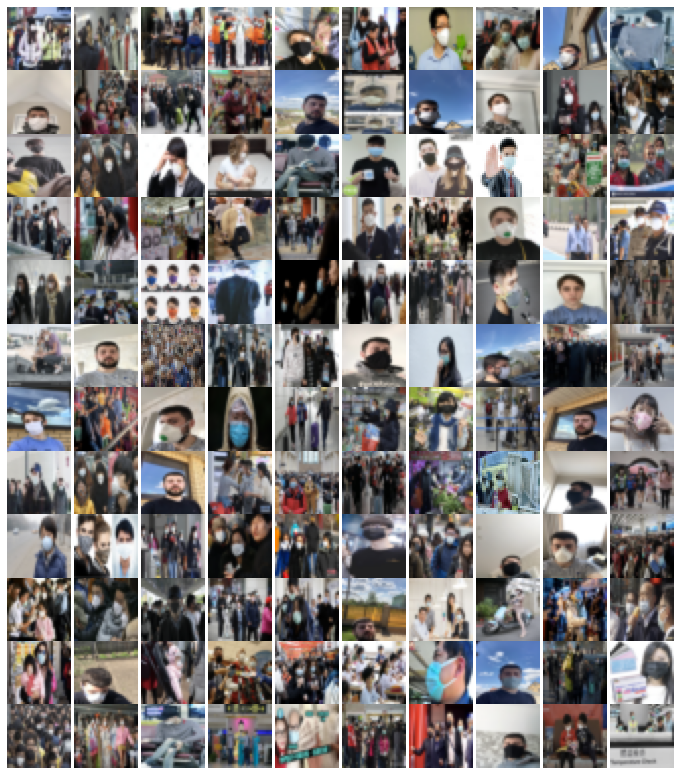

In [ ]:
plt.figure(figsize = (12,14))

count = 1
for input, labels in tqdm(data_loader_demo):
  if count == 121:
      break
  for i in range(0,64):
    if count == 121:
      break
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None,wspace =0, hspace =0)
    plt.subplot(12,10,count)
    plt.axis('off')
    plt.imshow(input[i].permute(1, 2, 0))
    count+=1
plt.show()

In [ ]:
import matplotlib.pyplot as plt
def plot_image(img_tensor, annotation):
    fig,ax = plt.subplots(1)
    img = img_tensor.cpu().data

    # Display the image
    ax.imshow(img.permute(1, 2, 0))
    i = 0
    for box in annotation["boxes"]:
        xmin, ymin, xmax, ymax = box
        lab =  annotation["labels"][i]
        text = ''
        if lab == 1:
          text = "with_mask"
        elif lab == 0:
          text = "without_mask"
        else:
          text = "mask_weared_incorrect"
        # Create a Rectangle patch
        rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='r',facecolor='none')
        plt.text(xmin, ymin, text, color = "red")
        # Add the patch to the Axes
        ax.add_patch(rect)
        i+=1
        
        
    plt.show()

Images demo


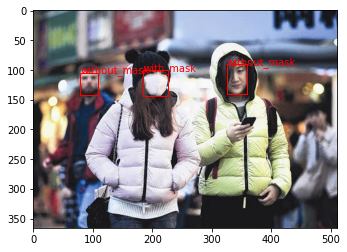

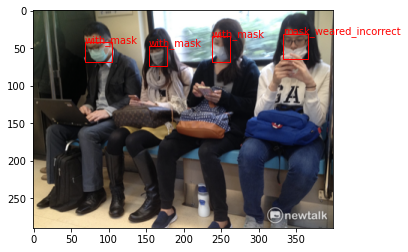

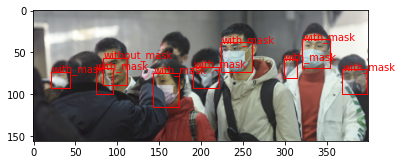

In [ ]:
print("Images demo")


plot_image(imgs[0], annotations[0])
plot_image(imgs[2], annotations[2])
plot_image(imgs[1], annotations[1])

###clip the images

In [ ]:
len(imgs_filename)

853

In [ ]:
#clip the image
import PIL.Image as img
import os
'''
labels = []
count = 0
for i in tqdm(range(len(imgs_filename))):
  file_image = 'maksssksksss'+ str(i) + '.png'
  file_label = 'maksssksksss'+ str(i) + '.xml'
  img_path = os.path.join("/content//drive/My Drive/comp4211/proj1/images/", file_image)
  label_path = os.path.join("/content/drive/My Drive/comp4211/proj1/annotations/", file_label)
  img = Image.open(img_path).convert("RGB")
  #Generate Label
  annot = generate_target(i, label_path)
  label = annot["labels"]
  labels.append(label.tolist())


  #clip the image
  box = annot["boxes"]
  for box_range in box:
    box_range = torch.tensor(box_range,dtype=torch.int32)
    #print(box_range.tolist())
    clip_img = img.crop(box_range.tolist())
    clip_img.save('/content/drive/My Drive/comp4211/proj1/clip_images/mask{}.png'.format(count))
    count+=1
'''


'\nlabels = []\ncount = 0\nfor i in tqdm(range(len(imgs_filename))):\n  file_image = \'maksssksksss\'+ str(i) + \'.png\'\n  file_label = \'maksssksksss\'+ str(i) + \'.xml\'\n  img_path = os.path.join("/content//drive/My Drive/comp4211/proj1/images/", file_image)\n  label_path = os.path.join("/content/drive/My Drive/comp4211/proj1/annotations/", file_label)\n  img = Image.open(img_path).convert("RGB")\n  #Generate Label\n  annot = generate_target(i, label_path)\n  label = annot["labels"]\n  labels.append(label.tolist())\n\n\n  #clip the image\n  box = annot["boxes"]\n  for box_range in box:\n    box_range = torch.tensor(box_range,dtype=torch.int32)\n    #print(box_range.tolist())\n    clip_img = img.crop(box_range.tolist())\n    clip_img.save(\'/content/drive/My Drive/comp4211/proj1/clip_images/mask{}.png\'.format(count))\n    count+=1\n'

In [ ]:
#generate label
'''
labels = []
for j in tqdm(range(len(imgs_filename))):
  #file_image = 'maksssksksss'+ str(i) + '.png'
  file_label = 'maksssksksss'+ str(j) + '.xml'
  #img_path = os.path.join("/content//drive/My Drive/comp4211/proj1/images/", file_image)
  label_path = os.path.join("/content/drive/My Drive/comp4211/proj1/annotations/", file_label)
  #img = Image.open(img_path).convert("RGB")
  
  #Generate Label
  annot = generate_target(j, label_path)
  label = annot["labels"]
  labels.append(label.tolist())
'''

'\nlabels = []\nfor j in tqdm(range(len(imgs_filename))):\n  #file_image = \'maksssksksss\'+ str(i) + \'.png\'\n  file_label = \'maksssksksss\'+ str(j) + \'.xml\'\n  #img_path = os.path.join("/content//drive/My Drive/comp4211/proj1/images/", file_image)\n  label_path = os.path.join("/content/drive/My Drive/comp4211/proj1/annotations/", file_label)\n  #img = Image.open(img_path).convert("RGB")\n  \n  #Generate Label\n  annot = generate_target(j, label_path)\n  label = annot["labels"]\n  labels.append(label.tolist())\n'

In [ ]:
#processing the label
'''
labels_data = [b for a in labels for b in a]
print(labels)
print(labels_data)
'''

'\nlabels_data = [b for a in labels for b in a]\nprint(labels)\nprint(labels_data)\n'

In [ ]:
from pandas.core.frame import DataFrame
'''
df = DataFrame(labels_data)
df.to_csv('/content/drive/My Drive/comp4211/proj1/proj1.csv', header=False, index=False)
df
'''

"\ndf = DataFrame(labels_data)\ndf.to_csv('/content/drive/My Drive/comp4211/proj1/proj1.csv', header=False, index=False)\ndf\n"

In [ ]:
'''
from pandas.core.frame import DataFrame
#generating dataframe dataset
img_clip_path = []
imgs_clip_filename = list(sorted(os.listdir("/content/drive/My Drive/comp4211/proj1/clip_images/")))
for i in tqdm(range(len(imgs_clip_filename))):
  file_image = 'mask'+ str(i) + '.png'
  img_clip_path.append(file_image)

df_img_path = DataFrame(img_clip_path)

'''

'\nfrom pandas.core.frame import DataFrame\n#generating dataframe dataset\nimg_clip_path = []\nimgs_clip_filename = list(sorted(os.listdir("/content/drive/My Drive/comp4211/proj1/clip_images/")))\nfor i in tqdm(range(len(imgs_clip_filename))):\n  file_image = \'mask\'+ str(i) + \'.png\'\n  img_clip_path.append(file_image)\n\ndf_img_path = DataFrame(img_clip_path)\n\n'

In [ ]:
'''
df_img_path
'''

'\ndf_img_path\n'

In [ ]:
'''
df_data = pd.concat([df_img_path, df_label], axis=1)
df_data.columns = ['img_name','label']
df_data.to_csv('/content/drive/My Drive/comp4211/proj1/proj1_data.csv', header=False, index=False)
df_data
'''

"\ndf_data = pd.concat([df_img_path, df_label], axis=1)\ndf_data.columns = ['img_name','label']\ndf_data.to_csv('/content/drive/My Drive/comp4211/proj1/proj1_data.csv', header=False, index=False)\ndf_data\n"

In [ ]:
imgs_clip_filename = list(sorted(os.listdir("/content/drive/My Drive/comp4211/proj1/clip_images/")))
len(imgs_clip_filename)

4072

##dataset and dataloader

In [ ]:
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, plot_confusion_matrix
from torchvision import transforms
from PIL import Image
from torch.utils.data import Dataset
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import LabelEncoder
from tqdm.notebook import tqdm
from torch import optim 
# pip install tqdm

data_path_train = '/content/drive/My Drive/comp4211/proj1/proj1_data.csv'
df_dataset = pd.read_csv(data_path_train)
df_dataset

,img_name,label
0,mask0.png,0
1,mask1.png,1
2,mask2.png,0
3,mask3.png,1
4,mask4.png,1
...,...,...
4067,mask4067.png,1
4068,mask4068.png,1
4069,mask4069.png,1
4070,mask4070.png,1


In [ ]:
train, valid = train_test_split(df_dataset, test_size=0.2, random_state=4211)
data_train_path = os.path.join(PATH, 'train_split.csv')
data_valid_path = os.path.join(PATH, 'valid_split.csv')

train.to_csv(data_train_path, header=True, index=False)
valid.to_csv(data_valid_path, header=True, index=False)

In [ ]:
train

,img_name,label
1618,mask1618.png,0
1086,mask1086.png,0
2587,mask2587.png,1
3610,mask3610.png,1
3398,mask3398.png,1
...,...,...
3310,mask3310.png,1
3575,mask3575.png,0
1104,mask1104.png,0
1340,mask1340.png,1


In [ ]:
valid

,img_name,label,img_order
2623,mask2623.png,1,-1
3306,mask3306.png,1,-1
548,mask548.png,1,-1
887,mask887.png,1,-1
1185,mask1185.png,1,-1
...,...,...,...
1987,mask1987.png,1,-1
671,mask671.png,1,-1
1880,mask1880.png,1,-1
1155,mask1155.png,1,-1


In [ ]:
img_order = []
box_order= []
box_anno = []
name = []
count = 0
for i in tqdm(range(len(imgs_filename))):
  file_label = 'maksssksksss'+ str(i) + '.xml'
  label_path = os.path.join("/content/drive/My Drive/comp4211/proj1/annotations/", file_label)
  #Generate Label
  annot = generate_target(i, label_path)
  #clip the image
  box = annot["boxes"]
  count2 = 0
  for box_range in box:
    name.append('mask{}.png'.format(count)) 
    img_order.append(i)
    box_order.append(count2)
    box_anno.append(box_range.tolist())
    count2+=1
    count+=1

In [ ]:
len(box_anno)

4072

In [ ]:
 result = DataFrame()
 result = pd.concat([DataFrame(name),DataFrame(img_order), DataFrame(box_order),DataFrame(box_anno)], axis=1)
 result.columns = ["img_name","img_order","box_order","box1","box2","box3","box4"]
 result

,img_name,img_order,box_order,box1,box2,box3,box4
0,mask0.png,0,0,79.0,105.0,109.0,142.0
1,mask1.png,0,1,185.0,100.0,226.0,144.0
2,mask2.png,0,2,325.0,90.0,360.0,141.0
3,mask3.png,1,0,321.0,34.0,354.0,69.0
4,mask4.png,1,1,224.0,38.0,261.0,73.0
...,...,...,...,...,...,...,...
4067,mask4067.png,850,1,146.0,30.0,176.0,60.0
4068,mask4068.png,850,2,323.0,47.0,351.0,78.0
4069,mask4069.png,851,0,66.0,205.0,156.0,330.0
4070,mask4070.png,852,0,139.0,94.0,198.0,147.0


In [ ]:
for i in range(len(valid_index)):
  name = valid_index.iloc[i,0]
  valid_index.iloc[i,2] = result[result['img_name'] == name].iloc[0,1]
  valid_index.iloc[i,3] = result[result['img_name'] == name].iloc[0,2]

  valid_index.iloc[i,4] = result[result['img_name'] == name].iloc[0,3]
  valid_index.iloc[i,5] = result[result['img_name'] == name].iloc[0,4]
  valid_index.iloc[i,6] = result[result['img_name'] == name].iloc[0,5]
  valid_index.iloc[i,7] = result[result['img_name'] == name].iloc[0,6]

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [ ]:
valid_index

,img_name,label,img_order,box_order,B1,B2,B3,B4
2623,mask2623.png,1,539,37,376.0,89.0,391.0,100.0
3306,mask3306.png,1,680,6,296.0,39.0,312.0,56.0
548,mask548.png,1,113,0,133.0,108.0,148.0,124.0
887,mask887.png,1,203,1,100.0,42.0,124.0,67.0
1185,mask1185.png,1,251,16,296.0,72.0,319.0,102.0
...,...,...,...,...,...,...,...,...
1987,mask1987.png,1,413,2,291.0,80.0,340.0,134.0
671,mask671.png,1,147,2,224.0,89.0,243.0,109.0
1880,mask1880.png,1,388,11,348.0,71.0,366.0,91.0
1155,mask1155.png,1,247,8,307.0,155.0,340.0,185.0


In [ ]:
valid_index.to_csv( '/content/drive/My Drive/comp4211/proj1/valid_index.csv', header=True, index=False)

In [ ]:
class MaskDataset_clip(object):
    def __init__(self, csv_file,transforms = None):
        self.transforms = transforms
        self.labels_data = pd.read_csv(csv_file)
        self.imgs_clip = list(sorted(os.listdir("/content/drive/My Drive/comp4211/proj1/clip_images/")))
        

    def __getitem__(self, idx):
        # load images ad mask
        #print("idx",idx)
        file_image = self.labels_data.iloc[idx, 0]
        #print("file_image",file_image)
        img_clip_path = os.path.join("/content/drive/My Drive/comp4211/proj1/clip_images/", file_image)
        label =  self.labels_data.iloc[idx, 1]
        #label = torch.zeros(64,3).scatter_(1,label,1)
        #print("label",label)
        img = Image.open(img_clip_path).convert("RGB")
       
        
        if self.transforms is not None:
            img = self.transforms(img)

        return img, label

    def __len__(self):
        return len(self.labels_data)

In [ ]:
transf = transforms.Compose(
    [transforms.Resize((32,32)), transforms.ToTensor(),transforms.Grayscale(num_output_channels=1)])

#transf = transforms.Compose(
    #[transforms.Resize((32,32)), transforms.ToTensor()])

train_dataest = MaskDataset_clip(data_train_path, transforms=transf)
valid_dataest = MaskDataset_clip(data_valid_path, transforms=transf)

bs = 64

train_loader = DataLoader(train_dataest, batch_size=bs, shuffle=True, num_workers=4, pin_memory=True)
valid_loader = DataLoader(valid_dataest, batch_size=1, shuffle=False, num_workers=4, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


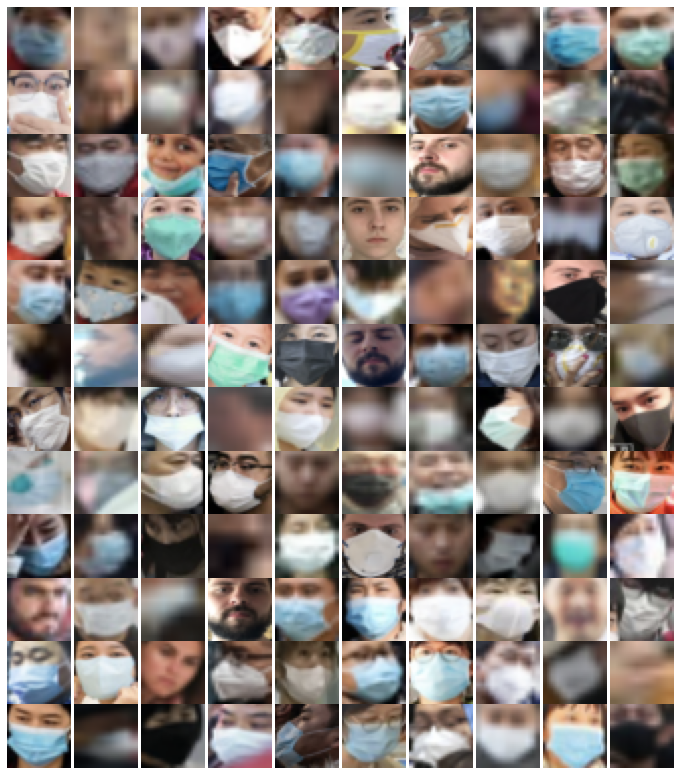

In [ ]:
plt.figure(figsize = (12,14))

count = 1
for input, labels in tqdm(train_loader):
  if count == 121:
      break
  for i in range(0,64):
    if count == 121:
      break
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None,wspace =0, hspace =0)
    plt.subplot(12,10,count)
    plt.axis('off')
    #img = Image.open(input).convert("RGB")
    plt.imshow(input[i].permute(1, 2, 0))
    count+=1
plt.show()

In [ ]:
len(train_loader)

51

In [ ]:
len(valid_loader)

815

In [ ]:
train_dataest.__getitem__(1)
print(valid_dataest.__getitem__(100))

(tensor([[[0.1373, 0.1373, 0.1667,  ..., 0.5843, 0.6271, 0.6271],
         [0.1373, 0.1373, 0.1667,  ..., 0.5843, 0.6271, 0.6271],
         [0.1366, 0.1366, 0.1683,  ..., 0.5744, 0.6122, 0.6122],
         ...,
         [0.0865, 0.0865, 0.0882,  ..., 0.1102, 0.1102, 0.1102],
         [0.0838, 0.0838, 0.0838,  ..., 0.1047, 0.1051, 0.1051],
         [0.0838, 0.0838, 0.0838,  ..., 0.1047, 0.1051, 0.1051]]]), 1)


#Baseline Model & Training

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

class Baseline(nn.Module):
    def __init__(self):
        super(Baseline, self).__init__()
        self.cnn_model = nn.Sequential(
            
            nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3, stride=1, padding=1), 
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.MaxPool2d(2, 2, padding=0),

            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1),  
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1),  
            nn.BatchNorm2d(128),
            nn.ReLU(),
            
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1), 
            nn.BatchNorm2d(256),
            nn.ReLU(),

            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=1, padding=1), 
            nn.BatchNorm2d(512),
            nn.ReLU(),
            
            nn.AvgPool2d(16, 16)
        )
    
        d_in, d_out = 512, 3
        
        self.fc_layer = nn.Sequential(
            nn.Linear(d_in, 512),
            nn.ReLU(),
            nn.Dropout(0.5),

            nn.Linear(512, d_out),
            nn.Sigmoid()

        )



    def forward(self, x):
    
        # out_dim = in_dim - kernel_size + 1  
        x = self.cnn_model(x)    
        x = x.view(-1,512)
        #x= x.float()

        x = self.fc_layer(x)
        #x= x.float()
        return x


In [ ]:
# print model
baseline = Baseline().to(device)

baseline

Baseline(
  (cnn_model): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU()
    (10): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU()
    (13): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (14): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_runnin

In [ ]:
!pip install torchsummaryX

In [ ]:
from torchsummaryX import summary

model = Baseline().cuda()
summary(model, torch.zeros((64,1, 32, 32)).cuda())

                                 Kernel Shape       Output Shape    Params  \
Layer                                                                        
0_cnn_model.Conv2d_0            [1, 32, 3, 3]   [64, 32, 32, 32]     320.0   
1_cnn_model.BatchNorm2d_1                [32]   [64, 32, 32, 32]      64.0   
2_cnn_model.ReLU_2                          -   [64, 32, 32, 32]         -   
3_cnn_model.Conv2d_3           [32, 32, 3, 3]   [64, 32, 32, 32]    9.248k   
4_cnn_model.BatchNorm2d_4                [32]   [64, 32, 32, 32]      64.0   
5_cnn_model.ReLU_5                          -   [64, 32, 32, 32]         -   
6_cnn_model.MaxPool2d_6                     -   [64, 32, 16, 16]         -   
7_cnn_model.Conv2d_7           [32, 64, 3, 3]   [64, 64, 16, 16]   18.496k   
8_cnn_model.BatchNorm2d_8                [64]   [64, 64, 16, 16]     128.0   
9_cnn_model.ReLU_9                          -   [64, 64, 16, 16]         -   
10_cnn_model.Conv2d_10        [64, 128, 3, 3]  [64, 128, 16, 16]

,Kernel Shape,Output Shape,Params,Mult-Adds
Layer,,,,
0_cnn_model.Conv2d_0,"[1, 32, 3, 3]","[64, 32, 32, 32]",320.0,294912.0
1_cnn_model.BatchNorm2d_1,[32],"[64, 32, 32, 32]",64.0,32.0
2_cnn_model.ReLU_2,-,"[64, 32, 32, 32]",NaN,NaN
3_cnn_model.Conv2d_3,"[32, 32, 3, 3]","[64, 32, 32, 32]",9248.0,9437184.0
4_cnn_model.BatchNorm2d_4,[32],"[64, 32, 32, 32]",64.0,32.0
5_cnn_model.ReLU_5,-,"[64, 32, 32, 32]",NaN,NaN
6_cnn_model.MaxPool2d_6,-,"[64, 32, 16, 16]",NaN,NaN
7_cnn_model.Conv2d_7,"[32, 64, 3, 3]","[64, 64, 16, 16]",18496.0,4718592.0
8_cnn_model.BatchNorm2d_8,[64],"[64, 64, 16, 16]",128.0,64.0


###Training

In [ ]:
from tqdm.notebook import tqdm
from torch import optim 
# pip install tqdm

def save_checkpoint(save_path, model, optimizer, val_accu):
    if save_path==None:
        return
    save_path = save_path 
    state_dict = {'model_state_dict': model.state_dict(),
                  'optimizer_state_dict': optimizer.state_dict(),
                  'val_accu': val_accu}

    torch.save(state_dict, save_path)
    print(f'Model saved to {save_path}')


def load_checkpoint(save_path, model, optimizer):
    save_path = save_path 
    state_dict = torch.load(save_path)
    model.load_state_dict(state_dict['model_state_dict'])
    optimizer.load_state_dict(state_dict['optimizer_state_dict'])
    val_accu = state_dict['val_accu']
    print(f'Model loaded from {save_path}, with val loss: {val_accu}')
    return val_accu


def TRAIN(net, train_loader, valid_loader,  num_epochs, criterion, optimizer, valid_acc, device, save_name):
    

    step_axis = []
    train_loss_line = []
    valid_loss_line = []
    train_accu_line = []
    valid_accu_line = []

  
    if valid_acc==None:
      best_val_accu = float(0.0)  
    else: 
      best_val_accu=valid_acc
      print('Resume training')


    step = 0
    running_loss = 0.0
    train_corrects = 0

    for epoch in range(num_epochs):  # loop over the dataset multiple times
        net.train()
      
        
        for input, labels in tqdm(train_loader):
            net.train()
            input = input.to(device)
            labels = labels.to(device)
            #labels = torch.unsqueeze(1,labels)
            
 
            '''Training of the model'''
            # Forward pass
            outputs = net(input)
            #labels = labels.view(1,-1)
            #print("outputs",outputs)
            #print("labels",labels)

            loss = criterion(outputs, labels)

            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, preds = torch.max(outputs.data, 1)
            train_corrects += torch.sum(preds == labels.data)

            step +=1
            #counter +=1

            if step%10 == 0:
              step_axis.append(step)
    
              with torch.no_grad():
                net.eval()
                running_loss_v = 0
                valid_corrects = 0
                for input, labels in tqdm(valid_loader):
                  input = input.to(device)
                  labels = labels.to(device)
                  #labels = torch.unsqueeze(labels, 1)
             
                  outputs = net(input)

                  loss = criterion(outputs, labels)
                  running_loss_v += loss.item()
                  _, preds = torch.max(outputs.data, 1)
                  #print("preds",preds)
                  valid_corrects += torch.sum(preds == labels.data)
                  #print(labels.data)

                valid_loss = running_loss_v / len(valid_loader)
                valid_acc = valid_corrects / float(len(valid_loader.dataset))
                valid_loss_line.append(valid_loss)
                valid_accu_line.append(valid_acc)
                
                '''
                if valid_loss < best_val_loss:
                  best_val_loss = valid_loss
                  save_checkpoint(save_name, net, optimizer, best_val_loss)
                '''
                #save best model
                if valid_acc > best_val_accu:
                  best_val_accu = valid_acc
                  save_checkpoint(save_name, net, optimizer, best_val_accu)
              
              train_loss = running_loss / 10
              train_loss_line.append(train_loss)
              train_acc = train_corrects / 640
              train_accu_line.append(train_acc)



              print('Epoch [{}/{}], Train Loss: {:.4f}, Train Acc: {:.4f}, Valid Loss: {:.4f},  Valid Acc: {:.4f}'
              .format(epoch+1, num_epochs, train_loss, train_acc, valid_loss, valid_acc))

              running_loss = 0.0
              train_corrects = 0

    print('Finished Training')


    return  step_axis,train_loss_line,valid_loss_line,train_accu_line, valid_accu_line



In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)


model = Baseline().to(device)
num_epochs = 20
best_val_accu = None
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters())
save_path = f'/content/drive/My Drive/comp4211/proj1/baseline.pt'

step_axis_base,train_loss_line_base,valid_loss_line_base,train_accu_line_base, valid_accu_line_base = TRAIN(model, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_accu, device, save_path)

cuda


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [1/20], Train Loss: 0.8352, Train Acc: 0.7219, Valid Loss: 0.7603,  Valid Acc: 0.8172


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fdc7f137560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fdc7f137560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/pytho


Epoch [1/20], Train Loss: 0.7375, Train Acc: 0.7828, Valid Loss: 0.8192,  Valid Acc: 0.8172



Epoch [1/20], Train Loss: 0.7125, Train Acc: 0.7937, Valid Loss: 0.7412,  Valid Acc: 0.8172


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fdc7f137560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process



Epoch [1/20], Train Loss: 0.6944, Train Acc: 0.8000, Valid Loss: 0.7143,  Valid Acc: 0.8172


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fdc7f137560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fdc7f137560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/pytho


Epoch [1/20], Train Loss: 0.7052, Train Acc: 0.7812, Valid Loss: 0.7030,  Valid Acc: 0.8172




Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [2/20], Train Loss: 0.7010, Train Acc: 0.8000, Valid Loss: 0.6879,  Valid Acc: 0.8417



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [2/20], Train Loss: 0.7018, Train Acc: 0.8063, Valid Loss: 0.6883,  Valid Acc: 0.8429



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [2/20], Train Loss: 0.6818, Train Acc: 0.8500, Valid Loss: 0.6850,  Valid Acc: 0.8601



Epoch [2/20], Train Loss: 0.7038, Train Acc: 0.8469, Valid Loss: 0.6977,  Valid Acc: 0.8601



Epoch [2/20], Train Loss: 0.6980, Train Acc: 0.8516, Valid Loss: 0.7049,  Valid Acc: 0.8331




Epoch [3/20], Train Loss: 0.6857, Train Acc: 0.8469, Valid Loss: 0.6876,  Valid Acc: 0.8503



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [3/20], Train Loss: 0.6799, Train Acc: 0.8625, Valid Loss: 0.6743,  Valid Acc: 0.8675



Epoch [3/20], Train Loss: 0.6960, Train Acc: 0.8453, Valid Loss: 0.6863,  Valid Acc: 0.8613



Epoch [3/20], Train Loss: 0.6889, Train Acc: 0.8594, Valid Loss: 0.6915,  Valid Acc: 0.8552



Epoch [3/20], Train Loss: 0.6852, Train Acc: 0.8656, Valid Loss: 0.6938,  Valid Acc: 0.8589




Epoch [4/20], Train Loss: 0.6792, Train Acc: 0.8547, Valid Loss: 0.6837,  Valid Acc: 0.8577



Epoch [4/20], Train Loss: 0.6888, Train Acc: 0.8531, Valid Loss: 0.6824,  Valid Acc: 0.8650



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [4/20], Train Loss: 0.6817, Train Acc: 0.8453, Valid Loss: 0.6686,  Valid Acc: 0.8748



Epoch [4/20], Train Loss: 0.6619, Train Acc: 0.8844, Valid Loss: 0.7176,  Valid Acc: 0.8049



Epoch [4/20], Train Loss: 0.6783, Train Acc: 0.8672, Valid Loss: 0.7204,  Valid Acc: 0.8025




Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [5/20], Train Loss: 0.6681, Train Acc: 0.8641, Valid Loss: 0.6613,  Valid Acc: 0.8834



Epoch [5/20], Train Loss: 0.6956, Train Acc: 0.8531, Valid Loss: 0.6689,  Valid Acc: 0.8736



Epoch [5/20], Train Loss: 0.6618, Train Acc: 0.8781, Valid Loss: 0.6707,  Valid Acc: 0.8712



Epoch [5/20], Train Loss: 0.6613, Train Acc: 0.8844, Valid Loss: 0.6723,  Valid Acc: 0.8748



Epoch [5/20], Train Loss: 0.6645, Train Acc: 0.8750, Valid Loss: 0.6657,  Valid Acc: 0.8785




Epoch [6/20], Train Loss: 0.6777, Train Acc: 0.8562, Valid Loss: 0.6744,  Valid Acc: 0.8687



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [6/20], Train Loss: 0.6712, Train Acc: 0.8734, Valid Loss: 0.6634,  Valid Acc: 0.8859



Epoch [6/20], Train Loss: 0.6732, Train Acc: 0.8781, Valid Loss: 0.6700,  Valid Acc: 0.8798



Epoch [6/20], Train Loss: 0.6660, Train Acc: 0.8797, Valid Loss: 0.6602,  Valid Acc: 0.8810



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [6/20], Train Loss: 0.6638, Train Acc: 0.8859, Valid Loss: 0.6611,  Valid Acc: 0.8883




Epoch [7/20], Train Loss: 0.6645, Train Acc: 0.8688, Valid Loss: 0.6636,  Valid Acc: 0.8859



Epoch [7/20], Train Loss: 0.6700, Train Acc: 0.8734, Valid Loss: 0.6608,  Valid Acc: 0.8785



Epoch [7/20], Train Loss: 0.6577, Train Acc: 0.8844, Valid Loss: 0.6707,  Valid Acc: 0.8650



Epoch [7/20], Train Loss: 0.6647, Train Acc: 0.8844, Valid Loss: 0.7006,  Valid Acc: 0.8429



Epoch [7/20], Train Loss: 0.6661, Train Acc: 0.8797, Valid Loss: 0.6761,  Valid Acc: 0.8638




Epoch [8/20], Train Loss: 0.6803, Train Acc: 0.8516, Valid Loss: 0.6841,  Valid Acc: 0.8626



Epoch [8/20], Train Loss: 0.6694, Train Acc: 0.8813, Valid Loss: 0.7150,  Valid Acc: 0.8294



Epoch [8/20], Train Loss: 0.6651, Train Acc: 0.8859, Valid Loss: 0.6673,  Valid Acc: 0.8736



Epoch [8/20], Train Loss: 0.6630, Train Acc: 0.8813, Valid Loss: 0.6683,  Valid Acc: 0.8712



Epoch [8/20], Train Loss: 0.6516, Train Acc: 0.8922, Valid Loss: 0.6590,  Valid Acc: 0.8773




Epoch [9/20], Train Loss: 0.6757, Train Acc: 0.8594, Valid Loss: 0.6586,  Valid Acc: 0.8871



Epoch [9/20], Train Loss: 0.6593, Train Acc: 0.8891, Valid Loss: 0.6569,  Valid Acc: 0.8883



Epoch [9/20], Train Loss: 0.6604, Train Acc: 0.8844, Valid Loss: 0.6818,  Valid Acc: 0.8638



Epoch [9/20], Train Loss: 0.6682, Train Acc: 0.8719, Valid Loss: 0.6609,  Valid Acc: 0.8847



Epoch [9/20], Train Loss: 0.6509, Train Acc: 0.9016, Valid Loss: 0.7262,  Valid Acc: 0.8049




Epoch [10/20], Train Loss: 0.6727, Train Acc: 0.8609, Valid Loss: 0.6758,  Valid Acc: 0.8736



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [10/20], Train Loss: 0.6491, Train Acc: 0.8938, Valid Loss: 0.6599,  Valid Acc: 0.8896



Epoch [10/20], Train Loss: 0.6628, Train Acc: 0.8766, Valid Loss: 0.6941,  Valid Acc: 0.8491



Epoch [10/20], Train Loss: 0.6630, Train Acc: 0.8766, Valid Loss: 0.6655,  Valid Acc: 0.8798



Epoch [10/20], Train Loss: 0.6757, Train Acc: 0.8672, Valid Loss: 0.6589,  Valid Acc: 0.8834



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [10/20], Train Loss: 0.6639, Train Acc: 0.8703, Valid Loss: 0.6561,  Valid Acc: 0.8920




Epoch [11/20], Train Loss: 0.6396, Train Acc: 0.9047, Valid Loss: 0.6566,  Valid Acc: 0.8920



Epoch [11/20], Train Loss: 0.6518, Train Acc: 0.8969, Valid Loss: 0.6618,  Valid Acc: 0.8810



Epoch [11/20], Train Loss: 0.6693, Train Acc: 0.8719, Valid Loss: 0.6617,  Valid Acc: 0.8871



Epoch [11/20], Train Loss: 0.6485, Train Acc: 0.8984, Valid Loss: 0.6647,  Valid Acc: 0.8822



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [11/20], Train Loss: 0.6712, Train Acc: 0.8781, Valid Loss: 0.6551,  Valid Acc: 0.8957




Epoch [12/20], Train Loss: 0.6662, Train Acc: 0.8656, Valid Loss: 0.6572,  Valid Acc: 0.8847



Epoch [12/20], Train Loss: 0.6723, Train Acc: 0.8766, Valid Loss: 0.6729,  Valid Acc: 0.8748



Epoch [12/20], Train Loss: 0.6533, Train Acc: 0.8891, Valid Loss: 0.6664,  Valid Acc: 0.8724



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [12/20], Train Loss: 0.6555, Train Acc: 0.8891, Valid Loss: 0.6511,  Valid Acc: 0.9006



Epoch [12/20], Train Loss: 0.6614, Train Acc: 0.8828, Valid Loss: 0.6826,  Valid Acc: 0.8626




Epoch [13/20], Train Loss: 0.6542, Train Acc: 0.8844, Valid Loss: 0.6660,  Valid Acc: 0.8761



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [13/20], Train Loss: 0.6511, Train Acc: 0.8969, Valid Loss: 0.6383,  Valid Acc: 0.9080



Epoch [13/20], Train Loss: 0.6498, Train Acc: 0.8938, Valid Loss: 0.6827,  Valid Acc: 0.8540



Epoch [13/20], Train Loss: 0.6546, Train Acc: 0.8938, Valid Loss: 0.6771,  Valid Acc: 0.8663



Epoch [13/20], Train Loss: 0.6740, Train Acc: 0.8703, Valid Loss: 0.6566,  Valid Acc: 0.8908




Epoch [14/20], Train Loss: 0.6575, Train Acc: 0.8813, Valid Loss: 0.6539,  Valid Acc: 0.8908



Epoch [14/20], Train Loss: 0.6385, Train Acc: 0.9125, Valid Loss: 0.6536,  Valid Acc: 0.8859



Epoch [14/20], Train Loss: 0.6667, Train Acc: 0.8828, Valid Loss: 0.6878,  Valid Acc: 0.8503



Epoch [14/20], Train Loss: 0.6644, Train Acc: 0.8813, Valid Loss: 0.6456,  Valid Acc: 0.8994



Epoch [14/20], Train Loss: 0.6634, Train Acc: 0.8734, Valid Loss: 0.6425,  Valid Acc: 0.8982




Epoch [15/20], Train Loss: 0.6534, Train Acc: 0.8859, Valid Loss: 0.6452,  Valid Acc: 0.9031



Epoch [15/20], Train Loss: 0.6372, Train Acc: 0.9094, Valid Loss: 0.6502,  Valid Acc: 0.8945



Epoch [15/20], Train Loss: 0.6455, Train Acc: 0.8906, Valid Loss: 0.6550,  Valid Acc: 0.8859



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [15/20], Train Loss: 0.6481, Train Acc: 0.8984, Valid Loss: 0.6378,  Valid Acc: 0.9117



Epoch [15/20], Train Loss: 0.6768, Train Acc: 0.8781, Valid Loss: 0.6508,  Valid Acc: 0.8957




Epoch [16/20], Train Loss: 0.6240, Train Acc: 0.9156, Valid Loss: 0.6467,  Valid Acc: 0.8969



Epoch [16/20], Train Loss: 0.6600, Train Acc: 0.8875, Valid Loss: 0.6723,  Valid Acc: 0.8712



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [16/20], Train Loss: 0.6657, Train Acc: 0.8734, Valid Loss: 0.6353,  Valid Acc: 0.9141



Epoch [16/20], Train Loss: 0.6574, Train Acc: 0.8828, Valid Loss: 0.6658,  Valid Acc: 0.8724



Epoch [16/20], Train Loss: 0.6495, Train Acc: 0.9016, Valid Loss: 0.7489,  Valid Acc: 0.7804




Epoch [17/20], Train Loss: 0.6259, Train Acc: 0.9109, Valid Loss: 0.6437,  Valid Acc: 0.9018



Epoch [17/20], Train Loss: 0.6471, Train Acc: 0.8969, Valid Loss: 0.6463,  Valid Acc: 0.8994



Epoch [17/20], Train Loss: 0.6408, Train Acc: 0.9109, Valid Loss: 0.6415,  Valid Acc: 0.9055



Epoch [17/20], Train Loss: 0.6458, Train Acc: 0.9031, Valid Loss: 0.6422,  Valid Acc: 0.9006



Epoch [17/20], Train Loss: 0.6516, Train Acc: 0.8984, Valid Loss: 0.6393,  Valid Acc: 0.9067




Epoch [18/20], Train Loss: 0.6498, Train Acc: 0.8813, Valid Loss: 0.6508,  Valid Acc: 0.8908



Epoch [18/20], Train Loss: 0.6323, Train Acc: 0.9141, Valid Loss: 0.6464,  Valid Acc: 0.9043



Epoch [18/20], Train Loss: 0.6439, Train Acc: 0.9062, Valid Loss: 0.6809,  Valid Acc: 0.8564



Epoch [18/20], Train Loss: 0.6300, Train Acc: 0.9234, Valid Loss: 0.6391,  Valid Acc: 0.9067



Epoch [18/20], Train Loss: 0.6515, Train Acc: 0.9031, Valid Loss: 0.6502,  Valid Acc: 0.8994




Epoch [19/20], Train Loss: 0.6514, Train Acc: 0.8797, Valid Loss: 0.6565,  Valid Acc: 0.8908



Epoch [19/20], Train Loss: 0.6512, Train Acc: 0.8984, Valid Loss: 0.6564,  Valid Acc: 0.8896



Epoch [19/20], Train Loss: 0.6379, Train Acc: 0.9094, Valid Loss: 0.6652,  Valid Acc: 0.8810



Epoch [19/20], Train Loss: 0.6442, Train Acc: 0.9000, Valid Loss: 0.6784,  Valid Acc: 0.8626



Epoch [19/20], Train Loss: 0.6439, Train Acc: 0.9031, Valid Loss: 0.6466,  Valid Acc: 0.8957




Epoch [20/20], Train Loss: 0.6546, Train Acc: 0.8828, Valid Loss: 0.6567,  Valid Acc: 0.8847



Epoch [20/20], Train Loss: 0.6470, Train Acc: 0.9031, Valid Loss: 0.6814,  Valid Acc: 0.8577



Model saved to /content/drive/My Drive/comp4211/proj1/baseline.pt
Epoch [20/20], Train Loss: 0.6500, Train Acc: 0.9000, Valid Loss: 0.6317,  Valid Acc: 0.9202



Epoch [20/20], Train Loss: 0.6369, Train Acc: 0.9109, Valid Loss: 0.6337,  Valid Acc: 0.9153



Epoch [20/20], Train Loss: 0.6321, Train Acc: 0.9125, Valid Loss: 0.6466,  Valid Acc: 0.8982



Epoch [20/20], Train Loss: 0.6425, Train Acc: 0.8953, Valid Loss: 0.6776,  Valid Acc: 0.8663

Finished Training


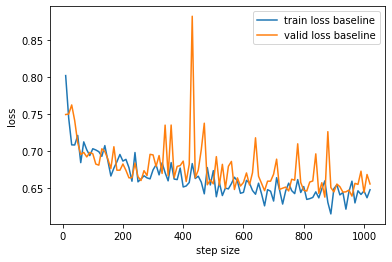

In [ ]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

plt.plot(step_axis_base, train_loss_line_base,label='train loss baseline')
plt.plot(step_axis_base, valid_loss_line_base,label='valid loss baseline')
plt.xlabel('step size')
plt.ylabel('loss')
plt.legend()

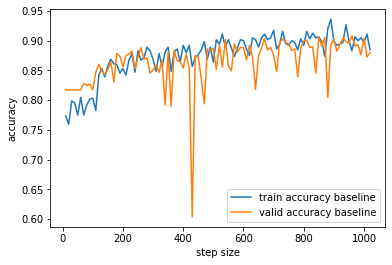

In [ ]:
plt.plot(step_axis_base, train_accu_line_base,label='train accuracy baseline')
plt.plot(step_axis_base, valid_accu_line_base,label='valid accuracy baseline')
plt.xlabel('step size')
plt.ylabel('accuracy')
plt.legend()

In [ ]:
d_list_bs = [train_accu_line_base,valid_accu_line_base,train_loss_line_base,valid_loss_line_base]
df_base = pd.DataFrame.from_records(d_list_bs)
df_base = df_base.T
df_base.columns = ['train_accu_line_base','valid_accu_line_base','train_loss_line_base','valid_loss_line_base']
df_base.to_csv('/content/drive/My Drive/comp4211/proj1/df_base.csv', header=True, index=False)

#Advanced Try

##modified parameter 1
###lr = 0.003

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)


model = Baseline().to(device)
num_epochs = 20
best_val_accu = None
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(),lr = 0.003)
save_path = f'/content/drive/My Drive/comp4211/proj1/base_para1.pt'

step_axis_base1,train_loss_line_base1,valid_loss_line_base1,train_accu_line_base1, valid_accu_line_base1 = TRAIN(model, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_accu, device, save_path)

cuda


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Model saved to /content/drive/My Drive/comp4211/proj1/base_para1.pt
Epoch [1/20], Train Loss: 0.7911, Train Acc: 0.7531, Valid Loss: 0.7337,  Valid Acc: 0.8172



Epoch [1/20], Train Loss: 0.7655, Train Acc: 0.7859, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [1/20], Train Loss: 0.7670, Train Acc: 0.7844, Valid Loss: 0.7344,  Valid Acc: 0.8172



Epoch [1/20], Train Loss: 0.8008, Train Acc: 0.7500, Valid Loss: 0.7317,  Valid Acc: 0.8172



Epoch [1/20], Train Loss: 0.7442, Train Acc: 0.8016, Valid Loss: 0.7266,  Valid Acc: 0.8172




Model saved to /content/drive/My Drive/comp4211/proj1/base_para1.pt
Epoch [2/20], Train Loss: 0.7271, Train Acc: 0.8000, Valid Loss: 0.7142,  Valid Acc: 0.8282



Model saved to /content/drive/My Drive/comp4211/proj1/base_para1.pt
Epoch [2/20], Train Loss: 0.7459, Train Acc: 0.7875, Valid Loss: 0.7154,  Valid Acc: 0.8294



Epoch [2/20], Train Loss: 0.7289, Train Acc: 0.8063, Valid Loss: 0.7296,  Valid Acc: 0.8209



Epoch [2/20], Train Loss: 0.7087, Train Acc: 0.8266, Valid Loss: 0.7497,  Valid Acc: 0.7141



Epoch [2/20], Train Loss: 0.7198, Train Acc: 0.8156, Valid Loss: 0.7218,  Valid Acc: 0.8282




Model saved to /content/drive/My Drive/comp4211/proj1/base_para1.pt
Epoch [3/20], Train Loss: 0.7397, Train Acc: 0.7766, Valid Loss: 0.7112,  Valid Acc: 0.8356



Model saved to /content/drive/My Drive/comp4211/proj1/base_para1.pt
Epoch [3/20], Train Loss: 0.7164, Train Acc: 0.8125, Valid Loss: 0.7073,  Valid Acc: 0.8405



Epoch [3/20], Train Loss: 0.7177, Train Acc: 0.8188, Valid Loss: 0.7021,  Valid Acc: 0.8405



Model saved to /content/drive/My Drive/comp4211/proj1/base_para1.pt
Epoch [3/20], Train Loss: 0.7049, Train Acc: 0.8266, Valid Loss: 0.6969,  Valid Acc: 0.8454



Epoch [3/20], Train Loss: 0.7555, Train Acc: 0.7906, Valid Loss: 0.7043,  Valid Acc: 0.8147




Epoch [4/20], Train Loss: 0.7126, Train Acc: 0.8031, Valid Loss: 0.7169,  Valid Acc: 0.8123



Epoch [4/20], Train Loss: 0.7078, Train Acc: 0.8344, Valid Loss: 0.7007,  Valid Acc: 0.8442



Epoch [4/20], Train Loss: 0.7223, Train Acc: 0.8188, Valid Loss: 0.6974,  Valid Acc: 0.8417



Epoch [4/20], Train Loss: 0.7246, Train Acc: 0.8125, Valid Loss: 0.7504,  Valid Acc: 0.7742



Epoch [4/20], Train Loss: 0.7198, Train Acc: 0.8125, Valid Loss: 0.7061,  Valid Acc: 0.8405




Epoch [5/20], Train Loss: 0.6983, Train Acc: 0.8297, Valid Loss: 0.6976,  Valid Acc: 0.8454



Epoch [5/20], Train Loss: 0.6959, Train Acc: 0.8500, Valid Loss: 0.7199,  Valid Acc: 0.8294



Epoch [5/20], Train Loss: 0.7073, Train Acc: 0.8344, Valid Loss: 0.7054,  Valid Acc: 0.8429



Epoch [5/20], Train Loss: 0.7242, Train Acc: 0.8219, Valid Loss: 0.7076,  Valid Acc: 0.8380



Epoch [5/20], Train Loss: 0.7199, Train Acc: 0.8188, Valid Loss: 0.8135,  Valid Acc: 0.6933




Epoch [6/20], Train Loss: 0.6977, Train Acc: 0.8313, Valid Loss: 0.7121,  Valid Acc: 0.8282



Model saved to /content/drive/My Drive/comp4211/proj1/base_para1.pt
Epoch [6/20], Train Loss: 0.6913, Train Acc: 0.8469, Valid Loss: 0.6893,  Valid Acc: 0.8503



Epoch [6/20], Train Loss: 0.6861, Train Acc: 0.8516, Valid Loss: 0.7016,  Valid Acc: 0.8454



Epoch [6/20], Train Loss: 0.6850, Train Acc: 0.8672, Valid Loss: 0.7103,  Valid Acc: 0.8368



Epoch [6/20], Train Loss: 0.6920, Train Acc: 0.8578, Valid Loss: 0.7109,  Valid Acc: 0.8294




Model saved to /content/drive/My Drive/comp4211/proj1/base_para1.pt
Epoch [7/20], Train Loss: 0.7283, Train Acc: 0.8000, Valid Loss: 0.6805,  Valid Acc: 0.8528



Epoch [7/20], Train Loss: 0.7093, Train Acc: 0.8250, Valid Loss: 0.7348,  Valid Acc: 0.8086



Epoch [7/20], Train Loss: 0.6839, Train Acc: 0.8562, Valid Loss: 0.6984,  Valid Acc: 0.8491



Epoch [7/20], Train Loss: 0.6845, Train Acc: 0.8594, Valid Loss: 0.6882,  Valid Acc: 0.8479



Epoch [7/20], Train Loss: 0.6968, Train Acc: 0.8516, Valid Loss: 0.7304,  Valid Acc: 0.8061




Model saved to /content/drive/My Drive/comp4211/proj1/base_para1.pt
Epoch [8/20], Train Loss: 0.6733, Train Acc: 0.8609, Valid Loss: 0.6808,  Valid Acc: 0.8601



Epoch [8/20], Train Loss: 0.6903, Train Acc: 0.8531, Valid Loss: 0.7156,  Valid Acc: 0.8147



Epoch [8/20], Train Loss: 0.6971, Train Acc: 0.8547, Valid Loss: 0.6965,  Valid Acc: 0.8528



Epoch [8/20], Train Loss: 0.7189, Train Acc: 0.8219, Valid Loss: 0.7576,  Valid Acc: 0.7632



Epoch [8/20], Train Loss: 0.6894, Train Acc: 0.8578, Valid Loss: 0.7617,  Valid Acc: 0.7485




Epoch [9/20], Train Loss: 0.6805, Train Acc: 0.8531, Valid Loss: 0.6900,  Valid Acc: 0.8528



Epoch [9/20], Train Loss: 0.6778, Train Acc: 0.8750, Valid Loss: 0.6836,  Valid Acc: 0.8589



Epoch [9/20], Train Loss: 0.6742, Train Acc: 0.8672, Valid Loss: 0.6875,  Valid Acc: 0.8429



Epoch [9/20], Train Loss: 0.7092, Train Acc: 0.8344, Valid Loss: 0.7078,  Valid Acc: 0.8258



Model saved to /content/drive/My Drive/comp4211/proj1/base_para1.pt
Epoch [9/20], Train Loss: 0.6945, Train Acc: 0.8453, Valid Loss: 0.6760,  Valid Acc: 0.8724




Epoch [10/20], Train Loss: 0.6818, Train Acc: 0.8531, Valid Loss: 0.6873,  Valid Acc: 0.8540



Epoch [10/20], Train Loss: 0.6887, Train Acc: 0.8594, Valid Loss: 0.6798,  Valid Acc: 0.8601



Epoch [10/20], Train Loss: 0.6793, Train Acc: 0.8641, Valid Loss: 0.7199,  Valid Acc: 0.8110



Epoch [10/20], Train Loss: 0.6815, Train Acc: 0.8562, Valid Loss: 0.6792,  Valid Acc: 0.8675



Epoch [10/20], Train Loss: 0.6946, Train Acc: 0.8469, Valid Loss: 0.6827,  Valid Acc: 0.8577



Epoch [10/20], Train Loss: 0.6741, Train Acc: 0.8500, Valid Loss: 0.6726,  Valid Acc: 0.8663




Epoch [11/20], Train Loss: 0.6849, Train Acc: 0.8609, Valid Loss: 0.7566,  Valid Acc: 0.7779



Epoch [11/20], Train Loss: 0.7200, Train Acc: 0.8172, Valid Loss: 0.7219,  Valid Acc: 0.8221



Epoch [11/20], Train Loss: 0.6938, Train Acc: 0.8484, Valid Loss: 0.7124,  Valid Acc: 0.8368



Epoch [11/20], Train Loss: 0.6983, Train Acc: 0.8391, Valid Loss: 0.6859,  Valid Acc: 0.8613



Epoch [11/20], Train Loss: 0.6984, Train Acc: 0.8359, Valid Loss: 0.7796,  Valid Acc: 0.7350




Epoch [12/20], Train Loss: 0.6914, Train Acc: 0.8438, Valid Loss: 0.7967,  Valid Acc: 0.6871



Epoch [12/20], Train Loss: 0.6893, Train Acc: 0.8547, Valid Loss: 0.6721,  Valid Acc: 0.8675



Epoch [12/20], Train Loss: 0.7045, Train Acc: 0.8344, Valid Loss: 0.8293,  Valid Acc: 0.6896



Epoch [12/20], Train Loss: 0.6857, Train Acc: 0.8516, Valid Loss: 0.6887,  Valid Acc: 0.8540



Epoch [12/20], Train Loss: 0.6689, Train Acc: 0.8766, Valid Loss: 0.8572,  Valid Acc: 0.6393




Epoch [13/20], Train Loss: 0.6862, Train Acc: 0.8531, Valid Loss: 0.6756,  Valid Acc: 0.8601



Epoch [13/20], Train Loss: 0.6983, Train Acc: 0.8516, Valid Loss: 0.6728,  Valid Acc: 0.8663



Epoch [13/20], Train Loss: 0.6721, Train Acc: 0.8703, Valid Loss: 0.6834,  Valid Acc: 0.8589



Epoch [13/20], Train Loss: 0.6665, Train Acc: 0.8766, Valid Loss: 0.6831,  Valid Acc: 0.8601



Epoch [13/20], Train Loss: 0.6701, Train Acc: 0.8734, Valid Loss: 0.6696,  Valid Acc: 0.8687




Epoch [14/20], Train Loss: 0.7226, Train Acc: 0.8172, Valid Loss: 0.6939,  Valid Acc: 0.8577



Epoch [14/20], Train Loss: 0.6774, Train Acc: 0.8703, Valid Loss: 0.6821,  Valid Acc: 0.8552



Epoch [14/20], Train Loss: 0.6848, Train Acc: 0.8547, Valid Loss: 0.7728,  Valid Acc: 0.7411



Epoch [14/20], Train Loss: 0.6812, Train Acc: 0.8562, Valid Loss: 0.6918,  Valid Acc: 0.8405



Epoch [14/20], Train Loss: 0.6691, Train Acc: 0.8688, Valid Loss: 0.7313,  Valid Acc: 0.7963




Epoch [15/20], Train Loss: 0.6794, Train Acc: 0.8469, Valid Loss: 0.6946,  Valid Acc: 0.8442



Epoch [15/20], Train Loss: 0.6555, Train Acc: 0.8797, Valid Loss: 0.6671,  Valid Acc: 0.8650



Epoch [15/20], Train Loss: 0.6753, Train Acc: 0.8688, Valid Loss: 0.6976,  Valid Acc: 0.8479



Epoch [15/20], Train Loss: 0.6796, Train Acc: 0.8562, Valid Loss: 0.6675,  Valid Acc: 0.8675



Epoch [15/20], Train Loss: 0.6812, Train Acc: 0.8562, Valid Loss: 0.7764,  Valid Acc: 0.7521




Epoch [16/20], Train Loss: 0.6686, Train Acc: 0.8703, Valid Loss: 0.7199,  Valid Acc: 0.8123



Model saved to /content/drive/My Drive/comp4211/proj1/base_para1.pt
Epoch [16/20], Train Loss: 0.6622, Train Acc: 0.8844, Valid Loss: 0.6737,  Valid Acc: 0.8736



Epoch [16/20], Train Loss: 0.6647, Train Acc: 0.8781, Valid Loss: 0.6714,  Valid Acc: 0.8724



Epoch [16/20], Train Loss: 0.6678, Train Acc: 0.8766, Valid Loss: 0.6964,  Valid Acc: 0.8503



Epoch [16/20], Train Loss: 0.7058, Train Acc: 0.8281, Valid Loss: 0.9422,  Valid Acc: 0.5656




Epoch [17/20], Train Loss: 0.7114, Train Acc: 0.8188, Valid Loss: 0.6794,  Valid Acc: 0.8663



Epoch [17/20], Train Loss: 0.6690, Train Acc: 0.8797, Valid Loss: 0.6848,  Valid Acc: 0.8552



Epoch [17/20], Train Loss: 0.6511, Train Acc: 0.8891, Valid Loss: 0.6786,  Valid Acc: 0.8613



Model saved to /content/drive/My Drive/comp4211/proj1/base_para1.pt
Epoch [17/20], Train Loss: 0.6839, Train Acc: 0.8531, Valid Loss: 0.6642,  Valid Acc: 0.8761



Epoch [17/20], Train Loss: 0.6894, Train Acc: 0.8484, Valid Loss: 0.6653,  Valid Acc: 0.8736




Epoch [18/20], Train Loss: 0.6645, Train Acc: 0.8750, Valid Loss: 0.6802,  Valid Acc: 0.8528



Epoch [18/20], Train Loss: 0.6598, Train Acc: 0.8938, Valid Loss: 0.7273,  Valid Acc: 0.8074



Epoch [18/20], Train Loss: 0.6772, Train Acc: 0.8719, Valid Loss: 0.8947,  Valid Acc: 0.6393



Epoch [18/20], Train Loss: 0.6690, Train Acc: 0.8766, Valid Loss: 0.7204,  Valid Acc: 0.8245



Epoch [18/20], Train Loss: 0.6813, Train Acc: 0.8609, Valid Loss: 0.6693,  Valid Acc: 0.8748




Epoch [19/20], Train Loss: 0.6693, Train Acc: 0.8625, Valid Loss: 0.6960,  Valid Acc: 0.8356



Epoch [19/20], Train Loss: 0.6808, Train Acc: 0.8672, Valid Loss: 0.6850,  Valid Acc: 0.8564



Epoch [19/20], Train Loss: 0.6982, Train Acc: 0.8438, Valid Loss: 0.7063,  Valid Acc: 0.8380



Epoch [19/20], Train Loss: 0.6805, Train Acc: 0.8609, Valid Loss: 0.6938,  Valid Acc: 0.8393



Epoch [19/20], Train Loss: 0.6736, Train Acc: 0.8703, Valid Loss: 0.6702,  Valid Acc: 0.8650




Epoch [20/20], Train Loss: 0.6847, Train Acc: 0.8547, Valid Loss: 0.7301,  Valid Acc: 0.8074



Epoch [20/20], Train Loss: 0.6790, Train Acc: 0.8547, Valid Loss: 0.6895,  Valid Acc: 0.8528



Epoch [20/20], Train Loss: 0.6749, Train Acc: 0.8734, Valid Loss: 0.6993,  Valid Acc: 0.8393



Epoch [20/20], Train Loss: 0.7109, Train Acc: 0.8266, Valid Loss: 0.6923,  Valid Acc: 0.8515



Epoch [20/20], Train Loss: 0.6791, Train Acc: 0.8641, Valid Loss: 0.6728,  Valid Acc: 0.8650



Epoch [20/20], Train Loss: 0.6888, Train Acc: 0.8547, Valid Loss: 0.9363,  Valid Acc: 0.5301

Finished Training


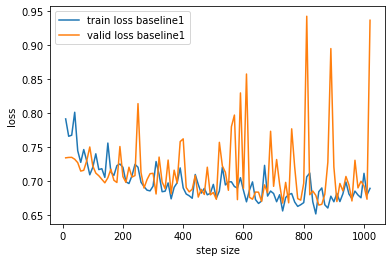

In [ ]:
plt.plot(step_axis_base1, train_loss_line_base1,label='train loss baseline1')
plt.plot(step_axis_base1, valid_loss_line_base1,label='valid loss baseline1')
plt.xlabel('step size')
plt.ylabel('loss')
plt.legend()

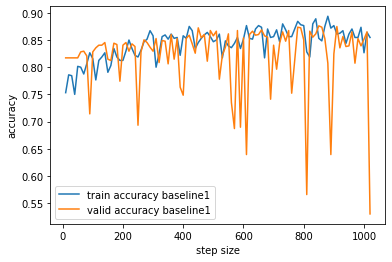

In [ ]:
plt.plot(step_axis_base1, train_accu_line_base1,label='train accuracy baseline1')
plt.plot(step_axis_base1, valid_accu_line_base1,label='valid accuracy baseline1')
plt.xlabel('step size')
plt.ylabel('accuracy')
plt.legend()

##modified parameter 2
###change optimizer to optim.RMSprop

In [ ]:
model = Baseline().to(device)
num_epochs = 20
best_val_accu = None
criterion = nn.CrossEntropyLoss()
optimizer = optim.RMSprop(model.parameters(),lr = 0.009)
save_path = f'/content/drive/My Drive/comp4211/proj1/base_para2.pt'

step_axis_base2,train_loss_line_base2,valid_loss_line_base2,train_accu_line_base2, valid_accu_line_base2 = TRAIN(model, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_accu, device, save_path)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Model saved to /content/drive/My Drive/comp4211/proj1/base_para2.pt
Epoch [1/20], Train Loss: 0.7836, Train Acc: 0.7531, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [1/20], Train Loss: 0.7608, Train Acc: 0.7906, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [1/20], Train Loss: 0.7546, Train Acc: 0.7969, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [1/20], Train Loss: 0.7577, Train Acc: 0.7937, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [1/20], Train Loss: 0.7952, Train Acc: 0.7563, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [2/20], Train Loss: 0.7787, Train Acc: 0.7641, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [2/20], Train Loss: 0.7686, Train Acc: 0.7828, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [2/20], Train Loss: 0.7796, Train Acc: 0.7719, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [2/20], Train Loss: 0.7702, Train Acc: 0.7812, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [2/20], Train Loss: 0.7327, Train Acc: 0.8188, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [3/20], Train Loss: 0.7465, Train Acc: 0.7953, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [3/20], Train Loss: 0.7764, Train Acc: 0.7750, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [3/20], Train Loss: 0.7452, Train Acc: 0.8063, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [3/20], Train Loss: 0.7686, Train Acc: 0.7828, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [3/20], Train Loss: 0.7655, Train Acc: 0.7859, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [4/20], Train Loss: 0.7682, Train Acc: 0.7750, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [4/20], Train Loss: 0.7561, Train Acc: 0.7953, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [4/20], Train Loss: 0.7733, Train Acc: 0.7781, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [4/20], Train Loss: 0.7655, Train Acc: 0.7859, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [4/20], Train Loss: 0.7436, Train Acc: 0.8078, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [5/20], Train Loss: 0.7768, Train Acc: 0.7656, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [5/20], Train Loss: 0.7639, Train Acc: 0.7875, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [5/20], Train Loss: 0.7655, Train Acc: 0.7859, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [5/20], Train Loss: 0.7655, Train Acc: 0.7859, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [5/20], Train Loss: 0.7608, Train Acc: 0.7906, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [6/20], Train Loss: 0.7653, Train Acc: 0.7766, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [6/20], Train Loss: 0.7858, Train Acc: 0.7656, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [6/20], Train Loss: 0.7452, Train Acc: 0.8063, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [6/20], Train Loss: 0.7608, Train Acc: 0.7906, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [6/20], Train Loss: 0.7702, Train Acc: 0.7812, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [7/20], Train Loss: 0.7459, Train Acc: 0.7969, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [7/20], Train Loss: 0.7733, Train Acc: 0.7781, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [7/20], Train Loss: 0.7764, Train Acc: 0.7750, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [7/20], Train Loss: 0.7764, Train Acc: 0.7750, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [7/20], Train Loss: 0.7546, Train Acc: 0.7969, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [8/20], Train Loss: 0.7454, Train Acc: 0.7969, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [8/20], Train Loss: 0.7702, Train Acc: 0.7812, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [8/20], Train Loss: 0.7624, Train Acc: 0.7891, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [8/20], Train Loss: 0.7733, Train Acc: 0.7781, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [8/20], Train Loss: 0.7749, Train Acc: 0.7766, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [9/20], Train Loss: 0.7457, Train Acc: 0.7969, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [9/20], Train Loss: 0.7421, Train Acc: 0.8094, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [9/20], Train Loss: 0.7764, Train Acc: 0.7750, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [9/20], Train Loss: 0.7733, Train Acc: 0.7781, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [9/20], Train Loss: 0.7608, Train Acc: 0.7906, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [10/20], Train Loss: 0.7555, Train Acc: 0.7875, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [10/20], Train Loss: 0.7561, Train Acc: 0.7953, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [10/20], Train Loss: 0.7608, Train Acc: 0.7906, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [10/20], Train Loss: 0.7514, Train Acc: 0.8000, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [10/20], Train Loss: 0.7546, Train Acc: 0.7969, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [10/20], Train Loss: 0.7948, Train Acc: 0.7484, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [11/20], Train Loss: 0.7702, Train Acc: 0.7812, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [11/20], Train Loss: 0.7718, Train Acc: 0.7797, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [11/20], Train Loss: 0.7468, Train Acc: 0.8047, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [11/20], Train Loss: 0.7561, Train Acc: 0.7953, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [11/20], Train Loss: 0.7827, Train Acc: 0.7688, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [12/20], Train Loss: 0.7557, Train Acc: 0.7859, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [12/20], Train Loss: 0.7796, Train Acc: 0.7719, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [12/20], Train Loss: 0.7421, Train Acc: 0.8094, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [12/20], Train Loss: 0.7858, Train Acc: 0.7656, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [12/20], Train Loss: 0.7468, Train Acc: 0.8047, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [13/20], Train Loss: 0.7696, Train Acc: 0.7734, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [13/20], Train Loss: 0.7452, Train Acc: 0.8063, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [13/20], Train Loss: 0.7827, Train Acc: 0.7688, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [13/20], Train Loss: 0.7639, Train Acc: 0.7875, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [13/20], Train Loss: 0.7546, Train Acc: 0.7969, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [14/20], Train Loss: 0.7629, Train Acc: 0.7797, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [14/20], Train Loss: 0.7483, Train Acc: 0.8031, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [14/20], Train Loss: 0.7843, Train Acc: 0.7672, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [14/20], Train Loss: 0.7593, Train Acc: 0.7922, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [14/20], Train Loss: 0.7561, Train Acc: 0.7953, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [15/20], Train Loss: 0.7719, Train Acc: 0.7719, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [15/20], Train Loss: 0.7639, Train Acc: 0.7875, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [15/20], Train Loss: 0.7655, Train Acc: 0.7859, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [15/20], Train Loss: 0.7843, Train Acc: 0.7672, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [15/20], Train Loss: 0.7436, Train Acc: 0.8078, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [16/20], Train Loss: 0.7471, Train Acc: 0.7953, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [16/20], Train Loss: 0.7624, Train Acc: 0.7891, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [16/20], Train Loss: 0.7796, Train Acc: 0.7719, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [16/20], Train Loss: 0.7421, Train Acc: 0.8094, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [16/20], Train Loss: 0.7780, Train Acc: 0.7734, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [17/20], Train Loss: 0.7651, Train Acc: 0.7781, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [17/20], Train Loss: 0.7702, Train Acc: 0.7812, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [17/20], Train Loss: 0.7546, Train Acc: 0.7969, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [17/20], Train Loss: 0.7530, Train Acc: 0.7984, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [17/20], Train Loss: 0.7749, Train Acc: 0.7766, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [18/20], Train Loss: 0.7770, Train Acc: 0.7672, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [18/20], Train Loss: 0.7624, Train Acc: 0.7891, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [18/20], Train Loss: 0.7546, Train Acc: 0.7969, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [18/20], Train Loss: 0.7671, Train Acc: 0.7844, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [18/20], Train Loss: 0.7561, Train Acc: 0.7953, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [19/20], Train Loss: 0.7692, Train Acc: 0.7734, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [19/20], Train Loss: 0.7343, Train Acc: 0.8172, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [19/20], Train Loss: 0.7733, Train Acc: 0.7781, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [19/20], Train Loss: 0.7889, Train Acc: 0.7625, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [19/20], Train Loss: 0.7639, Train Acc: 0.7875, Valid Loss: 0.7343,  Valid Acc: 0.8172




Epoch [20/20], Train Loss: 0.7619, Train Acc: 0.7812, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [20/20], Train Loss: 0.7608, Train Acc: 0.7906, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [20/20], Train Loss: 0.7530, Train Acc: 0.7984, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [20/20], Train Loss: 0.7733, Train Acc: 0.7781, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [20/20], Train Loss: 0.7702, Train Acc: 0.7812, Valid Loss: 0.7343,  Valid Acc: 0.8172



Epoch [20/20], Train Loss: 0.7581, Train Acc: 0.7844, Valid Loss: 0.7343,  Valid Acc: 0.8172

Finished Training


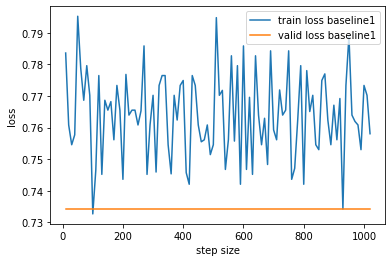

In [ ]:
plt.plot(step_axis_base2, train_loss_line_base2,label='train loss baseline1')
plt.plot(step_axis_base2, valid_loss_line_base2,label='valid loss baseline1')
plt.xlabel('step size')
plt.ylabel('loss')
plt.legend()

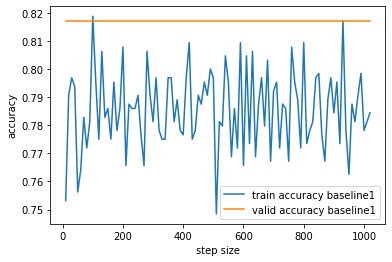

In [ ]:
plt.plot(step_axis_base2, train_accu_line_base2,label='train accuracy baseline1')
plt.plot(step_axis_base2, valid_accu_line_base2,label='valid accuracy baseline1')
plt.xlabel('step size')
plt.ylabel('accuracy')
plt.legend()

##pretrained model vgg16

In [ ]:
transf_vgg = transforms.Compose(
    [transforms.Resize((32,32)), transforms.ToTensor()])

train_dataest_vgg = MaskDataset_clip(data_train_path, transforms=transf_vgg)
valid_dataest_vgg = MaskDataset_clip(data_valid_path, transforms=transf_vgg)

bs = 64

train_loader_vgg = DataLoader(train_dataest_vgg, batch_size=bs, shuffle=True, num_workers=4, pin_memory=True)
valid_loader_vgg = DataLoader(valid_dataest_vgg, batch_size=1, shuffle=False, num_workers=4, pin_memory=True)


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
vgg16 = torchvision.models.vgg16(pretrained=True).cuda()
summary(vgg16, torch.zeros((64, 3, 32, 32)).cuda())

                              Kernel Shape       Output Shape       Params  \
Layer                                                                        
0_features.Conv2d_0          [3, 64, 3, 3]   [64, 64, 32, 32]       1.792k   
1_features.ReLU_1                        -   [64, 64, 32, 32]            -   
2_features.Conv2d_2         [64, 64, 3, 3]   [64, 64, 32, 32]      36.928k   
3_features.ReLU_3                        -   [64, 64, 32, 32]            -   
4_features.MaxPool2d_4                   -   [64, 64, 16, 16]            -   
5_features.Conv2d_5        [64, 128, 3, 3]  [64, 128, 16, 16]      73.856k   
6_features.ReLU_6                        -  [64, 128, 16, 16]            -   
7_features.Conv2d_7       [128, 128, 3, 3]  [64, 128, 16, 16]     147.584k   
8_features.ReLU_8                        -  [64, 128, 16, 16]            -   
9_features.MaxPool2d_9                   -    [64, 128, 8, 8]            -   
10_features.Conv2d_10     [128, 256, 3, 3]    [64, 256, 8, 8]   

,Kernel Shape,Output Shape,Params,Mult-Adds
Layer,,,,
0_features.Conv2d_0,"[3, 64, 3, 3]","[64, 64, 32, 32]",1792.0,1769472.0
1_features.ReLU_1,-,"[64, 64, 32, 32]",NaN,NaN
2_features.Conv2d_2,"[64, 64, 3, 3]","[64, 64, 32, 32]",36928.0,37748736.0
3_features.ReLU_3,-,"[64, 64, 32, 32]",NaN,NaN
4_features.MaxPool2d_4,-,"[64, 64, 16, 16]",NaN,NaN
5_features.Conv2d_5,"[64, 128, 3, 3]","[64, 128, 16, 16]",73856.0,18874368.0
6_features.ReLU_6,-,"[64, 128, 16, 16]",NaN,NaN
7_features.Conv2d_7,"[128, 128, 3, 3]","[64, 128, 16, 16]",147584.0,37748736.0
8_features.ReLU_8,-,"[64, 128, 16, 16]",NaN,NaN


In [ ]:
# replace the entire classifier block by encapsulating VGG in a new model

class Modified_VGG(nn.Module):

    def __init__(self):
        super(Modified_VGG, self).__init__()
        self.vgg = torchvision.models.vgg16(pretrained=True)

        for param in self.vgg.parameters():
            param.requires_grad = False

        self.vgg.classifier = nn.Linear(512*7*7, 3)

    def forward(self, images):
        return self.vgg(images)

modified_vgg = Modified_VGG().cuda()
summary(modified_vgg, torch.zeros((64, 3, 32, 32)).cuda())

                                      Kernel Shape       Output Shape  \
Layer                                                                   
0_vgg.features.Conv2d_0              [3, 64, 3, 3]   [64, 64, 32, 32]   
1_vgg.features.ReLU_1                            -   [64, 64, 32, 32]   
2_vgg.features.Conv2d_2             [64, 64, 3, 3]   [64, 64, 32, 32]   
3_vgg.features.ReLU_3                            -   [64, 64, 32, 32]   
4_vgg.features.MaxPool2d_4                       -   [64, 64, 16, 16]   
5_vgg.features.Conv2d_5            [64, 128, 3, 3]  [64, 128, 16, 16]   
6_vgg.features.ReLU_6                            -  [64, 128, 16, 16]   
7_vgg.features.Conv2d_7           [128, 128, 3, 3]  [64, 128, 16, 16]   
8_vgg.features.ReLU_8                            -  [64, 128, 16, 16]   
9_vgg.features.MaxPool2d_9                       -    [64, 128, 8, 8]   
10_vgg.features.Conv2d_10         [128, 256, 3, 3]    [64, 256, 8, 8]   
11_vgg.features.ReLU_11                          - 

,Kernel Shape,Output Shape,Params,Mult-Adds
Layer,,,,
0_vgg.features.Conv2d_0,"[3, 64, 3, 3]","[64, 64, 32, 32]",NaN,NaN
1_vgg.features.ReLU_1,-,"[64, 64, 32, 32]",NaN,NaN
2_vgg.features.Conv2d_2,"[64, 64, 3, 3]","[64, 64, 32, 32]",NaN,NaN
3_vgg.features.ReLU_3,-,"[64, 64, 32, 32]",NaN,NaN
4_vgg.features.MaxPool2d_4,-,"[64, 64, 16, 16]",NaN,NaN
5_vgg.features.Conv2d_5,"[64, 128, 3, 3]","[64, 128, 16, 16]",NaN,NaN
6_vgg.features.ReLU_6,-,"[64, 128, 16, 16]",NaN,NaN
7_vgg.features.Conv2d_7,"[128, 128, 3, 3]","[64, 128, 16, 16]",NaN,NaN
8_vgg.features.ReLU_8,-,"[64, 128, 16, 16]",NaN,NaN


In [ ]:
num_epochs = 20
vgg16_optimizer = optim.Adam(modified_vgg.parameters())
best_accu = None
criterion = nn.CrossEntropyLoss()
save_path = f'/content/drive/My Drive/comp4211/proj1/modified_vgg.pt'

step_axis_vgg,train_loss_line_vgg,valid_loss_line_vgg,train_accu_line_vgg, valid_accu_line_vgg = TRAIN(modified_vgg, train_loader_vgg, valid_loader_vgg, num_epochs, criterion, vgg16_optimizer, best_accu, device, save_path)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg.pt
Epoch [1/20], Train Loss: 1.5703, Train Acc: 0.7000, Valid Loss: 0.8937,  Valid Acc: 0.8258



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg.pt
Epoch [1/20], Train Loss: 0.9533, Train Acc: 0.8562, Valid Loss: 0.6808,  Valid Acc: 0.8515



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg.pt
Epoch [1/20], Train Loss: 0.7543, Train Acc: 0.8219, Valid Loss: 0.7082,  Valid Acc: 0.8564



Epoch [1/20], Train Loss: 0.7410, Train Acc: 0.8578, Valid Loss: 0.4924,  Valid Acc: 0.8515



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg.pt
Epoch [1/20], Train Loss: 0.6782, Train Acc: 0.8406, Valid Loss: 0.4181,  Valid Acc: 0.8724




Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg.pt
Epoch [2/20], Train Loss: 0.3664, Train Acc: 0.8797, Valid Loss: 0.4052,  Valid Acc: 0.8798



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg.pt
Epoch [2/20], Train Loss: 0.4149, Train Acc: 0.8625, Valid Loss: 0.4664,  Valid Acc: 0.8883



Epoch [2/20], Train Loss: 0.3861, Train Acc: 0.8844, Valid Loss: 0.4736,  Valid Acc: 0.8687



Epoch [2/20], Train Loss: 0.4436, Train Acc: 0.8703, Valid Loss: 0.4401,  Valid Acc: 0.8454



Epoch [2/20], Train Loss: 0.3573, Train Acc: 0.8859, Valid Loss: 0.4137,  Valid Acc: 0.8748




Epoch [3/20], Train Loss: 0.3154, Train Acc: 0.8969, Valid Loss: 0.3774,  Valid Acc: 0.8822



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg.pt
Epoch [3/20], Train Loss: 0.2342, Train Acc: 0.9187, Valid Loss: 0.4045,  Valid Acc: 0.8908



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg.pt
Epoch [3/20], Train Loss: 0.3341, Train Acc: 0.8938, Valid Loss: 0.3603,  Valid Acc: 0.9006



Epoch [3/20], Train Loss: 0.4010, Train Acc: 0.8953, Valid Loss: 0.4166,  Valid Acc: 0.8810



Epoch [3/20], Train Loss: 0.3380, Train Acc: 0.8859, Valid Loss: 0.5355,  Valid Acc: 0.8945




Epoch [4/20], Train Loss: 0.4617, Train Acc: 0.8625, Valid Loss: 0.4782,  Valid Acc: 0.8405



Epoch [4/20], Train Loss: 0.3158, Train Acc: 0.8859, Valid Loss: 0.4647,  Valid Acc: 0.8724



Epoch [4/20], Train Loss: 0.3849, Train Acc: 0.8828, Valid Loss: 0.4011,  Valid Acc: 0.8847



Epoch [4/20], Train Loss: 0.3026, Train Acc: 0.8969, Valid Loss: 0.3966,  Valid Acc: 0.8908



Epoch [4/20], Train Loss: 0.2601, Train Acc: 0.8984, Valid Loss: 0.4375,  Valid Acc: 0.8994




Epoch [5/20], Train Loss: 0.2932, Train Acc: 0.8953, Valid Loss: 0.4110,  Valid Acc: 0.8822



Epoch [5/20], Train Loss: 0.3098, Train Acc: 0.9078, Valid Loss: 0.5505,  Valid Acc: 0.8245



Epoch [5/20], Train Loss: 0.3153, Train Acc: 0.8891, Valid Loss: 0.4771,  Valid Acc: 0.8712



Epoch [5/20], Train Loss: 0.4313, Train Acc: 0.8781, Valid Loss: 0.4315,  Valid Acc: 0.8994



Epoch [5/20], Train Loss: 0.2633, Train Acc: 0.9187, Valid Loss: 0.4902,  Valid Acc: 0.8773




Epoch [6/20], Train Loss: 0.2991, Train Acc: 0.8938, Valid Loss: 0.4932,  Valid Acc: 0.8982



Epoch [6/20], Train Loss: 0.2898, Train Acc: 0.9047, Valid Loss: 0.5466,  Valid Acc: 0.8515



Epoch [6/20], Train Loss: 0.3196, Train Acc: 0.9047, Valid Loss: 0.4240,  Valid Acc: 0.8982



Epoch [6/20], Train Loss: 0.3798, Train Acc: 0.8984, Valid Loss: 0.4990,  Valid Acc: 0.8822



Epoch [6/20], Train Loss: 0.3116, Train Acc: 0.9000, Valid Loss: 0.4393,  Valid Acc: 0.8798




Epoch [7/20], Train Loss: 0.3048, Train Acc: 0.8984, Valid Loss: 0.4583,  Valid Acc: 0.8969



Epoch [7/20], Train Loss: 0.2993, Train Acc: 0.9016, Valid Loss: 0.4700,  Valid Acc: 0.8883



Epoch [7/20], Train Loss: 0.3130, Train Acc: 0.9125, Valid Loss: 0.5000,  Valid Acc: 0.8945



Epoch [7/20], Train Loss: 0.3605, Train Acc: 0.8891, Valid Loss: 0.4975,  Valid Acc: 0.8871



Epoch [7/20], Train Loss: 0.4023, Train Acc: 0.8953, Valid Loss: 0.5514,  Valid Acc: 0.8356




Epoch [8/20], Train Loss: 0.3743, Train Acc: 0.8828, Valid Loss: 0.4790,  Valid Acc: 0.8945



Epoch [8/20], Train Loss: 0.2623, Train Acc: 0.9062, Valid Loss: 0.5300,  Valid Acc: 0.8798



Epoch [8/20], Train Loss: 0.3102, Train Acc: 0.8984, Valid Loss: 0.5328,  Valid Acc: 0.8773



Epoch [8/20], Train Loss: 0.3287, Train Acc: 0.8922, Valid Loss: 0.4717,  Valid Acc: 0.8687



Epoch [8/20], Train Loss: 0.2373, Train Acc: 0.9250, Valid Loss: 0.4680,  Valid Acc: 0.8957




Epoch [9/20], Train Loss: 0.3624, Train Acc: 0.8828, Valid Loss: 0.5255,  Valid Acc: 0.8577



Epoch [9/20], Train Loss: 0.2180, Train Acc: 0.9281, Valid Loss: 0.4840,  Valid Acc: 0.8675



Epoch [9/20], Train Loss: 0.3202, Train Acc: 0.8859, Valid Loss: 0.4926,  Valid Acc: 0.8810



Epoch [9/20], Train Loss: 0.2341, Train Acc: 0.9172, Valid Loss: 0.5022,  Valid Acc: 0.8798



Epoch [9/20], Train Loss: 0.2832, Train Acc: 0.9016, Valid Loss: 0.4717,  Valid Acc: 0.8847




Epoch [10/20], Train Loss: 0.2531, Train Acc: 0.8984, Valid Loss: 0.5098,  Valid Acc: 0.8933



Epoch [10/20], Train Loss: 0.2281, Train Acc: 0.9109, Valid Loss: 0.4881,  Valid Acc: 0.8908



Epoch [10/20], Train Loss: 0.2409, Train Acc: 0.9141, Valid Loss: 0.4895,  Valid Acc: 0.8896



Epoch [10/20], Train Loss: 0.2889, Train Acc: 0.9062, Valid Loss: 0.4885,  Valid Acc: 0.8957



Epoch [10/20], Train Loss: 0.2531, Train Acc: 0.9203, Valid Loss: 0.4932,  Valid Acc: 0.8859



Epoch [10/20], Train Loss: 0.2686, Train Acc: 0.8969, Valid Loss: 0.5902,  Valid Acc: 0.8859




Epoch [11/20], Train Loss: 0.2280, Train Acc: 0.9172, Valid Loss: 0.5424,  Valid Acc: 0.8589



Epoch [11/20], Train Loss: 0.2653, Train Acc: 0.9109, Valid Loss: 0.5746,  Valid Acc: 0.8957



Epoch [11/20], Train Loss: 0.3014, Train Acc: 0.8922, Valid Loss: 0.5311,  Valid Acc: 0.8871



Epoch [11/20], Train Loss: 0.2644, Train Acc: 0.9125, Valid Loss: 0.5250,  Valid Acc: 0.8859



Epoch [11/20], Train Loss: 0.3426, Train Acc: 0.8938, Valid Loss: 0.5462,  Valid Acc: 0.8810




Epoch [12/20], Train Loss: 0.1937, Train Acc: 0.9281, Valid Loss: 0.5317,  Valid Acc: 0.8822



Epoch [12/20], Train Loss: 0.2332, Train Acc: 0.9141, Valid Loss: 0.5799,  Valid Acc: 0.8773



Epoch [12/20], Train Loss: 0.2845, Train Acc: 0.9047, Valid Loss: 0.5274,  Valid Acc: 0.8994



Epoch [12/20], Train Loss: 0.2729, Train Acc: 0.9156, Valid Loss: 0.5503,  Valid Acc: 0.8933



Epoch [12/20], Train Loss: 0.3026, Train Acc: 0.9016, Valid Loss: 0.5672,  Valid Acc: 0.8896




Epoch [13/20], Train Loss: 0.3146, Train Acc: 0.9000, Valid Loss: 0.5862,  Valid Acc: 0.8810



Epoch [13/20], Train Loss: 0.2828, Train Acc: 0.9094, Valid Loss: 0.5124,  Valid Acc: 0.8969



Epoch [13/20], Train Loss: 0.2704, Train Acc: 0.9109, Valid Loss: 0.5190,  Valid Acc: 0.8834



Epoch [13/20], Train Loss: 0.2573, Train Acc: 0.9219, Valid Loss: 0.5989,  Valid Acc: 0.8834



Epoch [13/20], Train Loss: 0.2895, Train Acc: 0.9078, Valid Loss: 0.5881,  Valid Acc: 0.8773




Epoch [14/20], Train Loss: 0.2590, Train Acc: 0.9031, Valid Loss: 0.6391,  Valid Acc: 0.8601



Epoch [14/20], Train Loss: 0.2055, Train Acc: 0.9266, Valid Loss: 0.5794,  Valid Acc: 0.8933



Epoch [14/20], Train Loss: 0.2732, Train Acc: 0.9203, Valid Loss: 0.5714,  Valid Acc: 0.8920



Epoch [14/20], Train Loss: 0.1679, Train Acc: 0.9359, Valid Loss: 0.5683,  Valid Acc: 0.8847



Epoch [14/20], Train Loss: 0.2131, Train Acc: 0.9094, Valid Loss: 0.5652,  Valid Acc: 0.8736




Epoch [15/20], Train Loss: 0.2892, Train Acc: 0.9109, Valid Loss: 0.6109,  Valid Acc: 0.8712



Epoch [15/20], Train Loss: 0.1882, Train Acc: 0.9266, Valid Loss: 0.6062,  Valid Acc: 0.8798



Epoch [15/20], Train Loss: 0.2515, Train Acc: 0.9187, Valid Loss: 0.5831,  Valid Acc: 0.8810



Epoch [15/20], Train Loss: 0.2253, Train Acc: 0.9125, Valid Loss: 0.6091,  Valid Acc: 0.8969



Epoch [15/20], Train Loss: 0.3200, Train Acc: 0.8875, Valid Loss: 0.5559,  Valid Acc: 0.8920




Epoch [16/20], Train Loss: 0.2491, Train Acc: 0.9156, Valid Loss: 0.5715,  Valid Acc: 0.8834



Epoch [16/20], Train Loss: 0.2637, Train Acc: 0.9266, Valid Loss: 0.6458,  Valid Acc: 0.8626



Epoch [16/20], Train Loss: 0.3177, Train Acc: 0.9187, Valid Loss: 0.6368,  Valid Acc: 0.8761



Epoch [16/20], Train Loss: 0.2848, Train Acc: 0.9219, Valid Loss: 0.6013,  Valid Acc: 0.8761



Epoch [16/20], Train Loss: 0.2697, Train Acc: 0.9266, Valid Loss: 0.6127,  Valid Acc: 0.8663




Epoch [17/20], Train Loss: 0.2369, Train Acc: 0.9031, Valid Loss: 0.6076,  Valid Acc: 0.8834



Epoch [17/20], Train Loss: 0.2133, Train Acc: 0.9328, Valid Loss: 0.6232,  Valid Acc: 0.8785



Epoch [17/20], Train Loss: 0.2141, Train Acc: 0.9297, Valid Loss: 0.6219,  Valid Acc: 0.8761



Epoch [17/20], Train Loss: 0.2168, Train Acc: 0.9250, Valid Loss: 0.6616,  Valid Acc: 0.8515



Epoch [17/20], Train Loss: 0.2498, Train Acc: 0.9187, Valid Loss: 0.5867,  Valid Acc: 0.8908




Epoch [18/20], Train Loss: 0.2814, Train Acc: 0.9047, Valid Loss: 0.5353,  Valid Acc: 0.8908



Epoch [18/20], Train Loss: 0.2580, Train Acc: 0.9203, Valid Loss: 0.6187,  Valid Acc: 0.8908



Epoch [18/20], Train Loss: 0.2968, Train Acc: 0.9234, Valid Loss: 0.5922,  Valid Acc: 0.8785



Epoch [18/20], Train Loss: 0.2806, Train Acc: 0.8984, Valid Loss: 0.6458,  Valid Acc: 0.8736



Epoch [18/20], Train Loss: 0.3001, Train Acc: 0.9219, Valid Loss: 0.7433,  Valid Acc: 0.8429




Epoch [19/20], Train Loss: 0.2574, Train Acc: 0.9016, Valid Loss: 0.6041,  Valid Acc: 0.8957



Epoch [19/20], Train Loss: 0.2259, Train Acc: 0.9203, Valid Loss: 0.6079,  Valid Acc: 0.8859



Epoch [19/20], Train Loss: 0.3178, Train Acc: 0.9187, Valid Loss: 0.5949,  Valid Acc: 0.8908



Epoch [19/20], Train Loss: 0.3074, Train Acc: 0.9062, Valid Loss: 0.6567,  Valid Acc: 0.8748



Epoch [19/20], Train Loss: 0.2692, Train Acc: 0.9203, Valid Loss: 0.6155,  Valid Acc: 0.8699




Epoch [20/20], Train Loss: 0.2623, Train Acc: 0.9187, Valid Loss: 0.6826,  Valid Acc: 0.8663



Epoch [20/20], Train Loss: 0.2164, Train Acc: 0.9297, Valid Loss: 0.7790,  Valid Acc: 0.8601



Epoch [20/20], Train Loss: 0.2361, Train Acc: 0.9297, Valid Loss: 0.6507,  Valid Acc: 0.8871



Epoch [20/20], Train Loss: 0.2249, Train Acc: 0.9203, Valid Loss: 0.6294,  Valid Acc: 0.9006



Epoch [20/20], Train Loss: 0.2494, Train Acc: 0.9219, Valid Loss: 0.5903,  Valid Acc: 0.8920



Epoch [20/20], Train Loss: 0.2582, Train Acc: 0.9031, Valid Loss: 0.6519,  Valid Acc: 0.8712

Finished Training


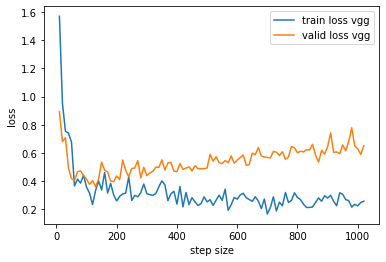

In [ ]:
plt.plot(step_axis_vgg, train_loss_line_vgg,label='train loss vgg')
plt.plot(step_axis_vgg, valid_loss_line_vgg,label='valid loss vgg')
plt.xlabel('step size')
plt.ylabel('loss')
plt.legend()

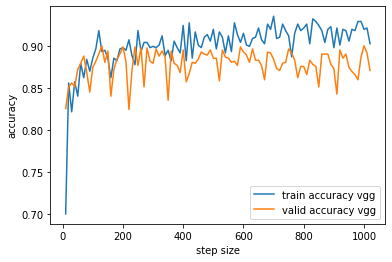

In [ ]:
plt.plot(step_axis_vgg, train_accu_line_vgg,label='train accuracy vgg')
plt.plot(step_axis_vgg, valid_accu_line_vgg,label='valid accuracy vgg')
plt.xlabel('step size')
plt.ylabel('accuracy')
plt.legend()

###vgg fine-tune

In [ ]:
# replace the entire classifier block by encapsulating VGG in a new model

class Modified_VGG_FT(nn.Module):

    def __init__(self):
        super(Modified_VGG_FT, self).__init__()
        self.vgg = torchvision.models.vgg16(pretrained=True)

        for param in self.vgg.parameters():
            param.requires_grad = True

        self.vgg.classifier = nn.Linear(512*7*7, 3)

    def forward(self, images):
        return self.vgg(images)

modified_vgg_ft = Modified_VGG_FT().cuda()
summary(modified_vgg_ft, torch.zeros((64, 3, 32, 32)).cuda())

                                      Kernel Shape       Output Shape  \
Layer                                                                   
0_vgg.features.Conv2d_0              [3, 64, 3, 3]   [64, 64, 32, 32]   
1_vgg.features.ReLU_1                            -   [64, 64, 32, 32]   
2_vgg.features.Conv2d_2             [64, 64, 3, 3]   [64, 64, 32, 32]   
3_vgg.features.ReLU_3                            -   [64, 64, 32, 32]   
4_vgg.features.MaxPool2d_4                       -   [64, 64, 16, 16]   
5_vgg.features.Conv2d_5            [64, 128, 3, 3]  [64, 128, 16, 16]   
6_vgg.features.ReLU_6                            -  [64, 128, 16, 16]   
7_vgg.features.Conv2d_7           [128, 128, 3, 3]  [64, 128, 16, 16]   
8_vgg.features.ReLU_8                            -  [64, 128, 16, 16]   
9_vgg.features.MaxPool2d_9                       -    [64, 128, 8, 8]   
10_vgg.features.Conv2d_10         [128, 256, 3, 3]    [64, 256, 8, 8]   
11_vgg.features.ReLU_11                          - 

,Kernel Shape,Output Shape,Params,Mult-Adds
Layer,,,,
0_vgg.features.Conv2d_0,"[3, 64, 3, 3]","[64, 64, 32, 32]",1792.0,1769472.0
1_vgg.features.ReLU_1,-,"[64, 64, 32, 32]",NaN,NaN
2_vgg.features.Conv2d_2,"[64, 64, 3, 3]","[64, 64, 32, 32]",36928.0,37748736.0
3_vgg.features.ReLU_3,-,"[64, 64, 32, 32]",NaN,NaN
4_vgg.features.MaxPool2d_4,-,"[64, 64, 16, 16]",NaN,NaN
5_vgg.features.Conv2d_5,"[64, 128, 3, 3]","[64, 128, 16, 16]",73856.0,18874368.0
6_vgg.features.ReLU_6,-,"[64, 128, 16, 16]",NaN,NaN
7_vgg.features.Conv2d_7,"[128, 128, 3, 3]","[64, 128, 16, 16]",147584.0,37748736.0
8_vgg.features.ReLU_8,-,"[64, 128, 16, 16]",NaN,NaN


In [ ]:
num_epochs = 20
vgg16_optimizer_ft = optim.Adam(modified_vgg_ft.parameters())
best_accu = None
criterion = nn.CrossEntropyLoss()
save_path = f'/content/drive/My Drive/comp4211/proj1/modified_vgg_ft.pt'

step_axis_vgg2,train_loss_line_vgg2,valid_loss_line_vgg2,train_accu_line_vgg2, valid_accu_line_vgg2 = TRAIN(modified_vgg_ft, train_loader_vgg, valid_loader_vgg, num_epochs, criterion, vgg16_optimizer_ft, best_accu, device, save_path)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg_ft.pt
Epoch [1/20], Train Loss: 0.4150, Train Acc: 0.8938, Valid Loss: 0.2140,  Valid Acc: 0.9460



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg_ft.pt
Epoch [1/20], Train Loss: 0.1555, Train Acc: 0.9563, Valid Loss: 0.1581,  Valid Acc: 0.9497



Epoch [1/20], Train Loss: 0.1970, Train Acc: 0.9453, Valid Loss: 0.2225,  Valid Acc: 0.9239



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg_ft.pt
Epoch [1/20], Train Loss: 0.1904, Train Acc: 0.9328, Valid Loss: 0.1298,  Valid Acc: 0.9534



Epoch [1/20], Train Loss: 0.1382, Train Acc: 0.9594, Valid Loss: 0.1487,  Valid Acc: 0.9509




Epoch [2/20], Train Loss: 0.1154, Train Acc: 0.9609, Valid Loss: 0.1397,  Valid Acc: 0.9460



Epoch [2/20], Train Loss: 0.1326, Train Acc: 0.9500, Valid Loss: 0.2041,  Valid Acc: 0.9313



Epoch [2/20], Train Loss: 0.1847, Train Acc: 0.9375, Valid Loss: 0.1624,  Valid Acc: 0.9399



Epoch [2/20], Train Loss: 0.1416, Train Acc: 0.9469, Valid Loss: 0.1516,  Valid Acc: 0.9411



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg_ft.pt
Epoch [2/20], Train Loss: 0.1166, Train Acc: 0.9625, Valid Loss: 0.1389,  Valid Acc: 0.9558




Epoch [3/20], Train Loss: 0.1208, Train Acc: 0.9563, Valid Loss: 0.1456,  Valid Acc: 0.9534



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg_ft.pt
Epoch [3/20], Train Loss: 0.1246, Train Acc: 0.9656, Valid Loss: 0.1247,  Valid Acc: 0.9571



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg_ft.pt
Epoch [3/20], Train Loss: 0.1727, Train Acc: 0.9484, Valid Loss: 0.1391,  Valid Acc: 0.9583



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg_ft.pt
Epoch [3/20], Train Loss: 0.1336, Train Acc: 0.9594, Valid Loss: 0.1171,  Valid Acc: 0.9644



Epoch [3/20], Train Loss: 0.1144, Train Acc: 0.9609, Valid Loss: 0.1457,  Valid Acc: 0.9558




Epoch [4/20], Train Loss: 0.2649, Train Acc: 0.9016, Valid Loss: 0.2330,  Valid Acc: 0.9399



Epoch [4/20], Train Loss: 0.1990, Train Acc: 0.9531, Valid Loss: 0.1880,  Valid Acc: 0.9374



Epoch [4/20], Train Loss: 0.3060, Train Acc: 0.9125, Valid Loss: 0.2739,  Valid Acc: 0.8540



Epoch [4/20], Train Loss: 0.3524, Train Acc: 0.9078, Valid Loss: 0.3251,  Valid Acc: 0.9043



Epoch [4/20], Train Loss: 0.2645, Train Acc: 0.9031, Valid Loss: 0.2249,  Valid Acc: 0.9337




Epoch [5/20], Train Loss: 0.2081, Train Acc: 0.9328, Valid Loss: 0.1782,  Valid Acc: 0.9276



Epoch [5/20], Train Loss: 0.1939, Train Acc: 0.9375, Valid Loss: 0.1433,  Valid Acc: 0.9485



Epoch [5/20], Train Loss: 0.1362, Train Acc: 0.9500, Valid Loss: 0.2362,  Valid Acc: 0.9264



Epoch [5/20], Train Loss: 0.1241, Train Acc: 0.9500, Valid Loss: 0.1901,  Valid Acc: 0.9399



Epoch [5/20], Train Loss: 0.0729, Train Acc: 0.9781, Valid Loss: 0.1940,  Valid Acc: 0.9521




Epoch [6/20], Train Loss: 0.1070, Train Acc: 0.9578, Valid Loss: 0.1480,  Valid Acc: 0.9558



Epoch [6/20], Train Loss: 0.0742, Train Acc: 0.9828, Valid Loss: 0.1492,  Valid Acc: 0.9546



Epoch [6/20], Train Loss: 0.0528, Train Acc: 0.9875, Valid Loss: 0.1881,  Valid Acc: 0.9632



Epoch [6/20], Train Loss: 0.1173, Train Acc: 0.9781, Valid Loss: 0.1476,  Valid Acc: 0.9546



Epoch [6/20], Train Loss: 0.0896, Train Acc: 0.9688, Valid Loss: 0.1477,  Valid Acc: 0.9595




Epoch [7/20], Train Loss: 0.0556, Train Acc: 0.9719, Valid Loss: 0.1361,  Valid Acc: 0.9620



Epoch [7/20], Train Loss: 0.0567, Train Acc: 0.9844, Valid Loss: 0.1777,  Valid Acc: 0.9571



Epoch [7/20], Train Loss: 0.0497, Train Acc: 0.9844, Valid Loss: 0.2060,  Valid Acc: 0.9558



Epoch [7/20], Train Loss: 0.1382, Train Acc: 0.9578, Valid Loss: 0.1708,  Valid Acc: 0.9423



Epoch [7/20], Train Loss: 0.1376, Train Acc: 0.9672, Valid Loss: 0.1793,  Valid Acc: 0.9423




Epoch [8/20], Train Loss: 0.1396, Train Acc: 0.9406, Valid Loss: 0.1422,  Valid Acc: 0.9497



Epoch [8/20], Train Loss: 0.0667, Train Acc: 0.9797, Valid Loss: 0.1513,  Valid Acc: 0.9595



Epoch [8/20], Train Loss: 0.0446, Train Acc: 0.9844, Valid Loss: 0.1280,  Valid Acc: 0.9595



Epoch [8/20], Train Loss: 0.0654, Train Acc: 0.9781, Valid Loss: 0.1412,  Valid Acc: 0.9521



Epoch [8/20], Train Loss: 0.0786, Train Acc: 0.9812, Valid Loss: 0.2029,  Valid Acc: 0.9362




Epoch [9/20], Train Loss: 0.1216, Train Acc: 0.9531, Valid Loss: 0.1664,  Valid Acc: 0.9546



Epoch [9/20], Train Loss: 0.0957, Train Acc: 0.9719, Valid Loss: 0.2656,  Valid Acc: 0.9534



Epoch [9/20], Train Loss: 0.1902, Train Acc: 0.9516, Valid Loss: 0.1295,  Valid Acc: 0.9546



Epoch [9/20], Train Loss: 0.0969, Train Acc: 0.9703, Valid Loss: 0.1829,  Valid Acc: 0.9583



Epoch [9/20], Train Loss: 0.0924, Train Acc: 0.9719, Valid Loss: 0.1527,  Valid Acc: 0.9534




Epoch [10/20], Train Loss: 0.0852, Train Acc: 0.9641, Valid Loss: 0.1285,  Valid Acc: 0.9583



Epoch [10/20], Train Loss: 0.0461, Train Acc: 0.9875, Valid Loss: 0.1870,  Valid Acc: 0.9558



Epoch [10/20], Train Loss: 0.0633, Train Acc: 0.9828, Valid Loss: 0.2700,  Valid Acc: 0.9460



Epoch [10/20], Train Loss: 0.0659, Train Acc: 0.9781, Valid Loss: 0.1524,  Valid Acc: 0.9595



Epoch [10/20], Train Loss: 0.0717, Train Acc: 0.9781, Valid Loss: 0.1520,  Valid Acc: 0.9583



Epoch [10/20], Train Loss: 0.0811, Train Acc: 0.9688, Valid Loss: 0.1917,  Valid Acc: 0.9460




Epoch [11/20], Train Loss: 0.0868, Train Acc: 0.9766, Valid Loss: 0.1460,  Valid Acc: 0.9607



Epoch [11/20], Train Loss: 0.0384, Train Acc: 0.9891, Valid Loss: 0.1907,  Valid Acc: 0.9620



Epoch [11/20], Train Loss: 0.0736, Train Acc: 0.9812, Valid Loss: 0.1491,  Valid Acc: 0.9558



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg_ft.pt
Epoch [11/20], Train Loss: 0.0888, Train Acc: 0.9656, Valid Loss: 0.1138,  Valid Acc: 0.9681



Epoch [11/20], Train Loss: 0.0624, Train Acc: 0.9828, Valid Loss: 0.1341,  Valid Acc: 0.9644




Epoch [12/20], Train Loss: 0.0651, Train Acc: 0.9688, Valid Loss: 0.1531,  Valid Acc: 0.9583



Epoch [12/20], Train Loss: 0.0447, Train Acc: 0.9891, Valid Loss: 0.1604,  Valid Acc: 0.9656



Epoch [12/20], Train Loss: 0.0475, Train Acc: 0.9859, Valid Loss: 0.1484,  Valid Acc: 0.9620



Epoch [12/20], Train Loss: 0.0253, Train Acc: 0.9922, Valid Loss: 0.1435,  Valid Acc: 0.9681



Epoch [12/20], Train Loss: 0.0204, Train Acc: 0.9953, Valid Loss: 0.1375,  Valid Acc: 0.9620




Epoch [13/20], Train Loss: 0.0238, Train Acc: 0.9844, Valid Loss: 0.1859,  Valid Acc: 0.9632



Epoch [13/20], Train Loss: 0.0185, Train Acc: 0.9938, Valid Loss: 0.1619,  Valid Acc: 0.9681



Epoch [13/20], Train Loss: 0.0401, Train Acc: 0.9906, Valid Loss: 0.1637,  Valid Acc: 0.9632



Model saved to /content/drive/My Drive/comp4211/proj1/modified_vgg_ft.pt
Epoch [13/20], Train Loss: 0.0614, Train Acc: 0.9812, Valid Loss: 0.1310,  Valid Acc: 0.9693



Epoch [13/20], Train Loss: 0.0985, Train Acc: 0.9672, Valid Loss: 0.1844,  Valid Acc: 0.9485




Epoch [14/20], Train Loss: 0.0975, Train Acc: 0.9500, Valid Loss: 0.1402,  Valid Acc: 0.9583



Epoch [14/20], Train Loss: 0.0262, Train Acc: 0.9922, Valid Loss: 0.1910,  Valid Acc: 0.9595



Epoch [14/20], Train Loss: 0.0564, Train Acc: 0.9797, Valid Loss: 0.1623,  Valid Acc: 0.9546



Epoch [14/20], Train Loss: 0.0553, Train Acc: 0.9891, Valid Loss: 0.1678,  Valid Acc: 0.9546



Epoch [14/20], Train Loss: 0.0594, Train Acc: 0.9828, Valid Loss: 0.1997,  Valid Acc: 0.9644




Epoch [15/20], Train Loss: 0.0333, Train Acc: 0.9812, Valid Loss: 0.2065,  Valid Acc: 0.9595



Epoch [15/20], Train Loss: 0.0742, Train Acc: 0.9844, Valid Loss: 0.1832,  Valid Acc: 0.9521



Epoch [15/20], Train Loss: 0.0659, Train Acc: 0.9781, Valid Loss: 0.1330,  Valid Acc: 0.9607



Epoch [15/20], Train Loss: 0.0401, Train Acc: 0.9891, Valid Loss: 0.1532,  Valid Acc: 0.9620



Epoch [15/20], Train Loss: 0.0487, Train Acc: 0.9828, Valid Loss: 0.2206,  Valid Acc: 0.9546




Epoch [16/20], Train Loss: 0.0300, Train Acc: 0.9781, Valid Loss: 0.1596,  Valid Acc: 0.9620



Epoch [16/20], Train Loss: 0.0703, Train Acc: 0.9828, Valid Loss: 0.1679,  Valid Acc: 0.9546



Epoch [16/20], Train Loss: 0.0213, Train Acc: 0.9922, Valid Loss: 0.2215,  Valid Acc: 0.9534



Epoch [16/20], Train Loss: 0.0582, Train Acc: 0.9844, Valid Loss: 0.2405,  Valid Acc: 0.9521



Epoch [16/20], Train Loss: 0.0508, Train Acc: 0.9875, Valid Loss: 0.1332,  Valid Acc: 0.9669




Epoch [17/20], Train Loss: 0.0270, Train Acc: 0.9844, Valid Loss: 0.2378,  Valid Acc: 0.9644



Epoch [17/20], Train Loss: 0.0186, Train Acc: 0.9953, Valid Loss: 0.1782,  Valid Acc: 0.9644



Epoch [17/20], Train Loss: 0.0098, Train Acc: 0.9969, Valid Loss: 0.2673,  Valid Acc: 0.9583



Epoch [17/20], Train Loss: 0.0307, Train Acc: 0.9891, Valid Loss: 0.1842,  Valid Acc: 0.9607



Epoch [17/20], Train Loss: 0.0325, Train Acc: 0.9875, Valid Loss: 0.1920,  Valid Acc: 0.9583




Epoch [18/20], Train Loss: 0.0496, Train Acc: 0.9781, Valid Loss: 0.2558,  Valid Acc: 0.9485



Epoch [18/20], Train Loss: 0.0362, Train Acc: 0.9922, Valid Loss: 0.3247,  Valid Acc: 0.9546



Epoch [18/20], Train Loss: 0.0598, Train Acc: 0.9859, Valid Loss: 0.1639,  Valid Acc: 0.9472



Epoch [18/20], Train Loss: 0.0268, Train Acc: 0.9938, Valid Loss: 0.1410,  Valid Acc: 0.9607



Epoch [18/20], Train Loss: 0.0335, Train Acc: 0.9922, Valid Loss: 0.2074,  Valid Acc: 0.9656




Epoch [19/20], Train Loss: 0.0074, Train Acc: 0.9875, Valid Loss: 0.2418,  Valid Acc: 0.9509



Epoch [19/20], Train Loss: 0.0174, Train Acc: 0.9938, Valid Loss: 0.2143,  Valid Acc: 0.9607



Epoch [19/20], Train Loss: 0.0453, Train Acc: 0.9812, Valid Loss: 0.3485,  Valid Acc: 0.9583



Epoch [19/20], Train Loss: 0.0235, Train Acc: 0.9891, Valid Loss: 0.2924,  Valid Acc: 0.9521



Epoch [19/20], Train Loss: 0.0548, Train Acc: 0.9812, Valid Loss: 0.1924,  Valid Acc: 0.9620




Epoch [20/20], Train Loss: 0.0391, Train Acc: 0.9750, Valid Loss: 0.2324,  Valid Acc: 0.9546



Epoch [20/20], Train Loss: 0.0289, Train Acc: 0.9938, Valid Loss: 0.2787,  Valid Acc: 0.9534



Epoch [20/20], Train Loss: 0.0361, Train Acc: 0.9875, Valid Loss: 0.2297,  Valid Acc: 0.9558



Epoch [20/20], Train Loss: 0.0446, Train Acc: 0.9859, Valid Loss: 0.2558,  Valid Acc: 0.9571



Epoch [20/20], Train Loss: 0.0688, Train Acc: 0.9781, Valid Loss: 0.1369,  Valid Acc: 0.9607



Epoch [20/20], Train Loss: 0.0315, Train Acc: 0.9828, Valid Loss: 0.1986,  Valid Acc: 0.9571

Finished Training


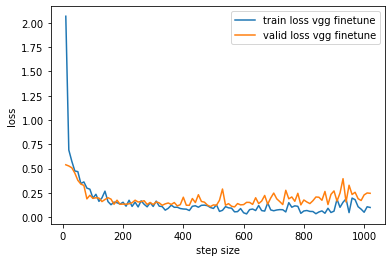

In [ ]:
plt.plot(step_axis_vgg2, train_loss_line_vgg2,label='train loss vgg finetune')
plt.plot(step_axis_vgg2, valid_loss_line_vgg2,label='valid loss vgg finetune')
plt.xlabel('step size')
plt.ylabel('loss')
plt.legend()

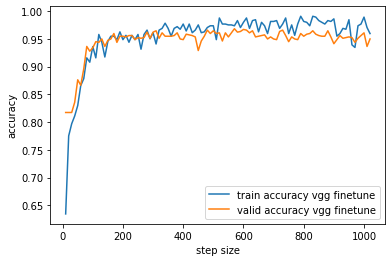

In [ ]:
plt.plot(step_axis_vgg2, train_accu_line_vgg2,label='train accuracy vgg finetune')
plt.plot(step_axis_vgg2, valid_accu_line_vgg2,label='valid accuracy vgg finetune')
plt.xlabel('step size')
plt.ylabel('accuracy')
plt.legend()

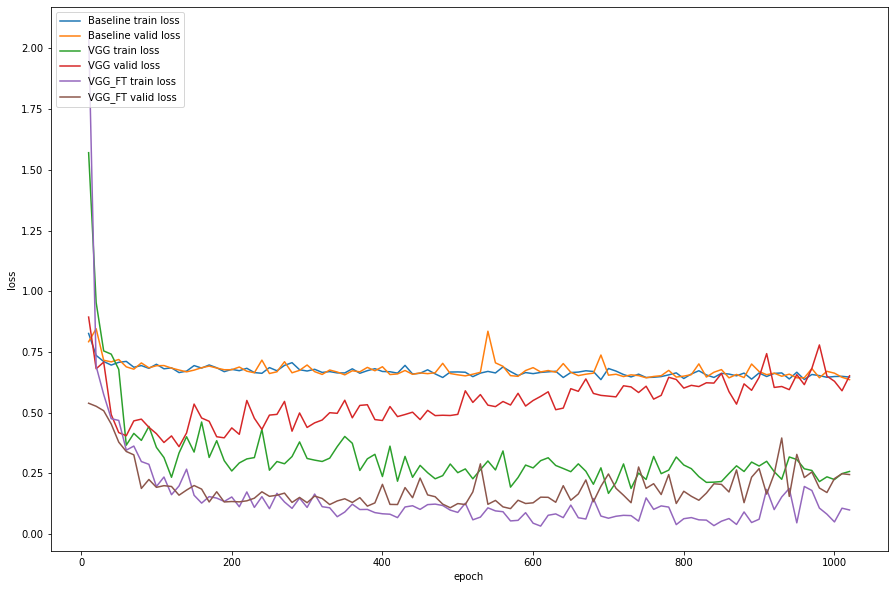

In [ ]:
plt.figure(figsize = (15,10))

plt.plot(step_axis_base, train_loss_line_base,label='Baseline train loss')
plt.plot(step_axis_base, valid_loss_line_base,label='Baseline valid loss')

plt.plot(step_axis_base, train_loss_line_vgg,label='VGG train loss')
plt.plot(step_axis_base, valid_loss_line_vgg,label='VGG valid loss')

plt.plot(step_axis_base, train_loss_line_vgg2,label='VGG_FT train loss')
plt.plot(step_axis_base, valid_loss_line_vgg2,label='VGG_FT valid loss')

plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(loc = 2)

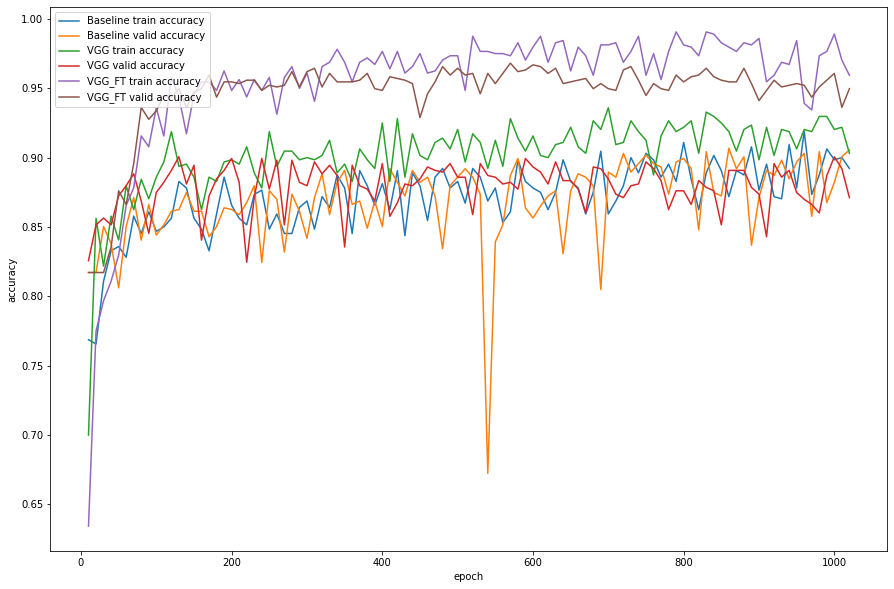

In [ ]:
plt.figure(figsize = (15,10))

plt.plot(step_axis_base, train_accu_line_base,label='Baseline train accuracy')
plt.plot(step_axis_base, valid_accu_line_base,label='Baseline valid accuracy')

plt.plot(step_axis_base, train_accu_line_vgg,label='VGG train accuracy')
plt.plot(step_axis_base, valid_accu_line_vgg,label='VGG valid accuracy')

plt.plot(step_axis_base, train_accu_line_vgg2,label='VGG_FT train accuracy')
plt.plot(step_axis_base, valid_accu_line_vgg2,label='VGG_FT valid accuracy')

plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend(loc = 2)

In [ ]:
d_list = [train_accu_line_vgg,valid_accu_line_vgg,train_loss_line_vgg,valid_loss_line_vgg]
df_vgg = pd.DataFrame.from_records(d_list)
df_vgg = df_vgg.T
df_vgg.columns = ['train_accu_line_vgg','valid_accu_line_vgg','train_loss_line_vgg','valid_loss_line_vgg']
df_vgg.to_csv('/content/drive/My Drive/comp4211/proj1/df_vgg.csv', header=True, index=False)

In [ ]:
df_vgg

,train_accu_line_vgg,valid_accu_line_vgg,train_loss_line_vgg,valid_loss_line_vgg
0,"tensor(0.7000, device='cuda:0')","tensor(0.8258, device='cuda:0')",1.57035,0.893675
1,"tensor(0.8562, device='cuda:0')","tensor(0.8515, device='cuda:0')",0.953321,0.680829
2,"tensor(0.8219, device='cuda:0')","tensor(0.8564, device='cuda:0')",0.754327,0.708231
3,"tensor(0.8578, device='cuda:0')","tensor(0.8515, device='cuda:0')",0.741035,0.49239
4,"tensor(0.8406, device='cuda:0')","tensor(0.8724, device='cuda:0')",0.67817,0.418084
...,...,...,...,...
97,"tensor(0.9297, device='cuda:0')","tensor(0.8601, device='cuda:0')",0.216389,0.778967
98,"tensor(0.9297, device='cuda:0')","tensor(0.8871, device='cuda:0')",0.236118,0.650673
99,"tensor(0.9203, device='cuda:0')","tensor(0.9006, device='cuda:0')",0.224872,0.629411
100,"tensor(0.9219, device='cuda:0')","tensor(0.8920, device='cuda:0')",0.249385,0.590253


In [ ]:
d_list2 = [train_accu_line_vgg2,valid_accu_line_vgg2,train_loss_line_vgg2,valid_loss_line_vgg2]
df_vgg2 = pd.DataFrame.from_records(d_list2)
df_vgg2 = df_vgg2.T
df_vgg2.columns = ['train_accu_line_vgg2','valid_accu_line_vgg2','train_loss_line_vgg2','valid_loss_line_vgg2']
df_vgg2.to_csv('/content/drive/My Drive/comp4211/proj1/df_vgg_ft.csv', header=True, index=False)

In [ ]:
df_vgg2

,train_accu_line_vgg2,valid_accu_line_vgg2,train_loss_line_vgg2,valid_loss_line_vgg2
0,"tensor(0.6344, device='cuda:0')","tensor(0.8172, device='cuda:0')",2.06745,0.539017
1,"tensor(0.7750, device='cuda:0')","tensor(0.8172, device='cuda:0')",0.691134,0.526538
2,"tensor(0.7969, device='cuda:0')","tensor(0.8172, device='cuda:0')",0.575013,0.50813
3,"tensor(0.8109, device='cuda:0')","tensor(0.8356, device='cuda:0')",0.475386,0.453456
4,"tensor(0.8297, device='cuda:0')","tensor(0.8761, device='cuda:0')",0.468233,0.3788
...,...,...,...,...
97,"tensor(0.9734, device='cuda:0')","tensor(0.9509, device='cuda:0')",0.10748,0.190035
98,"tensor(0.9766, device='cuda:0')","tensor(0.9558, device='cuda:0')",0.0823479,0.171502
99,"tensor(0.9891, device='cuda:0')","tensor(0.9607, device='cuda:0')",0.0504954,0.228874
100,"tensor(0.9703, device='cuda:0')","tensor(0.9362, device='cuda:0')",0.106954,0.248806


##Pretrained model -- resnet18

In [ ]:
transf_res = transforms.Compose(
    [transforms.Resize((32,32)), transforms.ToTensor()])

train_dataest_res = MaskDataset_clip(data_train_path, transforms=transf_res)
valid_dataest_res = MaskDataset_clip(data_valid_path, transforms=transf_res)

bs = 64

train_loader_res = DataLoader(train_dataest_res, batch_size=bs, shuffle=True, num_workers=4, pin_memory=True)
valid_loader_res = DataLoader(valid_dataest_res, batch_size=1, shuffle=False, num_workers=4, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
resnet18 = torchvision.models.resnet18(pretrained=True).cuda()
summary(resnet18, torch.zeros((64, 3, 32, 32)).cuda())

                                          Kernel Shape      Output Shape  \
Layer                                                                      
0_conv1                                  [3, 64, 7, 7]  [64, 64, 16, 16]   
1_bn1                                             [64]  [64, 64, 16, 16]   
2_relu                                               -  [64, 64, 16, 16]   
3_maxpool                                            -    [64, 64, 8, 8]   
4_layer1.0.Conv2d_conv1                 [64, 64, 3, 3]    [64, 64, 8, 8]   
5_layer1.0.BatchNorm2d_bn1                        [64]    [64, 64, 8, 8]   
6_layer1.0.ReLU_relu                                 -    [64, 64, 8, 8]   
7_layer1.0.Conv2d_conv2                 [64, 64, 3, 3]    [64, 64, 8, 8]   
8_layer1.0.BatchNorm2d_bn2                        [64]    [64, 64, 8, 8]   
9_layer1.0.ReLU_relu                                 -    [64, 64, 8, 8]   
10_layer1.1.Conv2d_conv1                [64, 64, 3, 3]    [64, 64, 8, 8]   
11_layer1.1.

,Kernel Shape,Output Shape,Params,Mult-Adds
Layer,,,,
0_conv1,"[3, 64, 7, 7]","[64, 64, 16, 16]",9408.0,2408448.0
1_bn1,[64],"[64, 64, 16, 16]",128.0,64.0
2_relu,-,"[64, 64, 16, 16]",NaN,NaN
3_maxpool,-,"[64, 64, 8, 8]",NaN,NaN
4_layer1.0.Conv2d_conv1,"[64, 64, 3, 3]","[64, 64, 8, 8]",36864.0,2359296.0
5_layer1.0.BatchNorm2d_bn1,[64],"[64, 64, 8, 8]",128.0,64.0
6_layer1.0.ReLU_relu,-,"[64, 64, 8, 8]",NaN,NaN
7_layer1.0.Conv2d_conv2,"[64, 64, 3, 3]","[64, 64, 8, 8]",36864.0,2359296.0
8_layer1.0.BatchNorm2d_bn2,[64],"[64, 64, 8, 8]",128.0,64.0


In [ ]:
class Modified_resnet18(nn.Module):

    def __init__(self):
        super(Modified_resnet18, self).__init__()
        self.resnet18 = torchvision.models.resnet18(pretrained=True)

        for param in self.resnet18.parameters():
            param.requires_grad = False

        self.resnet18.fc = nn.Linear(512, 3)

    def forward(self, images):
        return self.resnet18(images)

modified_resnet18 = Modified_resnet18().cuda()
summary(modified_resnet18, torch.zeros((64, 3, 32, 32)).cuda())

                                                   Kernel Shape  \
Layer                                                             
0_resnet18.Conv2d_conv1                           [3, 64, 7, 7]   
1_resnet18.BatchNorm2d_bn1                                 [64]   
2_resnet18.ReLU_relu                                          -   
3_resnet18.MaxPool2d_maxpool                                  -   
4_resnet18.layer1.0.Conv2d_conv1                 [64, 64, 3, 3]   
5_resnet18.layer1.0.BatchNorm2d_bn1                        [64]   
6_resnet18.layer1.0.ReLU_relu                                 -   
7_resnet18.layer1.0.Conv2d_conv2                 [64, 64, 3, 3]   
8_resnet18.layer1.0.BatchNorm2d_bn2                        [64]   
9_resnet18.layer1.0.ReLU_relu                                 -   
10_resnet18.layer1.1.Conv2d_conv1                [64, 64, 3, 3]   
11_resnet18.layer1.1.BatchNorm2d_bn1                       [64]   
12_resnet18.layer1.1.ReLU_relu                                

,Kernel Shape,Output Shape,Params,Mult-Adds
Layer,,,,
0_resnet18.Conv2d_conv1,"[3, 64, 7, 7]","[64, 64, 16, 16]",NaN,NaN
1_resnet18.BatchNorm2d_bn1,[64],"[64, 64, 16, 16]",NaN,NaN
2_resnet18.ReLU_relu,-,"[64, 64, 16, 16]",NaN,NaN
3_resnet18.MaxPool2d_maxpool,-,"[64, 64, 8, 8]",NaN,NaN
4_resnet18.layer1.0.Conv2d_conv1,"[64, 64, 3, 3]","[64, 64, 8, 8]",NaN,NaN
5_resnet18.layer1.0.BatchNorm2d_bn1,[64],"[64, 64, 8, 8]",NaN,NaN
6_resnet18.layer1.0.ReLU_relu,-,"[64, 64, 8, 8]",NaN,NaN
7_resnet18.layer1.0.Conv2d_conv2,"[64, 64, 3, 3]","[64, 64, 8, 8]",NaN,NaN
8_resnet18.layer1.0.BatchNorm2d_bn2,[64],"[64, 64, 8, 8]",NaN,NaN


In [ ]:
num_epochs = 20
res18_optimizer = optim.Adam(modified_resnet18.parameters())
best_accu = None
criterion = nn.CrossEntropyLoss()
save_path = f'/content/drive/My Drive/comp4211/proj1/modified_res18.pt'

step_axis_res18,train_loss_line_res18,valid_loss_line_res18,train_accu_line_res18, valid_accu_line_res18 = TRAIN(modified_resnet18, train_loader_res, valid_loader_res, num_epochs, criterion, res18_optimizer, best_accu, device, save_path)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [1/20], Train Loss: 0.7186, Train Acc: 0.7547, Valid Loss: 0.9169,  Valid Acc: 0.4613



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [1/20], Train Loss: 0.6134, Train Acc: 0.7797, Valid Loss: 0.6760,  Valid Acc: 0.7595



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [1/20], Train Loss: 0.6089, Train Acc: 0.7781, Valid Loss: 0.5917,  Valid Acc: 0.8098



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [1/20], Train Loss: 0.6046, Train Acc: 0.8109, Valid Loss: 0.5347,  Valid Acc: 0.8172



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [1/20], Train Loss: 0.5280, Train Acc: 0.8063, Valid Loss: 0.5233,  Valid Acc: 0.8184




Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [2/20], Train Loss: 0.5024, Train Acc: 0.8078, Valid Loss: 0.5011,  Valid Acc: 0.8245



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [2/20], Train Loss: 0.4773, Train Acc: 0.8234, Valid Loss: 0.4896,  Valid Acc: 0.8344



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [2/20], Train Loss: 0.4946, Train Acc: 0.8266, Valid Loss: 0.4752,  Valid Acc: 0.8356



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [2/20], Train Loss: 0.4844, Train Acc: 0.8359, Valid Loss: 0.4705,  Valid Acc: 0.8429



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [2/20], Train Loss: 0.4928, Train Acc: 0.8344, Valid Loss: 0.4506,  Valid Acc: 0.8479




Epoch [3/20], Train Loss: 0.4726, Train Acc: 0.8188, Valid Loss: 0.4498,  Valid Acc: 0.8417



Epoch [3/20], Train Loss: 0.4695, Train Acc: 0.8391, Valid Loss: 0.4470,  Valid Acc: 0.8454



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [3/20], Train Loss: 0.4468, Train Acc: 0.8391, Valid Loss: 0.4406,  Valid Acc: 0.8528



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [3/20], Train Loss: 0.4450, Train Acc: 0.8313, Valid Loss: 0.4426,  Valid Acc: 0.8552



Epoch [3/20], Train Loss: 0.4761, Train Acc: 0.8125, Valid Loss: 0.4417,  Valid Acc: 0.8491




Epoch [4/20], Train Loss: 0.4354, Train Acc: 0.8250, Valid Loss: 0.4392,  Valid Acc: 0.8479



Epoch [4/20], Train Loss: 0.4178, Train Acc: 0.8578, Valid Loss: 0.4321,  Valid Acc: 0.8528



Epoch [4/20], Train Loss: 0.4968, Train Acc: 0.8203, Valid Loss: 0.4511,  Valid Acc: 0.8515



Epoch [4/20], Train Loss: 0.4169, Train Acc: 0.8438, Valid Loss: 0.4322,  Valid Acc: 0.8466



Epoch [4/20], Train Loss: 0.3984, Train Acc: 0.8547, Valid Loss: 0.4358,  Valid Acc: 0.8552




Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [5/20], Train Loss: 0.4163, Train Acc: 0.8359, Valid Loss: 0.4203,  Valid Acc: 0.8564



Epoch [5/20], Train Loss: 0.3920, Train Acc: 0.8562, Valid Loss: 0.4243,  Valid Acc: 0.8491



Epoch [5/20], Train Loss: 0.3850, Train Acc: 0.8562, Valid Loss: 0.4265,  Valid Acc: 0.8466



Epoch [5/20], Train Loss: 0.4755, Train Acc: 0.8234, Valid Loss: 0.4301,  Valid Acc: 0.8564



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [5/20], Train Loss: 0.4874, Train Acc: 0.8344, Valid Loss: 0.4228,  Valid Acc: 0.8601




Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [6/20], Train Loss: 0.4726, Train Acc: 0.8156, Valid Loss: 0.4162,  Valid Acc: 0.8687



Epoch [6/20], Train Loss: 0.3700, Train Acc: 0.8578, Valid Loss: 0.4219,  Valid Acc: 0.8577



Epoch [6/20], Train Loss: 0.4511, Train Acc: 0.8313, Valid Loss: 0.4233,  Valid Acc: 0.8552



Epoch [6/20], Train Loss: 0.4241, Train Acc: 0.8422, Valid Loss: 0.4165,  Valid Acc: 0.8589



Epoch [6/20], Train Loss: 0.4053, Train Acc: 0.8516, Valid Loss: 0.4321,  Valid Acc: 0.8589




Epoch [7/20], Train Loss: 0.4134, Train Acc: 0.8375, Valid Loss: 0.4144,  Valid Acc: 0.8601



Epoch [7/20], Train Loss: 0.3745, Train Acc: 0.8672, Valid Loss: 0.4172,  Valid Acc: 0.8638



Epoch [7/20], Train Loss: 0.3667, Train Acc: 0.8750, Valid Loss: 0.4142,  Valid Acc: 0.8552



Epoch [7/20], Train Loss: 0.4233, Train Acc: 0.8469, Valid Loss: 0.4398,  Valid Acc: 0.8638



Epoch [7/20], Train Loss: 0.4179, Train Acc: 0.8500, Valid Loss: 0.4206,  Valid Acc: 0.8577




Epoch [8/20], Train Loss: 0.4065, Train Acc: 0.8484, Valid Loss: 0.4285,  Valid Acc: 0.8577



Epoch [8/20], Train Loss: 0.3649, Train Acc: 0.8609, Valid Loss: 0.4166,  Valid Acc: 0.8552



Epoch [8/20], Train Loss: 0.3681, Train Acc: 0.8750, Valid Loss: 0.4100,  Valid Acc: 0.8601



Epoch [8/20], Train Loss: 0.3926, Train Acc: 0.8500, Valid Loss: 0.4071,  Valid Acc: 0.8589



Epoch [8/20], Train Loss: 0.4205, Train Acc: 0.8484, Valid Loss: 0.4125,  Valid Acc: 0.8577




Epoch [9/20], Train Loss: 0.3926, Train Acc: 0.8516, Valid Loss: 0.4108,  Valid Acc: 0.8564



Epoch [9/20], Train Loss: 0.3659, Train Acc: 0.8641, Valid Loss: 0.4331,  Valid Acc: 0.8601



Epoch [9/20], Train Loss: 0.3860, Train Acc: 0.8625, Valid Loss: 0.4169,  Valid Acc: 0.8564



Epoch [9/20], Train Loss: 0.3875, Train Acc: 0.8719, Valid Loss: 0.4218,  Valid Acc: 0.8601



Epoch [9/20], Train Loss: 0.4173, Train Acc: 0.8422, Valid Loss: 0.4165,  Valid Acc: 0.8626




Epoch [10/20], Train Loss: 0.3952, Train Acc: 0.8344, Valid Loss: 0.4178,  Valid Acc: 0.8663



Epoch [10/20], Train Loss: 0.3551, Train Acc: 0.8703, Valid Loss: 0.4258,  Valid Acc: 0.8638



Epoch [10/20], Train Loss: 0.3596, Train Acc: 0.8750, Valid Loss: 0.4177,  Valid Acc: 0.8601



Epoch [10/20], Train Loss: 0.4059, Train Acc: 0.8578, Valid Loss: 0.4088,  Valid Acc: 0.8528



Epoch [10/20], Train Loss: 0.4163, Train Acc: 0.8406, Valid Loss: 0.4136,  Valid Acc: 0.8601



Epoch [10/20], Train Loss: 0.3943, Train Acc: 0.8438, Valid Loss: 0.4085,  Valid Acc: 0.8577




Epoch [11/20], Train Loss: 0.3509, Train Acc: 0.8625, Valid Loss: 0.4116,  Valid Acc: 0.8577



Epoch [11/20], Train Loss: 0.3692, Train Acc: 0.8688, Valid Loss: 0.4063,  Valid Acc: 0.8564



Epoch [11/20], Train Loss: 0.3255, Train Acc: 0.8938, Valid Loss: 0.4076,  Valid Acc: 0.8577



Epoch [11/20], Train Loss: 0.3693, Train Acc: 0.8578, Valid Loss: 0.4128,  Valid Acc: 0.8613



Epoch [11/20], Train Loss: 0.3767, Train Acc: 0.8688, Valid Loss: 0.4216,  Valid Acc: 0.8626




Epoch [12/20], Train Loss: 0.3523, Train Acc: 0.8562, Valid Loss: 0.4187,  Valid Acc: 0.8528



Epoch [12/20], Train Loss: 0.3944, Train Acc: 0.8453, Valid Loss: 0.4440,  Valid Acc: 0.8515



Epoch [12/20], Train Loss: 0.3663, Train Acc: 0.8797, Valid Loss: 0.4232,  Valid Acc: 0.8577



Epoch [12/20], Train Loss: 0.3930, Train Acc: 0.8641, Valid Loss: 0.4038,  Valid Acc: 0.8577



Epoch [12/20], Train Loss: 0.4110, Train Acc: 0.8500, Valid Loss: 0.4063,  Valid Acc: 0.8601




Epoch [13/20], Train Loss: 0.3976, Train Acc: 0.8406, Valid Loss: 0.4039,  Valid Acc: 0.8577



Epoch [13/20], Train Loss: 0.3651, Train Acc: 0.8609, Valid Loss: 0.4140,  Valid Acc: 0.8613



Epoch [13/20], Train Loss: 0.4036, Train Acc: 0.8453, Valid Loss: 0.4118,  Valid Acc: 0.8613



Epoch [13/20], Train Loss: 0.3499, Train Acc: 0.8734, Valid Loss: 0.4168,  Valid Acc: 0.8552



Epoch [13/20], Train Loss: 0.3680, Train Acc: 0.8688, Valid Loss: 0.4189,  Valid Acc: 0.8564




Epoch [14/20], Train Loss: 0.3765, Train Acc: 0.8422, Valid Loss: 0.4074,  Valid Acc: 0.8650



Epoch [14/20], Train Loss: 0.3864, Train Acc: 0.8562, Valid Loss: 0.4059,  Valid Acc: 0.8613



Epoch [14/20], Train Loss: 0.3374, Train Acc: 0.8750, Valid Loss: 0.4035,  Valid Acc: 0.8663



Epoch [14/20], Train Loss: 0.3835, Train Acc: 0.8797, Valid Loss: 0.4075,  Valid Acc: 0.8601



Epoch [14/20], Train Loss: 0.3721, Train Acc: 0.8594, Valid Loss: 0.4102,  Valid Acc: 0.8626




Epoch [15/20], Train Loss: 0.3624, Train Acc: 0.8531, Valid Loss: 0.4084,  Valid Acc: 0.8675



Epoch [15/20], Train Loss: 0.3565, Train Acc: 0.8766, Valid Loss: 0.4103,  Valid Acc: 0.8626



Epoch [15/20], Train Loss: 0.3707, Train Acc: 0.8625, Valid Loss: 0.4211,  Valid Acc: 0.8650



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18.pt
Epoch [15/20], Train Loss: 0.3428, Train Acc: 0.8516, Valid Loss: 0.4195,  Valid Acc: 0.8724



Epoch [15/20], Train Loss: 0.3666, Train Acc: 0.8641, Valid Loss: 0.4163,  Valid Acc: 0.8613




Epoch [16/20], Train Loss: 0.3459, Train Acc: 0.8781, Valid Loss: 0.4225,  Valid Acc: 0.8577



Epoch [16/20], Train Loss: 0.3277, Train Acc: 0.8844, Valid Loss: 0.4191,  Valid Acc: 0.8650



Epoch [16/20], Train Loss: 0.3874, Train Acc: 0.8625, Valid Loss: 0.4052,  Valid Acc: 0.8699



Epoch [16/20], Train Loss: 0.3648, Train Acc: 0.8531, Valid Loss: 0.4123,  Valid Acc: 0.8699



Epoch [16/20], Train Loss: 0.3477, Train Acc: 0.8656, Valid Loss: 0.4093,  Valid Acc: 0.8626




Epoch [17/20], Train Loss: 0.4017, Train Acc: 0.8250, Valid Loss: 0.4098,  Valid Acc: 0.8638



Epoch [17/20], Train Loss: 0.3651, Train Acc: 0.8609, Valid Loss: 0.4111,  Valid Acc: 0.8638



Epoch [17/20], Train Loss: 0.3361, Train Acc: 0.8813, Valid Loss: 0.4123,  Valid Acc: 0.8552



Epoch [17/20], Train Loss: 0.3893, Train Acc: 0.8531, Valid Loss: 0.4179,  Valid Acc: 0.8675



Epoch [17/20], Train Loss: 0.3792, Train Acc: 0.8609, Valid Loss: 0.4187,  Valid Acc: 0.8540




Epoch [18/20], Train Loss: 0.3578, Train Acc: 0.8656, Valid Loss: 0.4169,  Valid Acc: 0.8626



Epoch [18/20], Train Loss: 0.3508, Train Acc: 0.8813, Valid Loss: 0.4156,  Valid Acc: 0.8540



Epoch [18/20], Train Loss: 0.4283, Train Acc: 0.8328, Valid Loss: 0.4445,  Valid Acc: 0.8466



Epoch [18/20], Train Loss: 0.4052, Train Acc: 0.8484, Valid Loss: 0.4260,  Valid Acc: 0.8589



Epoch [18/20], Train Loss: 0.3589, Train Acc: 0.8609, Valid Loss: 0.4211,  Valid Acc: 0.8589




Epoch [19/20], Train Loss: 0.3611, Train Acc: 0.8484, Valid Loss: 0.4091,  Valid Acc: 0.8638



Epoch [19/20], Train Loss: 0.3234, Train Acc: 0.8906, Valid Loss: 0.4190,  Valid Acc: 0.8724



Epoch [19/20], Train Loss: 0.3618, Train Acc: 0.8656, Valid Loss: 0.4118,  Valid Acc: 0.8564



Epoch [19/20], Train Loss: 0.3571, Train Acc: 0.8781, Valid Loss: 0.4179,  Valid Acc: 0.8601



Epoch [19/20], Train Loss: 0.3805, Train Acc: 0.8609, Valid Loss: 0.4132,  Valid Acc: 0.8650




Epoch [20/20], Train Loss: 0.3803, Train Acc: 0.8438, Valid Loss: 0.4042,  Valid Acc: 0.8675



Epoch [20/20], Train Loss: 0.3734, Train Acc: 0.8531, Valid Loss: 0.4014,  Valid Acc: 0.8663



Epoch [20/20], Train Loss: 0.3555, Train Acc: 0.8813, Valid Loss: 0.4097,  Valid Acc: 0.8675



Epoch [20/20], Train Loss: 0.3426, Train Acc: 0.8641, Valid Loss: 0.4196,  Valid Acc: 0.8613



Epoch [20/20], Train Loss: 0.4069, Train Acc: 0.8453, Valid Loss: 0.4159,  Valid Acc: 0.8638



Epoch [20/20], Train Loss: 0.3485, Train Acc: 0.8547, Valid Loss: 0.4100,  Valid Acc: 0.8650

Finished Training


###resnet18 -- finetune

In [ ]:
class Modified_resnet18_FT(nn.Module):

    def __init__(self):
        super(Modified_resnet18_FT, self).__init__()
        self.resnet18 = torchvision.models.resnet18(pretrained=True)

        for param in self.resnet18.parameters():
            param.requires_grad = True

        self.resnet18.fc = nn.Linear(512, 3)

    def forward(self, images):
        return self.resnet18(images)

modified_resnet18_ft = Modified_resnet18_FT().cuda()
summary(modified_resnet18_ft, torch.zeros((64, 3, 32, 32)).cuda())

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth



                                                   Kernel Shape  \
Layer                                                             
0_resnet18.Conv2d_conv1                           [3, 64, 7, 7]   
1_resnet18.BatchNorm2d_bn1                                 [64]   
2_resnet18.ReLU_relu                                          -   
3_resnet18.MaxPool2d_maxpool                                  -   
4_resnet18.layer1.0.Conv2d_conv1                 [64, 64, 3, 3]   
5_resnet18.layer1.0.BatchNorm2d_bn1                        [64]   
6_resnet18.layer1.0.ReLU_relu                                 -   
7_resnet18.layer1.0.Conv2d_conv2                 [64, 64, 3, 3]   
8_resnet18.layer1.0.BatchNorm2d_bn2                        [64]   
9_resnet18.layer1.0.ReLU_relu                                 -   
10_resnet18.layer1.1.Conv2d_conv1                [64, 64, 3, 3]   
11_resnet18.layer1.1.BatchNorm2d_bn1                       [64]   
12_resnet18.layer1.1.ReLU_relu                               

,Kernel Shape,Output Shape,Params,Mult-Adds
Layer,,,,
0_resnet18.Conv2d_conv1,"[3, 64, 7, 7]","[64, 64, 16, 16]",9408.0,2408448.0
1_resnet18.BatchNorm2d_bn1,[64],"[64, 64, 16, 16]",128.0,64.0
2_resnet18.ReLU_relu,-,"[64, 64, 16, 16]",NaN,NaN
3_resnet18.MaxPool2d_maxpool,-,"[64, 64, 8, 8]",NaN,NaN
4_resnet18.layer1.0.Conv2d_conv1,"[64, 64, 3, 3]","[64, 64, 8, 8]",36864.0,2359296.0
5_resnet18.layer1.0.BatchNorm2d_bn1,[64],"[64, 64, 8, 8]",128.0,64.0
6_resnet18.layer1.0.ReLU_relu,-,"[64, 64, 8, 8]",NaN,NaN
7_resnet18.layer1.0.Conv2d_conv2,"[64, 64, 3, 3]","[64, 64, 8, 8]",36864.0,2359296.0
8_resnet18.layer1.0.BatchNorm2d_bn2,[64],"[64, 64, 8, 8]",128.0,64.0


In [ ]:
num_epochs = 20
res18_optimizer = optim.Adam(modified_resnet18_ft.parameters())
best_accu = None
criterion = nn.CrossEntropyLoss()
save_path = f'/content/drive/My Drive/comp4211/proj1/modified_res18_ft.pt'

step_res18_ft,train_loss_res18_ft,valid_loss_res18_ft,train_accu_res18_ft, valid_accu_res18ft = TRAIN(modified_resnet18_ft, train_loader_res, valid_loader_res, num_epochs, criterion, res18_optimizer, best_accu, device, save_path)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18_ft.pt
Epoch [1/20], Train Loss: 0.5923, Train Acc: 0.7906, Valid Loss: 1.7384,  Valid Acc: 0.6172



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18_ft.pt
Epoch [1/20], Train Loss: 0.2708, Train Acc: 0.9141, Valid Loss: 1.1670,  Valid Acc: 0.7963



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18_ft.pt
Epoch [1/20], Train Loss: 0.2779, Train Acc: 0.9156, Valid Loss: 0.6181,  Valid Acc: 0.8049



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18_ft.pt
Epoch [1/20], Train Loss: 0.2012, Train Acc: 0.9328, Valid Loss: 0.3384,  Valid Acc: 0.9239



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18_ft.pt
Epoch [1/20], Train Loss: 0.1468, Train Acc: 0.9594, Valid Loss: 0.2536,  Valid Acc: 0.9472




Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18_ft.pt
Epoch [2/20], Train Loss: 0.1303, Train Acc: 0.9422, Valid Loss: 0.1792,  Valid Acc: 0.9558



Epoch [2/20], Train Loss: 0.1174, Train Acc: 0.9656, Valid Loss: 0.1862,  Valid Acc: 0.9521



Epoch [2/20], Train Loss: 0.1700, Train Acc: 0.9516, Valid Loss: 0.1548,  Valid Acc: 0.9521



Epoch [2/20], Train Loss: 0.1904, Train Acc: 0.9422, Valid Loss: 0.1618,  Valid Acc: 0.9436



Epoch [2/20], Train Loss: 0.1575, Train Acc: 0.9453, Valid Loss: 0.1603,  Valid Acc: 0.9472




Epoch [3/20], Train Loss: 0.1618, Train Acc: 0.9344, Valid Loss: 0.1405,  Valid Acc: 0.9485



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18_ft.pt
Epoch [3/20], Train Loss: 0.1073, Train Acc: 0.9641, Valid Loss: 0.1190,  Valid Acc: 0.9620



Epoch [3/20], Train Loss: 0.1273, Train Acc: 0.9641, Valid Loss: 0.1351,  Valid Acc: 0.9509



Epoch [3/20], Train Loss: 0.1170, Train Acc: 0.9688, Valid Loss: 0.1548,  Valid Acc: 0.9571



Epoch [3/20], Train Loss: 0.0909, Train Acc: 0.9734, Valid Loss: 0.1416,  Valid Acc: 0.9571




Epoch [4/20], Train Loss: 0.0714, Train Acc: 0.9656, Valid Loss: 0.1895,  Valid Acc: 0.9546



Epoch [4/20], Train Loss: 0.1291, Train Acc: 0.9641, Valid Loss: 0.1339,  Valid Acc: 0.9436



Epoch [4/20], Train Loss: 0.1255, Train Acc: 0.9547, Valid Loss: 0.1301,  Valid Acc: 0.9583



Epoch [4/20], Train Loss: 0.0701, Train Acc: 0.9766, Valid Loss: 0.1295,  Valid Acc: 0.9534



Epoch [4/20], Train Loss: 0.0974, Train Acc: 0.9688, Valid Loss: 0.1546,  Valid Acc: 0.9546




Epoch [5/20], Train Loss: 0.0638, Train Acc: 0.9688, Valid Loss: 0.1668,  Valid Acc: 0.9583



Epoch [5/20], Train Loss: 0.0689, Train Acc: 0.9750, Valid Loss: 0.1795,  Valid Acc: 0.9521



Epoch [5/20], Train Loss: 0.0566, Train Acc: 0.9859, Valid Loss: 0.1764,  Valid Acc: 0.9485



Epoch [5/20], Train Loss: 0.0639, Train Acc: 0.9797, Valid Loss: 0.1350,  Valid Acc: 0.9546



Epoch [5/20], Train Loss: 0.0728, Train Acc: 0.9750, Valid Loss: 0.1379,  Valid Acc: 0.9595




Epoch [6/20], Train Loss: 0.0455, Train Acc: 0.9719, Valid Loss: 0.1295,  Valid Acc: 0.9620



Epoch [6/20], Train Loss: 0.0428, Train Acc: 0.9906, Valid Loss: 0.1243,  Valid Acc: 0.9620



Epoch [6/20], Train Loss: 0.0467, Train Acc: 0.9859, Valid Loss: 0.1362,  Valid Acc: 0.9571



Epoch [6/20], Train Loss: 0.0687, Train Acc: 0.9781, Valid Loss: 0.1351,  Valid Acc: 0.9620



Epoch [6/20], Train Loss: 0.0614, Train Acc: 0.9812, Valid Loss: 0.1756,  Valid Acc: 0.9509




Epoch [7/20], Train Loss: 0.0849, Train Acc: 0.9594, Valid Loss: 0.1591,  Valid Acc: 0.9534



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18_ft.pt
Epoch [7/20], Train Loss: 0.0393, Train Acc: 0.9875, Valid Loss: 0.1462,  Valid Acc: 0.9656



Model saved to /content/drive/My Drive/comp4211/proj1/modified_res18_ft.pt
Epoch [7/20], Train Loss: 0.0671, Train Acc: 0.9797, Valid Loss: 0.1335,  Valid Acc: 0.9693



Epoch [7/20], Train Loss: 0.0662, Train Acc: 0.9781, Valid Loss: 0.1807,  Valid Acc: 0.9485



Epoch [7/20], Train Loss: 0.0942, Train Acc: 0.9734, Valid Loss: 0.1401,  Valid Acc: 0.9546




Epoch [8/20], Train Loss: 0.0747, Train Acc: 0.9656, Valid Loss: 0.2509,  Valid Acc: 0.9264



Epoch [8/20], Train Loss: 0.1030, Train Acc: 0.9672, Valid Loss: 0.1657,  Valid Acc: 0.9546



Epoch [8/20], Train Loss: 0.0643, Train Acc: 0.9875, Valid Loss: 0.1302,  Valid Acc: 0.9632



Epoch [8/20], Train Loss: 0.0420, Train Acc: 0.9844, Valid Loss: 0.1599,  Valid Acc: 0.9485



Epoch [8/20], Train Loss: 0.0332, Train Acc: 0.9828, Valid Loss: 0.1488,  Valid Acc: 0.9583




Epoch [9/20], Train Loss: 0.0286, Train Acc: 0.9828, Valid Loss: 0.1573,  Valid Acc: 0.9583



Epoch [9/20], Train Loss: 0.0261, Train Acc: 0.9938, Valid Loss: 0.1795,  Valid Acc: 0.9509



Epoch [9/20], Train Loss: 0.0276, Train Acc: 0.9875, Valid Loss: 0.2179,  Valid Acc: 0.9509



Epoch [9/20], Train Loss: 0.0452, Train Acc: 0.9875, Valid Loss: 0.1512,  Valid Acc: 0.9534



Epoch [9/20], Train Loss: 0.0396, Train Acc: 0.9844, Valid Loss: 0.1651,  Valid Acc: 0.9583




Epoch [10/20], Train Loss: 0.0454, Train Acc: 0.9734, Valid Loss: 0.1447,  Valid Acc: 0.9607



Epoch [10/20], Train Loss: 0.0302, Train Acc: 0.9906, Valid Loss: 0.1460,  Valid Acc: 0.9632



Epoch [10/20], Train Loss: 0.0242, Train Acc: 0.9922, Valid Loss: 0.1333,  Valid Acc: 0.9681



Epoch [10/20], Train Loss: 0.0160, Train Acc: 0.9953, Valid Loss: 0.1537,  Valid Acc: 0.9644



Epoch [10/20], Train Loss: 0.0227, Train Acc: 0.9891, Valid Loss: 0.1543,  Valid Acc: 0.9632



Epoch [10/20], Train Loss: 0.0457, Train Acc: 0.9812, Valid Loss: 0.1456,  Valid Acc: 0.9632




Epoch [11/20], Train Loss: 0.0164, Train Acc: 0.9969, Valid Loss: 0.1443,  Valid Acc: 0.9632



Epoch [11/20], Train Loss: 0.0506, Train Acc: 0.9859, Valid Loss: 0.1620,  Valid Acc: 0.9485



Epoch [11/20], Train Loss: 0.0347, Train Acc: 0.9859, Valid Loss: 0.2095,  Valid Acc: 0.9485



Epoch [11/20], Train Loss: 0.0850, Train Acc: 0.9703, Valid Loss: 0.1717,  Valid Acc: 0.9497



Epoch [11/20], Train Loss: 0.0491, Train Acc: 0.9844, Valid Loss: 0.1990,  Valid Acc: 0.9276




Epoch [12/20], Train Loss: 0.0465, Train Acc: 0.9766, Valid Loss: 0.1872,  Valid Acc: 0.9509



Epoch [12/20], Train Loss: 0.0302, Train Acc: 0.9938, Valid Loss: 0.1516,  Valid Acc: 0.9607



Epoch [12/20], Train Loss: 0.0314, Train Acc: 0.9844, Valid Loss: 0.1501,  Valid Acc: 0.9620



Epoch [12/20], Train Loss: 0.0167, Train Acc: 0.9922, Valid Loss: 0.1872,  Valid Acc: 0.9644



Epoch [12/20], Train Loss: 0.0279, Train Acc: 0.9891, Valid Loss: 0.2214,  Valid Acc: 0.9521




Epoch [13/20], Train Loss: 0.0268, Train Acc: 0.9797, Valid Loss: 0.1979,  Valid Acc: 0.9620



Epoch [13/20], Train Loss: 0.0180, Train Acc: 0.9938, Valid Loss: 0.1965,  Valid Acc: 0.9521



Epoch [13/20], Train Loss: 0.0200, Train Acc: 0.9938, Valid Loss: 0.2053,  Valid Acc: 0.9485



Epoch [13/20], Train Loss: 0.0327, Train Acc: 0.9875, Valid Loss: 0.2888,  Valid Acc: 0.9374



Epoch [13/20], Train Loss: 0.0446, Train Acc: 0.9859, Valid Loss: 0.1798,  Valid Acc: 0.9583




Epoch [14/20], Train Loss: 0.0203, Train Acc: 0.9859, Valid Loss: 0.1551,  Valid Acc: 0.9521



Epoch [14/20], Train Loss: 0.0376, Train Acc: 0.9875, Valid Loss: 0.1450,  Valid Acc: 0.9583



Epoch [14/20], Train Loss: 0.0233, Train Acc: 0.9922, Valid Loss: 0.1561,  Valid Acc: 0.9558



Epoch [14/20], Train Loss: 0.0268, Train Acc: 0.9953, Valid Loss: 0.1519,  Valid Acc: 0.9632



Epoch [14/20], Train Loss: 0.0165, Train Acc: 0.9953, Valid Loss: 0.1489,  Valid Acc: 0.9632




Epoch [15/20], Train Loss: 0.0047, Train Acc: 0.9875, Valid Loss: 0.1590,  Valid Acc: 0.9632



Epoch [15/20], Train Loss: 0.0054, Train Acc: 0.9969, Valid Loss: 0.2080,  Valid Acc: 0.9583



Epoch [15/20], Train Loss: 0.0204, Train Acc: 0.9938, Valid Loss: 0.2342,  Valid Acc: 0.9497



Epoch [15/20], Train Loss: 0.0449, Train Acc: 0.9812, Valid Loss: 0.3032,  Valid Acc: 0.9399



Epoch [15/20], Train Loss: 0.0307, Train Acc: 0.9859, Valid Loss: 0.1890,  Valid Acc: 0.9620




Epoch [16/20], Train Loss: 0.0583, Train Acc: 0.9734, Valid Loss: 0.2557,  Valid Acc: 0.9436



Epoch [16/20], Train Loss: 0.0957, Train Acc: 0.9781, Valid Loss: 0.1629,  Valid Acc: 0.9620



Epoch [16/20], Train Loss: 0.0356, Train Acc: 0.9875, Valid Loss: 0.2142,  Valid Acc: 0.9362



Epoch [16/20], Train Loss: 0.0570, Train Acc: 0.9844, Valid Loss: 0.1816,  Valid Acc: 0.9485



Epoch [16/20], Train Loss: 0.0489, Train Acc: 0.9875, Valid Loss: 0.1797,  Valid Acc: 0.9534




Epoch [17/20], Train Loss: 0.0441, Train Acc: 0.9734, Valid Loss: 0.1902,  Valid Acc: 0.9583



Epoch [17/20], Train Loss: 0.0256, Train Acc: 0.9922, Valid Loss: 0.1621,  Valid Acc: 0.9681



Epoch [17/20], Train Loss: 0.0316, Train Acc: 0.9906, Valid Loss: 0.1944,  Valid Acc: 0.9620



Epoch [17/20], Train Loss: 0.0275, Train Acc: 0.9906, Valid Loss: 0.2808,  Valid Acc: 0.9325



Epoch [17/20], Train Loss: 0.0234, Train Acc: 0.9875, Valid Loss: 0.1937,  Valid Acc: 0.9571




Epoch [18/20], Train Loss: 0.0252, Train Acc: 0.9797, Valid Loss: 0.1650,  Valid Acc: 0.9607



Epoch [18/20], Train Loss: 0.0155, Train Acc: 0.9969, Valid Loss: 0.1450,  Valid Acc: 0.9620



Epoch [18/20], Train Loss: 0.0369, Train Acc: 0.9891, Valid Loss: 0.1608,  Valid Acc: 0.9583



Epoch [18/20], Train Loss: 0.0273, Train Acc: 0.9922, Valid Loss: 0.1387,  Valid Acc: 0.9656



Epoch [18/20], Train Loss: 0.0241, Train Acc: 0.9938, Valid Loss: 0.1315,  Valid Acc: 0.9620




Epoch [19/20], Train Loss: 0.0063, Train Acc: 0.9875, Valid Loss: 0.1487,  Valid Acc: 0.9656



Epoch [19/20], Train Loss: 0.0052, Train Acc: 0.9984, Valid Loss: 0.1562,  Valid Acc: 0.9681



Epoch [19/20], Train Loss: 0.0048, Train Acc: 0.9984, Valid Loss: 0.1508,  Valid Acc: 0.9644



Epoch [19/20], Train Loss: 0.0084, Train Acc: 0.9969, Valid Loss: 0.1655,  Valid Acc: 0.9656



Epoch [19/20], Train Loss: 0.0059, Train Acc: 0.9969, Valid Loss: 0.2319,  Valid Acc: 0.9534




Epoch [20/20], Train Loss: 0.0084, Train Acc: 0.9844, Valid Loss: 0.1935,  Valid Acc: 0.9607



Epoch [20/20], Train Loss: 0.0130, Train Acc: 0.9938, Valid Loss: 0.1900,  Valid Acc: 0.9571



Epoch [20/20], Train Loss: 0.0043, Train Acc: 0.9984, Valid Loss: 0.2016,  Valid Acc: 0.9607



Epoch [20/20], Train Loss: 0.0095, Train Acc: 0.9969, Valid Loss: 0.2210,  Valid Acc: 0.9558



Epoch [20/20], Train Loss: 0.0443, Train Acc: 0.9875, Valid Loss: 0.2459,  Valid Acc: 0.9485



Epoch [20/20], Train Loss: 0.0368, Train Acc: 0.9781, Valid Loss: 0.2187,  Valid Acc: 0.9423

Finished Training


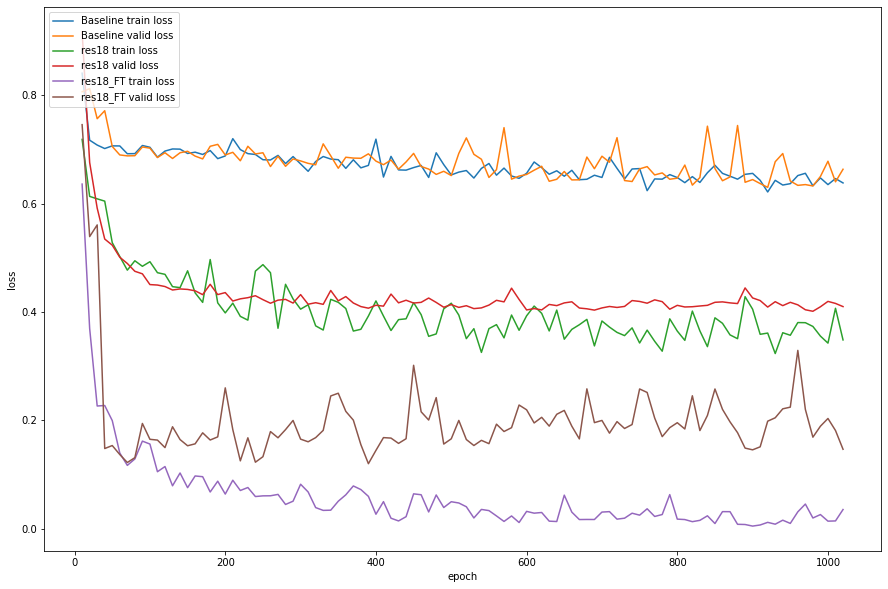

In [ ]:
plt.figure(figsize = (15,10))

plt.plot(step_axis_base, train_loss_line_base,label='Baseline train loss')
plt.plot(step_axis_base, valid_loss_line_base,label='Baseline valid loss')

plt.plot(step_axis_base, train_loss_line_res18,label='res18 train loss')
plt.plot(step_axis_base, valid_loss_line_res18,label='res18 valid loss')

plt.plot(step_axis_base, train_loss_res18_ft,label='res18_FT train loss')
plt.plot(step_axis_base, valid_loss_res18_ft,label='res18_FT valid loss')

plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(loc = 2)

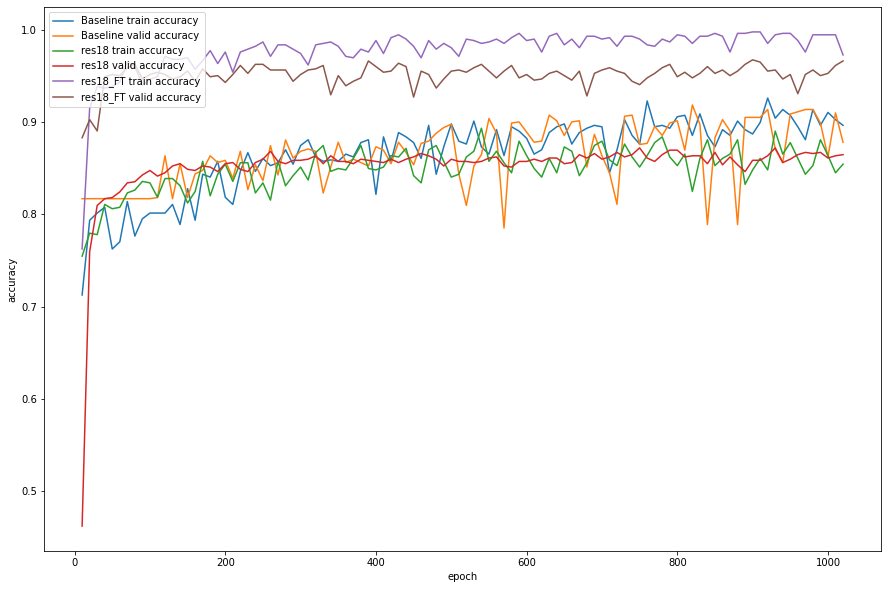

In [ ]:
plt.figure(figsize = (15,10))

plt.plot(step_axis_base, train_accu_line_base,label='Baseline train accuracy')
plt.plot(step_axis_base, valid_accu_line_base,label='Baseline valid accuracy')

plt.plot(step_axis_base, train_accu_line_res18,label='res18 train accuracy')
plt.plot(step_axis_base, valid_accu_line_res18,label='res18 valid accuracy')

plt.plot(step_axis_base, train_accu_res18_ft,label='res18_FT train accuracy')
plt.plot(step_axis_base, valid_accu_res18ft,label='res18_FT valid accuracy')

plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend(loc = 2)

#Augmentation method

##Image augmentation 1 based on Baseline model


In [ ]:
transf_1 = transforms.Compose(
    [transforms.Resize((32,32)), transforms.ToTensor(),transforms.RandomHorizontalFlip(p=0.9)])

train_dataest = MaskDataset_clip(data_train_path, transforms=transf_1)
valid_dataest = MaskDataset_clip(data_valid_path, transforms=transf_1)

bs = 64

train_loader = DataLoader(train_dataest, batch_size=bs, shuffle=True, num_workers=4, pin_memory=True)
valid_loader = DataLoader(valid_dataest, batch_size=1, shuffle=False, num_workers=4, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

class Baseline_RGB(nn.Module):
    def __init__(self):
        super(Baseline_RGB, self).__init__()
        self.cnn_model = nn.Sequential(
            
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3, stride=1, padding=1), 
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.MaxPool2d(2, 2, padding=0),

            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1),  
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1),  
            nn.BatchNorm2d(128),
            nn.ReLU(),
            
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1), 
            nn.BatchNorm2d(256),
            nn.ReLU(),

            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=1, padding=1), 
            nn.BatchNorm2d(512),
            nn.ReLU(),
            
            nn.AvgPool2d(16, 16)
        )
    
        d_in, d_out = 512, 3
        
        self.fc_layer = nn.Sequential(
            nn.Linear(d_in, 512),
            nn.ReLU(),
            nn.Dropout(0.5),

            nn.Linear(512, d_out),
            nn.Sigmoid()

        )



    def forward(self, x):
    
        # out_dim = in_dim - kernel_size + 1  
        x = self.cnn_model(x)    
        x = x.view(-1,512)
        #x= x.float()

        x = self.fc_layer(x)
        #x= x.float()
        return x


In [ ]:
model = Baseline_RGB().to(device)
num_epochs = 20
best_val_accu = None
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters())
save_path = f'/content/drive/My Drive/comp4211/proj1/baseline_tf1.pt'

step_base_tf1 ,train_loss_base_tf1 ,valid_loss_base_tf1,train_accu_base_tf1, valid_accu_base_tf1 = TRAIN(model, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_accu, device, save_path)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf1.pt
Epoch [1/20], Train Loss: 0.8060, Train Acc: 0.7141, Valid Loss: 0.9005,  Valid Acc: 0.5399



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf1.pt
Epoch [1/20], Train Loss: 0.6630, Train Acc: 0.8953, Valid Loss: 0.8099,  Valid Acc: 0.6196



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf1.pt
Epoch [1/20], Train Loss: 0.6494, Train Acc: 0.9047, Valid Loss: 0.7331,  Valid Acc: 0.8110



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf1.pt
Epoch [1/20], Train Loss: 0.6276, Train Acc: 0.9234, Valid Loss: 0.6336,  Valid Acc: 0.9190



Epoch [1/20], Train Loss: 0.6676, Train Acc: 0.8859, Valid Loss: 0.6658,  Valid Acc: 0.8822




Epoch [2/20], Train Loss: 0.6520, Train Acc: 0.8875, Valid Loss: 0.6413,  Valid Acc: 0.9067



Epoch [2/20], Train Loss: 0.6560, Train Acc: 0.8922, Valid Loss: 0.6624,  Valid Acc: 0.8859



Epoch [2/20], Train Loss: 0.6148, Train Acc: 0.9344, Valid Loss: 0.7102,  Valid Acc: 0.8368



Epoch [2/20], Train Loss: 0.6083, Train Acc: 0.9438, Valid Loss: 0.6312,  Valid Acc: 0.9166



Epoch [2/20], Train Loss: 0.6521, Train Acc: 0.8906, Valid Loss: 0.6573,  Valid Acc: 0.8908




Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf1.pt
Epoch [3/20], Train Loss: 0.6498, Train Acc: 0.8891, Valid Loss: 0.6268,  Valid Acc: 0.9239



Epoch [3/20], Train Loss: 0.6111, Train Acc: 0.9359, Valid Loss: 0.6371,  Valid Acc: 0.9117



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf1.pt
Epoch [3/20], Train Loss: 0.6216, Train Acc: 0.9266, Valid Loss: 0.6230,  Valid Acc: 0.9264



Epoch [3/20], Train Loss: 0.6293, Train Acc: 0.9187, Valid Loss: 0.6553,  Valid Acc: 0.8896



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf1.pt
Epoch [3/20], Train Loss: 0.6153, Train Acc: 0.9344, Valid Loss: 0.6223,  Valid Acc: 0.9301




Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf1.pt
Epoch [4/20], Train Loss: 0.6294, Train Acc: 0.9078, Valid Loss: 0.6161,  Valid Acc: 0.9325



Epoch [4/20], Train Loss: 0.6152, Train Acc: 0.9297, Valid Loss: 0.7120,  Valid Acc: 0.8344



Epoch [4/20], Train Loss: 0.6241, Train Acc: 0.9250, Valid Loss: 0.6197,  Valid Acc: 0.9301



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf1.pt
Epoch [4/20], Train Loss: 0.6230, Train Acc: 0.9250, Valid Loss: 0.6183,  Valid Acc: 0.9374



Epoch [4/20], Train Loss: 0.6147, Train Acc: 0.9406, Valid Loss: 0.6154,  Valid Acc: 0.9362




Epoch [5/20], Train Loss: 0.6179, Train Acc: 0.9219, Valid Loss: 0.6317,  Valid Acc: 0.9117



Epoch [5/20], Train Loss: 0.6228, Train Acc: 0.9297, Valid Loss: 0.6401,  Valid Acc: 0.9055



Epoch [5/20], Train Loss: 0.6165, Train Acc: 0.9328, Valid Loss: 0.6194,  Valid Acc: 0.9313



Epoch [5/20], Train Loss: 0.6180, Train Acc: 0.9328, Valid Loss: 0.6279,  Valid Acc: 0.9215



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf1.pt
Epoch [5/20], Train Loss: 0.6175, Train Acc: 0.9344, Valid Loss: 0.6132,  Valid Acc: 0.9399




Epoch [6/20], Train Loss: 0.6214, Train Acc: 0.9187, Valid Loss: 0.6139,  Valid Acc: 0.9325



Epoch [6/20], Train Loss: 0.6081, Train Acc: 0.9469, Valid Loss: 0.6137,  Valid Acc: 0.9362



Epoch [6/20], Train Loss: 0.6054, Train Acc: 0.9422, Valid Loss: 0.6521,  Valid Acc: 0.8957



Epoch [6/20], Train Loss: 0.6289, Train Acc: 0.9156, Valid Loss: 0.6278,  Valid Acc: 0.9190



Epoch [6/20], Train Loss: 0.6154, Train Acc: 0.9344, Valid Loss: 0.6193,  Valid Acc: 0.9301




Epoch [7/20], Train Loss: 0.6180, Train Acc: 0.9219, Valid Loss: 0.6561,  Valid Acc: 0.8859



Epoch [7/20], Train Loss: 0.6295, Train Acc: 0.9172, Valid Loss: 0.6183,  Valid Acc: 0.9313



Epoch [7/20], Train Loss: 0.6058, Train Acc: 0.9438, Valid Loss: 0.6130,  Valid Acc: 0.9301



Epoch [7/20], Train Loss: 0.6044, Train Acc: 0.9438, Valid Loss: 0.6495,  Valid Acc: 0.9018



Epoch [7/20], Train Loss: 0.6069, Train Acc: 0.9469, Valid Loss: 0.6586,  Valid Acc: 0.8822




Epoch [8/20], Train Loss: 0.6351, Train Acc: 0.9031, Valid Loss: 0.6110,  Valid Acc: 0.9399



Epoch [8/20], Train Loss: 0.5971, Train Acc: 0.9516, Valid Loss: 0.6119,  Valid Acc: 0.9362



Epoch [8/20], Train Loss: 0.6174, Train Acc: 0.9297, Valid Loss: 0.6105,  Valid Acc: 0.9387



Epoch [8/20], Train Loss: 0.6280, Train Acc: 0.9234, Valid Loss: 0.6199,  Valid Acc: 0.9276



Epoch [8/20], Train Loss: 0.6202, Train Acc: 0.9297, Valid Loss: 0.7289,  Valid Acc: 0.8049




Epoch [9/20], Train Loss: 0.5918, Train Acc: 0.9484, Valid Loss: 0.6117,  Valid Acc: 0.9374



Epoch [9/20], Train Loss: 0.6117, Train Acc: 0.9375, Valid Loss: 0.6136,  Valid Acc: 0.9362



Epoch [9/20], Train Loss: 0.6124, Train Acc: 0.9359, Valid Loss: 0.6206,  Valid Acc: 0.9276



Epoch [9/20], Train Loss: 0.6299, Train Acc: 0.9172, Valid Loss: 0.6324,  Valid Acc: 0.9141



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf1.pt
Epoch [9/20], Train Loss: 0.6232, Train Acc: 0.9266, Valid Loss: 0.6097,  Valid Acc: 0.9411




Epoch [10/20], Train Loss: 0.6010, Train Acc: 0.9422, Valid Loss: 0.6201,  Valid Acc: 0.9264



Epoch [10/20], Train Loss: 0.6033, Train Acc: 0.9500, Valid Loss: 0.6152,  Valid Acc: 0.9350



Epoch [10/20], Train Loss: 0.6182, Train Acc: 0.9328, Valid Loss: 0.6088,  Valid Acc: 0.9411



Epoch [10/20], Train Loss: 0.6087, Train Acc: 0.9406, Valid Loss: 0.6145,  Valid Acc: 0.9374



Epoch [10/20], Train Loss: 0.6057, Train Acc: 0.9438, Valid Loss: 0.6145,  Valid Acc: 0.9362



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf1.pt
Epoch [10/20], Train Loss: 0.5947, Train Acc: 0.9422, Valid Loss: 0.6085,  Valid Acc: 0.9436




Epoch [11/20], Train Loss: 0.5990, Train Acc: 0.9500, Valid Loss: 0.6184,  Valid Acc: 0.9350



Epoch [11/20], Train Loss: 0.6166, Train Acc: 0.9344, Valid Loss: 0.6174,  Valid Acc: 0.9313



Epoch [11/20], Train Loss: 0.6271, Train Acc: 0.9203, Valid Loss: 0.6363,  Valid Acc: 0.9141



Epoch [11/20], Train Loss: 0.6247, Train Acc: 0.9203, Valid Loss: 0.6140,  Valid Acc: 0.9337



Epoch [11/20], Train Loss: 0.6249, Train Acc: 0.9234, Valid Loss: 0.6478,  Valid Acc: 0.8982




Epoch [12/20], Train Loss: 0.6183, Train Acc: 0.9250, Valid Loss: 0.6207,  Valid Acc: 0.9313



Epoch [12/20], Train Loss: 0.6053, Train Acc: 0.9453, Valid Loss: 0.6220,  Valid Acc: 0.9252



Epoch [12/20], Train Loss: 0.6197, Train Acc: 0.9281, Valid Loss: 0.6298,  Valid Acc: 0.9178



Epoch [12/20], Train Loss: 0.6342, Train Acc: 0.9109, Valid Loss: 0.6317,  Valid Acc: 0.9178



Epoch [12/20], Train Loss: 0.6200, Train Acc: 0.9297, Valid Loss: 0.6604,  Valid Acc: 0.8847




Epoch [13/20], Train Loss: 0.6144, Train Acc: 0.9219, Valid Loss: 0.6131,  Valid Acc: 0.9362



Epoch [13/20], Train Loss: 0.6237, Train Acc: 0.9250, Valid Loss: 0.6423,  Valid Acc: 0.9067



Epoch [13/20], Train Loss: 0.6074, Train Acc: 0.9438, Valid Loss: 0.6348,  Valid Acc: 0.9153



Epoch [13/20], Train Loss: 0.6121, Train Acc: 0.9375, Valid Loss: 0.6138,  Valid Acc: 0.9387



Epoch [13/20], Train Loss: 0.6103, Train Acc: 0.9375, Valid Loss: 0.6092,  Valid Acc: 0.9423




Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf1.pt
Epoch [14/20], Train Loss: 0.6019, Train Acc: 0.9313, Valid Loss: 0.6055,  Valid Acc: 0.9485



Epoch [14/20], Train Loss: 0.6100, Train Acc: 0.9375, Valid Loss: 0.6134,  Valid Acc: 0.9411



Epoch [14/20], Train Loss: 0.5963, Train Acc: 0.9563, Valid Loss: 0.6060,  Valid Acc: 0.9436



Epoch [14/20], Train Loss: 0.6028, Train Acc: 0.9484, Valid Loss: 0.6046,  Valid Acc: 0.9448



Epoch [14/20], Train Loss: 0.6039, Train Acc: 0.9453, Valid Loss: 0.6282,  Valid Acc: 0.9190




Epoch [15/20], Train Loss: 0.6094, Train Acc: 0.9313, Valid Loss: 0.6211,  Valid Acc: 0.9301



Epoch [15/20], Train Loss: 0.6070, Train Acc: 0.9422, Valid Loss: 0.6534,  Valid Acc: 0.8957



Epoch [15/20], Train Loss: 0.6204, Train Acc: 0.9297, Valid Loss: 0.6256,  Valid Acc: 0.9227



Epoch [15/20], Train Loss: 0.6113, Train Acc: 0.9391, Valid Loss: 0.6144,  Valid Acc: 0.9362



Epoch [15/20], Train Loss: 0.6031, Train Acc: 0.9516, Valid Loss: 0.6183,  Valid Acc: 0.9288




Epoch [16/20], Train Loss: 0.6126, Train Acc: 0.9281, Valid Loss: 0.6105,  Valid Acc: 0.9387



Epoch [16/20], Train Loss: 0.6080, Train Acc: 0.9438, Valid Loss: 0.6108,  Valid Acc: 0.9374



Epoch [16/20], Train Loss: 0.5952, Train Acc: 0.9578, Valid Loss: 0.6125,  Valid Acc: 0.9374



Epoch [16/20], Train Loss: 0.6122, Train Acc: 0.9391, Valid Loss: 0.6281,  Valid Acc: 0.9215



Epoch [16/20], Train Loss: 0.5898, Train Acc: 0.9609, Valid Loss: 0.6344,  Valid Acc: 0.9141




Epoch [17/20], Train Loss: 0.6216, Train Acc: 0.9187, Valid Loss: 0.6350,  Valid Acc: 0.9153



Epoch [17/20], Train Loss: 0.6261, Train Acc: 0.9219, Valid Loss: 0.6360,  Valid Acc: 0.9141



Epoch [17/20], Train Loss: 0.6160, Train Acc: 0.9359, Valid Loss: 0.6107,  Valid Acc: 0.9423



Epoch [17/20], Train Loss: 0.6039, Train Acc: 0.9453, Valid Loss: 0.6206,  Valid Acc: 0.9288



Epoch [17/20], Train Loss: 0.6022, Train Acc: 0.9500, Valid Loss: 0.6054,  Valid Acc: 0.9472




Epoch [18/20], Train Loss: 0.6140, Train Acc: 0.9281, Valid Loss: 0.6358,  Valid Acc: 0.9092



Epoch [18/20], Train Loss: 0.6055, Train Acc: 0.9422, Valid Loss: 0.6120,  Valid Acc: 0.9374



Epoch [18/20], Train Loss: 0.6138, Train Acc: 0.9359, Valid Loss: 0.6111,  Valid Acc: 0.9362



Epoch [18/20], Train Loss: 0.6048, Train Acc: 0.9484, Valid Loss: 0.6183,  Valid Acc: 0.9313



Epoch [18/20], Train Loss: 0.5992, Train Acc: 0.9531, Valid Loss: 0.6124,  Valid Acc: 0.9362




Epoch [19/20], Train Loss: 0.6121, Train Acc: 0.9313, Valid Loss: 0.6111,  Valid Acc: 0.9399



Epoch [19/20], Train Loss: 0.6146, Train Acc: 0.9375, Valid Loss: 0.6222,  Valid Acc: 0.9288



Epoch [19/20], Train Loss: 0.6141, Train Acc: 0.9375, Valid Loss: 0.6189,  Valid Acc: 0.9313



Epoch [19/20], Train Loss: 0.6072, Train Acc: 0.9438, Valid Loss: 0.6286,  Valid Acc: 0.9190



Epoch [19/20], Train Loss: 0.6165, Train Acc: 0.9344, Valid Loss: 0.6248,  Valid Acc: 0.9264




Epoch [20/20], Train Loss: 0.5974, Train Acc: 0.9438, Valid Loss: 0.6081,  Valid Acc: 0.9411



Epoch [20/20], Train Loss: 0.6162, Train Acc: 0.9328, Valid Loss: 0.6063,  Valid Acc: 0.9448



Epoch [20/20], Train Loss: 0.6196, Train Acc: 0.9328, Valid Loss: 0.6312,  Valid Acc: 0.9166



Epoch [20/20], Train Loss: 0.6123, Train Acc: 0.9359, Valid Loss: 0.6106,  Valid Acc: 0.9399



Epoch [20/20], Train Loss: 0.5937, Train Acc: 0.9563, Valid Loss: 0.6109,  Valid Acc: 0.9374



Epoch [20/20], Train Loss: 0.5989, Train Acc: 0.9422, Valid Loss: 0.6227,  Valid Acc: 0.9252

Finished Training


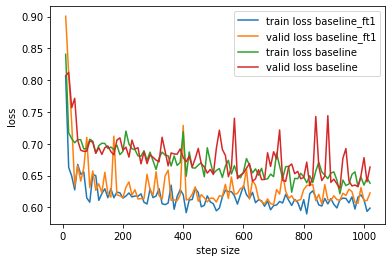

In [ ]:
plt.plot(step_axis_base, train_loss_base_tf1,label='train loss baseline_ft1')
plt.plot(step_axis_base, valid_loss_base_tf1,label='valid loss baseline_ft1')
plt.plot(step_axis_base, train_loss_line_base,label='train loss baseline')
plt.plot(step_axis_base, valid_loss_line_base,label='valid loss baseline')
plt.xlabel('step size')
plt.ylabel('loss')
plt.legend()

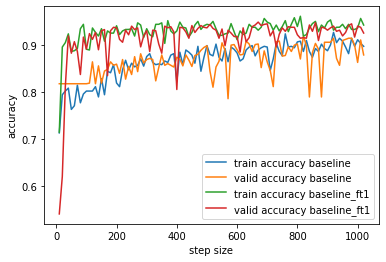

In [ ]:
plt.plot(step_axis_base, train_accu_line_base,label='train accuracy baseline')
plt.plot(step_axis_base, valid_accu_line_base,label='valid accuracy baseline')
plt.plot(step_axis_base, train_accu_base_tf1,label='train accuracy baseline_ft1')
plt.plot(step_axis_base, valid_accu_base_tf1,label='valid accuracy baseline_ft1')


plt.xlabel('step size')
plt.ylabel('accuracy')
plt.legend()

##Image augmentation 2 based on Baseline model

In [ ]:
transf_2 = transforms.Compose(
    [transforms.Resize((32,32)), transforms.ToTensor(),transforms.RandomHorizontalFlip(),transforms.RandomRotation(degrees=(10, 90))])

train_dataest = MaskDataset_clip(data_train_path, transforms=transf_2)
valid_dataest = MaskDataset_clip(data_valid_path, transforms=transf_2)

bs = 64

train_loader = DataLoader(train_dataest, batch_size=bs, shuffle=True, num_workers=4, pin_memory=True)
valid_loader = DataLoader(valid_dataest, batch_size=1, shuffle=False, num_workers=4, pin_memory=True)



/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
model = Baseline_RGB().to(device)
num_epochs = 20
best_val_accu = None
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters())
save_path = f'/content/drive/My Drive/comp4211/proj1/baseline_tf2.pt'

step_base_tf2 ,train_loss_base_tf2 ,valid_loss_base_tf2,train_accu_base_tf2, valid_accu_base_tf2 = TRAIN(model, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_accu, device, save_path)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf2.pt
Epoch [1/20], Train Loss: 0.7844, Train Acc: 0.8047, Valid Loss: 0.7037,  Valid Acc: 0.8503



Epoch [1/20], Train Loss: 0.6448, Train Acc: 0.9187, Valid Loss: 0.7142,  Valid Acc: 0.8344



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf2.pt
Epoch [1/20], Train Loss: 0.6574, Train Acc: 0.8938, Valid Loss: 0.6556,  Valid Acc: 0.8896



Epoch [1/20], Train Loss: 0.6432, Train Acc: 0.9094, Valid Loss: 0.7061,  Valid Acc: 0.8368



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf2.pt
Epoch [1/20], Train Loss: 0.6450, Train Acc: 0.9047, Valid Loss: 0.6454,  Valid Acc: 0.8994




Epoch [2/20], Train Loss: 0.6319, Train Acc: 0.9109, Valid Loss: 0.6532,  Valid Acc: 0.8957



Epoch [2/20], Train Loss: 0.6530, Train Acc: 0.8906, Valid Loss: 0.6684,  Valid Acc: 0.8798



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf2.pt
Epoch [2/20], Train Loss: 0.6434, Train Acc: 0.9031, Valid Loss: 0.6268,  Valid Acc: 0.9215



Epoch [2/20], Train Loss: 0.6324, Train Acc: 0.9141, Valid Loss: 0.6599,  Valid Acc: 0.8896



Epoch [2/20], Train Loss: 0.6366, Train Acc: 0.9203, Valid Loss: 0.6461,  Valid Acc: 0.8969




Epoch [3/20], Train Loss: 0.6342, Train Acc: 0.9047, Valid Loss: 0.6286,  Valid Acc: 0.9166



Epoch [3/20], Train Loss: 0.6228, Train Acc: 0.9281, Valid Loss: 0.6536,  Valid Acc: 0.8982



Epoch [3/20], Train Loss: 0.6520, Train Acc: 0.8922, Valid Loss: 0.6451,  Valid Acc: 0.9031



Epoch [3/20], Train Loss: 0.6386, Train Acc: 0.9156, Valid Loss: 0.6368,  Valid Acc: 0.9080



Epoch [3/20], Train Loss: 0.6587, Train Acc: 0.8938, Valid Loss: 0.7302,  Valid Acc: 0.8184




Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf2.pt
Epoch [4/20], Train Loss: 0.6192, Train Acc: 0.9234, Valid Loss: 0.6166,  Valid Acc: 0.9362



Epoch [4/20], Train Loss: 0.6333, Train Acc: 0.9172, Valid Loss: 0.6255,  Valid Acc: 0.9227



Epoch [4/20], Train Loss: 0.6390, Train Acc: 0.9062, Valid Loss: 0.6330,  Valid Acc: 0.9141



Epoch [4/20], Train Loss: 0.6177, Train Acc: 0.9328, Valid Loss: 0.6184,  Valid Acc: 0.9313



Epoch [4/20], Train Loss: 0.6250, Train Acc: 0.9250, Valid Loss: 0.6497,  Valid Acc: 0.8957




Epoch [5/20], Train Loss: 0.6170, Train Acc: 0.9250, Valid Loss: 0.6362,  Valid Acc: 0.9117



Epoch [5/20], Train Loss: 0.6299, Train Acc: 0.9234, Valid Loss: 0.6322,  Valid Acc: 0.9190



Epoch [5/20], Train Loss: 0.6118, Train Acc: 0.9406, Valid Loss: 0.6456,  Valid Acc: 0.9018



Epoch [5/20], Train Loss: 0.6275, Train Acc: 0.9219, Valid Loss: 0.7809,  Valid Acc: 0.7583



Epoch [5/20], Train Loss: 0.6348, Train Acc: 0.9156, Valid Loss: 0.6667,  Valid Acc: 0.8773




Epoch [6/20], Train Loss: 0.6349, Train Acc: 0.9078, Valid Loss: 0.6440,  Valid Acc: 0.9043



Epoch [6/20], Train Loss: 0.6373, Train Acc: 0.9094, Valid Loss: 0.6565,  Valid Acc: 0.8883



Epoch [6/20], Train Loss: 0.6278, Train Acc: 0.9203, Valid Loss: 0.6295,  Valid Acc: 0.9202



Epoch [6/20], Train Loss: 0.6230, Train Acc: 0.9187, Valid Loss: 0.6171,  Valid Acc: 0.9337



Epoch [6/20], Train Loss: 0.6136, Train Acc: 0.9359, Valid Loss: 0.6272,  Valid Acc: 0.9239




Epoch [7/20], Train Loss: 0.6190, Train Acc: 0.9219, Valid Loss: 0.6273,  Valid Acc: 0.9227



Epoch [7/20], Train Loss: 0.6206, Train Acc: 0.9297, Valid Loss: 0.6287,  Valid Acc: 0.9264



Epoch [7/20], Train Loss: 0.6090, Train Acc: 0.9406, Valid Loss: 0.6902,  Valid Acc: 0.8454



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf2.pt
Epoch [7/20], Train Loss: 0.6362, Train Acc: 0.9125, Valid Loss: 0.6107,  Valid Acc: 0.9387



Epoch [7/20], Train Loss: 0.6201, Train Acc: 0.9297, Valid Loss: 0.6226,  Valid Acc: 0.9252




Epoch [8/20], Train Loss: 0.6160, Train Acc: 0.9234, Valid Loss: 0.6174,  Valid Acc: 0.9337



Epoch [8/20], Train Loss: 0.6305, Train Acc: 0.9172, Valid Loss: 0.6800,  Valid Acc: 0.8638



Epoch [8/20], Train Loss: 0.6241, Train Acc: 0.9250, Valid Loss: 0.6171,  Valid Acc: 0.9350



Epoch [8/20], Train Loss: 0.6274, Train Acc: 0.9219, Valid Loss: 0.6219,  Valid Acc: 0.9276



Epoch [8/20], Train Loss: 0.6136, Train Acc: 0.9359, Valid Loss: 0.6270,  Valid Acc: 0.9227




Epoch [9/20], Train Loss: 0.6256, Train Acc: 0.9156, Valid Loss: 0.6325,  Valid Acc: 0.9190



Epoch [9/20], Train Loss: 0.6188, Train Acc: 0.9297, Valid Loss: 0.6174,  Valid Acc: 0.9337



Epoch [9/20], Train Loss: 0.6246, Train Acc: 0.9219, Valid Loss: 0.6221,  Valid Acc: 0.9276



Epoch [9/20], Train Loss: 0.6163, Train Acc: 0.9313, Valid Loss: 0.6261,  Valid Acc: 0.9227



Epoch [9/20], Train Loss: 0.6137, Train Acc: 0.9359, Valid Loss: 0.6192,  Valid Acc: 0.9301




Epoch [10/20], Train Loss: 0.6136, Train Acc: 0.9266, Valid Loss: 0.6352,  Valid Acc: 0.9129



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf2.pt
Epoch [10/20], Train Loss: 0.6251, Train Acc: 0.9234, Valid Loss: 0.6043,  Valid Acc: 0.9423



Epoch [10/20], Train Loss: 0.6230, Train Acc: 0.9250, Valid Loss: 0.6423,  Valid Acc: 0.9080



Epoch [10/20], Train Loss: 0.6195, Train Acc: 0.9281, Valid Loss: 0.6229,  Valid Acc: 0.9239



Epoch [10/20], Train Loss: 0.5945, Train Acc: 0.9563, Valid Loss: 0.6156,  Valid Acc: 0.9325



Epoch [10/20], Train Loss: 0.6007, Train Acc: 0.9422, Valid Loss: 0.6251,  Valid Acc: 0.9227




Epoch [11/20], Train Loss: 0.6151, Train Acc: 0.9297, Valid Loss: 0.6226,  Valid Acc: 0.9276



Epoch [11/20], Train Loss: 0.6253, Train Acc: 0.9250, Valid Loss: 0.6144,  Valid Acc: 0.9350



Epoch [11/20], Train Loss: 0.6173, Train Acc: 0.9391, Valid Loss: 0.6123,  Valid Acc: 0.9387



Epoch [11/20], Train Loss: 0.6300, Train Acc: 0.9156, Valid Loss: 0.6172,  Valid Acc: 0.9350



Epoch [11/20], Train Loss: 0.6167, Train Acc: 0.9344, Valid Loss: 0.6274,  Valid Acc: 0.9239




Epoch [12/20], Train Loss: 0.6093, Train Acc: 0.9359, Valid Loss: 0.6275,  Valid Acc: 0.9190



Epoch [12/20], Train Loss: 0.6261, Train Acc: 0.9203, Valid Loss: 0.6157,  Valid Acc: 0.9362



Epoch [12/20], Train Loss: 0.6258, Train Acc: 0.9203, Valid Loss: 0.6134,  Valid Acc: 0.9374



Epoch [12/20], Train Loss: 0.6139, Train Acc: 0.9328, Valid Loss: 0.6168,  Valid Acc: 0.9374



Epoch [12/20], Train Loss: 0.6106, Train Acc: 0.9344, Valid Loss: 0.6179,  Valid Acc: 0.9337




Epoch [13/20], Train Loss: 0.5865, Train Acc: 0.9563, Valid Loss: 0.6120,  Valid Acc: 0.9387



Epoch [13/20], Train Loss: 0.6142, Train Acc: 0.9375, Valid Loss: 0.6195,  Valid Acc: 0.9288



Epoch [13/20], Train Loss: 0.6216, Train Acc: 0.9297, Valid Loss: 0.6396,  Valid Acc: 0.9117



Epoch [13/20], Train Loss: 0.6191, Train Acc: 0.9344, Valid Loss: 0.6248,  Valid Acc: 0.9252



Epoch [13/20], Train Loss: 0.6098, Train Acc: 0.9422, Valid Loss: 0.6155,  Valid Acc: 0.9350




Epoch [14/20], Train Loss: 0.6228, Train Acc: 0.9156, Valid Loss: 0.6195,  Valid Acc: 0.9288



Epoch [14/20], Train Loss: 0.6069, Train Acc: 0.9422, Valid Loss: 0.6454,  Valid Acc: 0.8994



Epoch [14/20], Train Loss: 0.6006, Train Acc: 0.9500, Valid Loss: 0.6390,  Valid Acc: 0.9092



Epoch [14/20], Train Loss: 0.6236, Train Acc: 0.9250, Valid Loss: 0.6211,  Valid Acc: 0.9325



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf2.pt
Epoch [14/20], Train Loss: 0.6109, Train Acc: 0.9375, Valid Loss: 0.6042,  Valid Acc: 0.9460




Epoch [15/20], Train Loss: 0.6224, Train Acc: 0.9172, Valid Loss: 0.6047,  Valid Acc: 0.9460



Epoch [15/20], Train Loss: 0.5975, Train Acc: 0.9531, Valid Loss: 0.6237,  Valid Acc: 0.9252



Epoch [15/20], Train Loss: 0.6047, Train Acc: 0.9500, Valid Loss: 0.6138,  Valid Acc: 0.9350



Epoch [15/20], Train Loss: 0.6104, Train Acc: 0.9391, Valid Loss: 0.6146,  Valid Acc: 0.9325



Epoch [15/20], Train Loss: 0.6160, Train Acc: 0.9344, Valid Loss: 0.6173,  Valid Acc: 0.9350




Epoch [16/20], Train Loss: 0.6108, Train Acc: 0.9266, Valid Loss: 0.6155,  Valid Acc: 0.9337



Epoch [16/20], Train Loss: 0.6370, Train Acc: 0.9141, Valid Loss: 0.6103,  Valid Acc: 0.9399



Epoch [16/20], Train Loss: 0.6060, Train Acc: 0.9453, Valid Loss: 0.6316,  Valid Acc: 0.9178



Epoch [16/20], Train Loss: 0.6079, Train Acc: 0.9375, Valid Loss: 0.6145,  Valid Acc: 0.9374



Epoch [16/20], Train Loss: 0.6098, Train Acc: 0.9344, Valid Loss: 0.6078,  Valid Acc: 0.9399




Epoch [17/20], Train Loss: 0.6005, Train Acc: 0.9359, Valid Loss: 0.6117,  Valid Acc: 0.9350



Epoch [17/20], Train Loss: 0.5942, Train Acc: 0.9563, Valid Loss: 0.6166,  Valid Acc: 0.9337



Epoch [17/20], Train Loss: 0.6049, Train Acc: 0.9438, Valid Loss: 0.6110,  Valid Acc: 0.9337



Epoch [17/20], Train Loss: 0.6152, Train Acc: 0.9344, Valid Loss: 0.6327,  Valid Acc: 0.9141



Epoch [17/20], Train Loss: 0.6226, Train Acc: 0.9281, Valid Loss: 0.6107,  Valid Acc: 0.9374




Epoch [18/20], Train Loss: 0.6108, Train Acc: 0.9266, Valid Loss: 0.6097,  Valid Acc: 0.9374



Epoch [18/20], Train Loss: 0.6045, Train Acc: 0.9453, Valid Loss: 0.6098,  Valid Acc: 0.9387



Epoch [18/20], Train Loss: 0.6088, Train Acc: 0.9422, Valid Loss: 0.6079,  Valid Acc: 0.9448



Epoch [18/20], Train Loss: 0.6044, Train Acc: 0.9453, Valid Loss: 0.6229,  Valid Acc: 0.9276



Epoch [18/20], Train Loss: 0.6289, Train Acc: 0.9203, Valid Loss: 0.6276,  Valid Acc: 0.9252




Epoch [19/20], Train Loss: 0.6127, Train Acc: 0.9297, Valid Loss: 0.6134,  Valid Acc: 0.9374



Epoch [19/20], Train Loss: 0.5979, Train Acc: 0.9516, Valid Loss: 0.6173,  Valid Acc: 0.9325



Epoch [19/20], Train Loss: 0.6186, Train Acc: 0.9266, Valid Loss: 0.6124,  Valid Acc: 0.9399



Epoch [19/20], Train Loss: 0.6212, Train Acc: 0.9281, Valid Loss: 0.6158,  Valid Acc: 0.9350



Epoch [19/20], Train Loss: 0.5972, Train Acc: 0.9500, Valid Loss: 0.6056,  Valid Acc: 0.9460




Epoch [20/20], Train Loss: 0.6151, Train Acc: 0.9281, Valid Loss: 0.6105,  Valid Acc: 0.9374



Epoch [20/20], Train Loss: 0.5968, Train Acc: 0.9500, Valid Loss: 0.6089,  Valid Acc: 0.9436



Epoch [20/20], Train Loss: 0.6202, Train Acc: 0.9297, Valid Loss: 0.6087,  Valid Acc: 0.9411



Epoch [20/20], Train Loss: 0.5920, Train Acc: 0.9625, Valid Loss: 0.6343,  Valid Acc: 0.9166



Epoch [20/20], Train Loss: 0.6124, Train Acc: 0.9391, Valid Loss: 0.6105,  Valid Acc: 0.9399



Epoch [20/20], Train Loss: 0.6218, Train Acc: 0.9203, Valid Loss: 0.6125,  Valid Acc: 0.9362

Finished Training


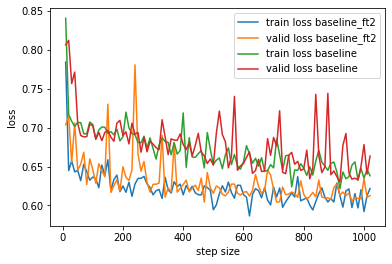

In [ ]:
plt.plot(step_axis_base, train_loss_base_tf2,label='train loss baseline_ft2')
plt.plot(step_axis_base, valid_loss_base_tf2,label='valid loss baseline_ft2')
plt.plot(step_axis_base, train_loss_line_base,label='train loss baseline')
plt.plot(step_axis_base, valid_loss_line_base,label='valid loss baseline')
plt.xlabel('step size')
plt.ylabel('loss')
plt.legend()

##Image augmentation 3 based on Baseline model

In [ ]:
transf_3 = transforms.Compose(
    [transforms.Resize((32,32)), transforms.ToTensor(),transforms.RandomHorizontalFlip(),transforms.ColorJitter(brightness=.5, contrast=.5, saturation=.5, hue=.5)])

train_dataest = MaskDataset_clip(data_train_path, transforms=transf_3)
valid_dataest = MaskDataset_clip(data_valid_path, transforms=transf_3)

bs = 64

train_loader = DataLoader(train_dataest, batch_size=bs, shuffle=True, num_workers=4, pin_memory=True)
valid_loader = DataLoader(valid_dataest, batch_size=1, shuffle=False, num_workers=4, pin_memory=True)


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
model = Baseline_RGB().to(device)
num_epochs = 20
best_val_accu = None
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters())
save_path = f'/content/drive/My Drive/comp4211/proj1/baseline_tf3.pt'

step_base_tf3 ,train_loss_base_tf3 ,valid_loss_base_tf3,train_accu_base_tf3, valid_accu_base_tf3 = TRAIN(model, train_loader, valid_loader, num_epochs, criterion, optimizer, best_val_accu, device, save_path)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [1/20], Train Loss: 0.8432, Train Acc: 0.7188, Valid Loss: 0.7576,  Valid Acc: 0.8172



Epoch [1/20], Train Loss: 0.7436, Train Acc: 0.7953, Valid Loss: 0.7299,  Valid Acc: 0.8172



Epoch [1/20], Train Loss: 0.7710, Train Acc: 0.7438, Valid Loss: 0.7089,  Valid Acc: 0.8172



Epoch [1/20], Train Loss: 0.6976, Train Acc: 0.8250, Valid Loss: 0.7081,  Valid Acc: 0.8172



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [1/20], Train Loss: 0.7324, Train Acc: 0.7891, Valid Loss: 0.7093,  Valid Acc: 0.8184




Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [2/20], Train Loss: 0.7342, Train Acc: 0.7781, Valid Loss: 0.6994,  Valid Acc: 0.8429



Epoch [2/20], Train Loss: 0.7161, Train Acc: 0.8219, Valid Loss: 0.7216,  Valid Acc: 0.8110



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [2/20], Train Loss: 0.7087, Train Acc: 0.8281, Valid Loss: 0.6944,  Valid Acc: 0.8466



Epoch [2/20], Train Loss: 0.7060, Train Acc: 0.8328, Valid Loss: 0.7251,  Valid Acc: 0.8049



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [2/20], Train Loss: 0.7037, Train Acc: 0.8422, Valid Loss: 0.6868,  Valid Acc: 0.8626




Epoch [3/20], Train Loss: 0.7060, Train Acc: 0.8250, Valid Loss: 0.6988,  Valid Acc: 0.8503



Epoch [3/20], Train Loss: 0.7129, Train Acc: 0.8297, Valid Loss: 0.7525,  Valid Acc: 0.7755



Epoch [3/20], Train Loss: 0.7176, Train Acc: 0.8359, Valid Loss: 0.6994,  Valid Acc: 0.8466



Epoch [3/20], Train Loss: 0.6915, Train Acc: 0.8531, Valid Loss: 0.7612,  Valid Acc: 0.7779



Epoch [3/20], Train Loss: 0.6984, Train Acc: 0.8406, Valid Loss: 0.6935,  Valid Acc: 0.8540




Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [4/20], Train Loss: 0.6813, Train Acc: 0.8469, Valid Loss: 0.6674,  Valid Acc: 0.8798



Epoch [4/20], Train Loss: 0.6906, Train Acc: 0.8547, Valid Loss: 0.7969,  Valid Acc: 0.7264



Epoch [4/20], Train Loss: 0.6783, Train Acc: 0.8766, Valid Loss: 0.6736,  Valid Acc: 0.8724



Epoch [4/20], Train Loss: 0.6625, Train Acc: 0.8828, Valid Loss: 0.8293,  Valid Acc: 0.6945



Epoch [4/20], Train Loss: 0.6977, Train Acc: 0.8516, Valid Loss: 0.6712,  Valid Acc: 0.8761




Epoch [5/20], Train Loss: 0.6858, Train Acc: 0.8500, Valid Loss: 0.7508,  Valid Acc: 0.7853



Epoch [5/20], Train Loss: 0.7295, Train Acc: 0.8094, Valid Loss: 0.6927,  Valid Acc: 0.8515



Epoch [5/20], Train Loss: 0.6605, Train Acc: 0.8813, Valid Loss: 0.6717,  Valid Acc: 0.8675



Epoch [5/20], Train Loss: 0.6823, Train Acc: 0.8641, Valid Loss: 0.7016,  Valid Acc: 0.8429



Epoch [5/20], Train Loss: 0.6788, Train Acc: 0.8609, Valid Loss: 0.7346,  Valid Acc: 0.8025




Epoch [6/20], Train Loss: 0.6766, Train Acc: 0.8594, Valid Loss: 0.6876,  Valid Acc: 0.8528



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [6/20], Train Loss: 0.6708, Train Acc: 0.8750, Valid Loss: 0.6557,  Valid Acc: 0.8920



Epoch [6/20], Train Loss: 0.6632, Train Acc: 0.8859, Valid Loss: 0.6531,  Valid Acc: 0.8859



Epoch [6/20], Train Loss: 0.6642, Train Acc: 0.8828, Valid Loss: 0.6687,  Valid Acc: 0.8687



Epoch [6/20], Train Loss: 0.6573, Train Acc: 0.8875, Valid Loss: 0.7884,  Valid Acc: 0.7497




Epoch [7/20], Train Loss: 0.6655, Train Acc: 0.8641, Valid Loss: 0.6573,  Valid Acc: 0.8822



Epoch [7/20], Train Loss: 0.6684, Train Acc: 0.8766, Valid Loss: 0.6654,  Valid Acc: 0.8773



Epoch [7/20], Train Loss: 0.6783, Train Acc: 0.8703, Valid Loss: 0.6949,  Valid Acc: 0.8528



Epoch [7/20], Train Loss: 0.6761, Train Acc: 0.8672, Valid Loss: 0.6682,  Valid Acc: 0.8724



Epoch [7/20], Train Loss: 0.6608, Train Acc: 0.8906, Valid Loss: 0.6573,  Valid Acc: 0.8859




Epoch [8/20], Train Loss: 0.6632, Train Acc: 0.8734, Valid Loss: 0.6574,  Valid Acc: 0.8896



Epoch [8/20], Train Loss: 0.6420, Train Acc: 0.9078, Valid Loss: 0.7119,  Valid Acc: 0.8221



Epoch [8/20], Train Loss: 0.6704, Train Acc: 0.8734, Valid Loss: 0.6568,  Valid Acc: 0.8834



Epoch [8/20], Train Loss: 0.6622, Train Acc: 0.8844, Valid Loss: 0.6802,  Valid Acc: 0.8663



Epoch [8/20], Train Loss: 0.6750, Train Acc: 0.8703, Valid Loss: 0.6578,  Valid Acc: 0.8847




Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [9/20], Train Loss: 0.6523, Train Acc: 0.8781, Valid Loss: 0.6515,  Valid Acc: 0.8969



Epoch [9/20], Train Loss: 0.6542, Train Acc: 0.8906, Valid Loss: 0.6649,  Valid Acc: 0.8834



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [9/20], Train Loss: 0.6698, Train Acc: 0.8719, Valid Loss: 0.6462,  Valid Acc: 0.8982



Epoch [9/20], Train Loss: 0.6487, Train Acc: 0.8969, Valid Loss: 0.7123,  Valid Acc: 0.8209



Epoch [9/20], Train Loss: 0.6449, Train Acc: 0.9047, Valid Loss: 0.6702,  Valid Acc: 0.8798




Epoch [10/20], Train Loss: 0.6548, Train Acc: 0.8859, Valid Loss: 0.6670,  Valid Acc: 0.8834



Epoch [10/20], Train Loss: 0.6460, Train Acc: 0.8984, Valid Loss: 0.6795,  Valid Acc: 0.8589



Epoch [10/20], Train Loss: 0.6749, Train Acc: 0.8703, Valid Loss: 0.6614,  Valid Acc: 0.8847



Epoch [10/20], Train Loss: 0.6583, Train Acc: 0.8875, Valid Loss: 0.6642,  Valid Acc: 0.8834


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7faae2a30560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7faae2a30560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/pytho


Epoch [10/20], Train Loss: 0.6592, Train Acc: 0.8844, Valid Loss: 0.6464,  Valid Acc: 0.8908



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [10/20], Train Loss: 0.6460, Train Acc: 0.8938, Valid Loss: 0.6407,  Valid Acc: 0.8994




Epoch [11/20], Train Loss: 0.6534, Train Acc: 0.8875, Valid Loss: 0.7318,  Valid Acc: 0.8025



Epoch [11/20], Train Loss: 0.6634, Train Acc: 0.8766, Valid Loss: 0.6564,  Valid Acc: 0.8822



Epoch [11/20], Train Loss: 0.6609, Train Acc: 0.8844, Valid Loss: 0.6517,  Valid Acc: 0.8945



Epoch [11/20], Train Loss: 0.6590, Train Acc: 0.8813, Valid Loss: 0.6501,  Valid Acc: 0.8945



Epoch [11/20], Train Loss: 0.6490, Train Acc: 0.9016, Valid Loss: 0.6660,  Valid Acc: 0.8798




Epoch [12/20], Train Loss: 0.6383, Train Acc: 0.9000, Valid Loss: 0.6614,  Valid Acc: 0.8834



Epoch [12/20], Train Loss: 0.6611, Train Acc: 0.8828, Valid Loss: 0.6484,  Valid Acc: 0.8994



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [12/20], Train Loss: 0.6452, Train Acc: 0.8969, Valid Loss: 0.6437,  Valid Acc: 0.9031



Epoch [12/20], Train Loss: 0.6402, Train Acc: 0.9094, Valid Loss: 0.6438,  Valid Acc: 0.9018



Epoch [12/20], Train Loss: 0.6618, Train Acc: 0.8844, Valid Loss: 0.6516,  Valid Acc: 0.8957




Epoch [13/20], Train Loss: 0.6573, Train Acc: 0.8813, Valid Loss: 0.6814,  Valid Acc: 0.8687


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7faae2a30560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7faae2a30560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/pytho


Epoch [13/20], Train Loss: 0.6462, Train Acc: 0.8984, Valid Loss: 0.6616,  Valid Acc: 0.8785


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7faae2a30560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7faae2a30560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child


Epoch [13/20], Train Loss: 0.6454, Train Acc: 0.9000, Valid Loss: 0.6752,  Valid Acc: 0.8724



Epoch [13/20], Train Loss: 0.6581, Train Acc: 0.8859, Valid Loss: 0.6501,  Valid Acc: 0.8969



Epoch [13/20], Train Loss: 0.6607, Train Acc: 0.8875, Valid Loss: 0.7436,  Valid Acc: 0.7730




Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [14/20], Train Loss: 0.6401, Train Acc: 0.8906, Valid Loss: 0.6392,  Valid Acc: 0.9055



Epoch [14/20], Train Loss: 0.6445, Train Acc: 0.9062, Valid Loss: 0.6449,  Valid Acc: 0.9031



Epoch [14/20], Train Loss: 0.6446, Train Acc: 0.9062, Valid Loss: 0.6486,  Valid Acc: 0.8957



Epoch [14/20], Train Loss: 0.6596, Train Acc: 0.8828, Valid Loss: 0.6538,  Valid Acc: 0.8896



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [14/20], Train Loss: 0.6431, Train Acc: 0.9078, Valid Loss: 0.6403,  Valid Acc: 0.9129




Epoch [15/20], Train Loss: 0.6325, Train Acc: 0.9078, Valid Loss: 0.6593,  Valid Acc: 0.8896



Epoch [15/20], Train Loss: 0.6379, Train Acc: 0.9125, Valid Loss: 0.6518,  Valid Acc: 0.8945



Epoch [15/20], Train Loss: 0.6381, Train Acc: 0.9156, Valid Loss: 0.6394,  Valid Acc: 0.9117



Epoch [15/20], Train Loss: 0.6279, Train Acc: 0.9187, Valid Loss: 0.6381,  Valid Acc: 0.9104



Epoch [15/20], Train Loss: 0.6434, Train Acc: 0.9047, Valid Loss: 0.6485,  Valid Acc: 0.9006




Epoch [16/20], Train Loss: 0.6517, Train Acc: 0.8859, Valid Loss: 0.6440,  Valid Acc: 0.9031



Epoch [16/20], Train Loss: 0.6431, Train Acc: 0.9031, Valid Loss: 0.6578,  Valid Acc: 0.8871


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7faae2a30560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7faae2a30560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/pytho


Epoch [16/20], Train Loss: 0.6505, Train Acc: 0.8984, Valid Loss: 0.6492,  Valid Acc: 0.8945



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [16/20], Train Loss: 0.6433, Train Acc: 0.9016, Valid Loss: 0.6305,  Valid Acc: 0.9202


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7faae2a30560>
Traceback (most recent call last):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7faae2a30560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1316, in _shutdown_workers
    if w.is_alive():
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in


Epoch [16/20], Train Loss: 0.6465, Train Acc: 0.9047, Valid Loss: 0.6361,  Valid Acc: 0.9092




Epoch [17/20], Train Loss: 0.6292, Train Acc: 0.9141, Valid Loss: 0.6381,  Valid Acc: 0.9104



Epoch [17/20], Train Loss: 0.6349, Train Acc: 0.9125, Valid Loss: 0.6334,  Valid Acc: 0.9190



Epoch [17/20], Train Loss: 0.6643, Train Acc: 0.8828, Valid Loss: 0.6590,  Valid Acc: 0.8834



Epoch [17/20], Train Loss: 0.6339, Train Acc: 0.9141, Valid Loss: 0.6574,  Valid Acc: 0.8896



Epoch [17/20], Train Loss: 0.6254, Train Acc: 0.9219, Valid Loss: 0.6520,  Valid Acc: 0.8945




Epoch [18/20], Train Loss: 0.6711, Train Acc: 0.8641, Valid Loss: 0.7809,  Valid Acc: 0.7607



Model saved to /content/drive/My Drive/comp4211/proj1/baseline_tf3.pt
Epoch [18/20], Train Loss: 0.6469, Train Acc: 0.8938, Valid Loss: 0.6261,  Valid Acc: 0.9227



Epoch [18/20], Train Loss: 0.6453, Train Acc: 0.9094, Valid Loss: 0.6510,  Valid Acc: 0.8957



Epoch [18/20], Train Loss: 0.6302, Train Acc: 0.9156, Valid Loss: 0.6407,  Valid Acc: 0.9067



Epoch [18/20], Train Loss: 0.6270, Train Acc: 0.9219, Valid Loss: 0.6602,  Valid Acc: 0.8810




Epoch [19/20], Train Loss: 0.6677, Train Acc: 0.8594, Valid Loss: 0.6451,  Valid Acc: 0.8957



Epoch [19/20], Train Loss: 0.6556, Train Acc: 0.8953, Valid Loss: 0.6566,  Valid Acc: 0.8933



Epoch [19/20], Train Loss: 0.6489, Train Acc: 0.8984, Valid Loss: 0.7474,  Valid Acc: 0.7693



Epoch [19/20], Train Loss: 0.6310, Train Acc: 0.9219, Valid Loss: 0.6295,  Valid Acc: 0.9190



Epoch [19/20], Train Loss: 0.6519, Train Acc: 0.8984, Valid Loss: 0.7473,  Valid Acc: 0.7865




Epoch [20/20], Train Loss: 0.6314, Train Acc: 0.9031, Valid Loss: 0.6436,  Valid Acc: 0.8982



Epoch [20/20], Train Loss: 0.6403, Train Acc: 0.9141, Valid Loss: 0.6510,  Valid Acc: 0.8920



Epoch [20/20], Train Loss: 0.6296, Train Acc: 0.9219, Valid Loss: 0.6701,  Valid Acc: 0.8761



Epoch [20/20], Train Loss: 0.6538, Train Acc: 0.8938, Valid Loss: 0.6419,  Valid Acc: 0.9055



Epoch [20/20], Train Loss: 0.6191, Train Acc: 0.9297, Valid Loss: 0.6477,  Valid Acc: 0.8982



Epoch [20/20], Train Loss: 0.6490, Train Acc: 0.8906, Valid Loss: 0.6468,  Valid Acc: 0.8994

Finished Training


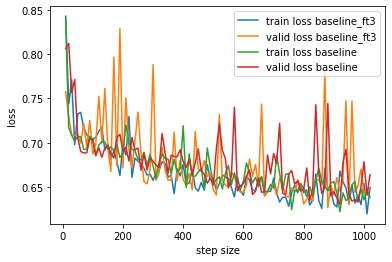

In [ ]:
plt.plot(step_axis_base, train_loss_base_tf3,label='train loss baseline_ft3')
plt.plot(step_axis_base, valid_loss_base_tf3,label='valid loss baseline_ft3')
plt.plot(step_axis_base, train_loss_line_base,label='train loss baseline')
plt.plot(step_axis_base, valid_loss_line_base,label='valid loss baseline')
plt.xlabel('step size')
plt.ylabel('loss')
plt.legend()

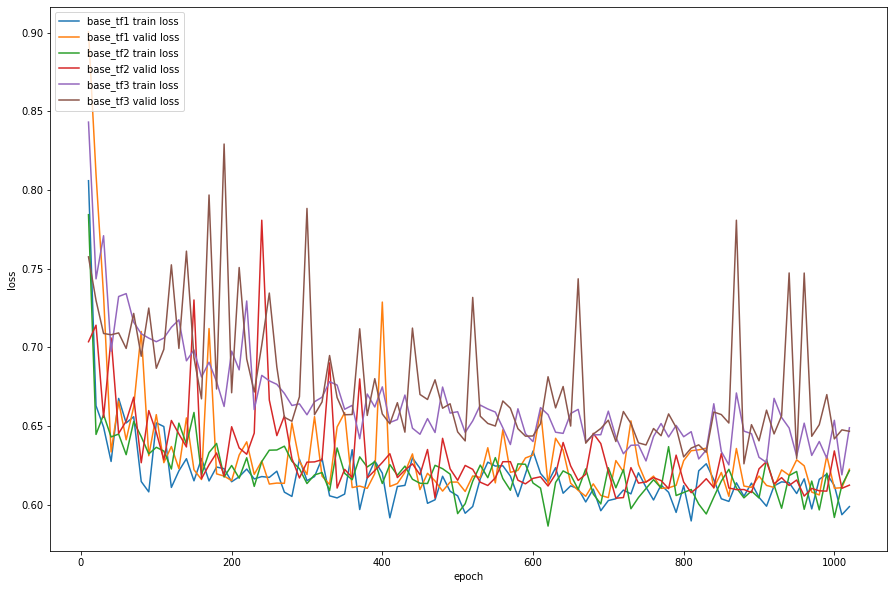

In [ ]:
plt.figure(figsize = (15,10))

plt.plot(step_axis_base, train_loss_base_tf1,label='base_tf1 train loss')
plt.plot(step_axis_base, valid_loss_base_tf1,label='base_tf1 valid loss')

plt.plot(step_axis_base, train_loss_base_tf2,label='base_tf2 train loss')
plt.plot(step_axis_base, valid_loss_base_tf2,label='base_tf2 valid loss')

plt.plot(step_axis_base, train_loss_base_tf3,label='base_tf3 train loss')
plt.plot(step_axis_base, valid_loss_base_tf3,label='base_tf3 valid loss')

plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(loc = 2)

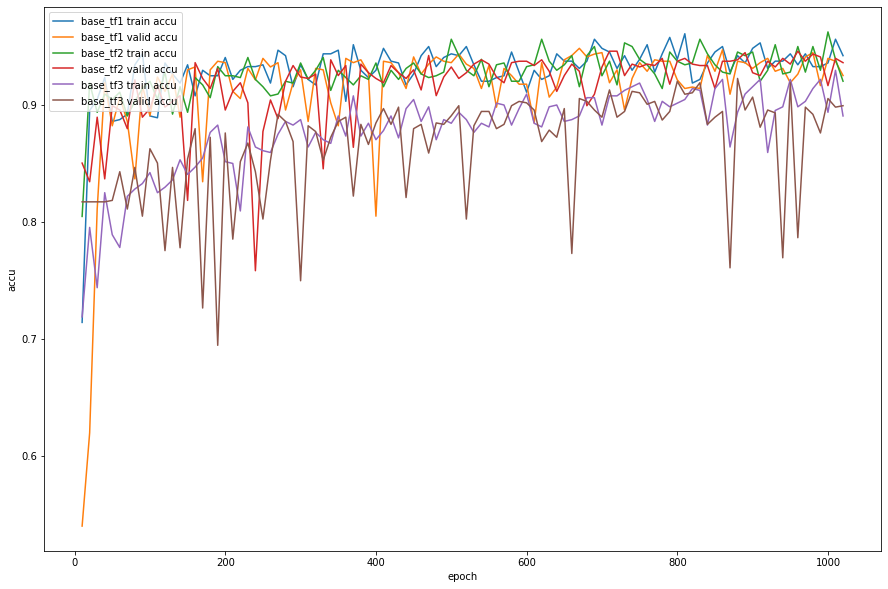

In [ ]:
plt.figure(figsize = (15,10))

plt.plot(step_axis_base, train_accu_base_tf1,label='base_tf1 train accu')
plt.plot(step_axis_base, valid_accu_base_tf1,label='base_tf1 valid accu')

plt.plot(step_axis_base, train_accu_base_tf2,label='base_tf2 train accu')
plt.plot(step_axis_base, valid_accu_base_tf2,label='base_tf2 valid accu')

plt.plot(step_axis_base, train_accu_base_tf3,label='base_tf3 train accu')
plt.plot(step_axis_base, valid_accu_base_tf3,label='base_tf3 valid accu')

plt.xlabel('epoch')
plt.ylabel('accu')
plt.legend(loc = 2)